### Imports

In [21]:
import pandas as pd
import numpy as np
import yfinance as yf
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


import xgboost as xgb
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error
from fredapi import Fred


### Grab Data

In [22]:
#Use yfinance to grab VIX and S&P500 data from 2016-2023
#We want to calculate S&P returns and 

start_date = '2016-01-01'
end_date = '2023-12-31'

df_vix = yf.download('^VIX', start= start_date, end = end_date)
df_spx = yf.download('^GSPC', start=start_date, end=end_date)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [80]:
#Get economic data indicators
from fredapi import Fred
fred = Fred(api_key = 'fd4285a201de47c1efaa681faea2cddd')

data = {}
series = ['CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10','STLFSI4','DCOILWTICO']
for code in series:
    data[code] = fred.get_series(code)
data = pd.DataFrame(data)
data.index.name = 'Date'

daily_dates = pd.date_range(start=data.index.min(), end='2023-12-31', freq='D')
data = data.reindex(daily_dates).asfreq('D').fillna(method='ffill')
data.index.name = 'Date'

### EDA

In [81]:
df_vix

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2016-01-04,22.480000,23.360001,20.670000,20.700001,20.700001,0
2016-01-05,20.750000,21.059999,19.250000,19.340000,19.340000,0
2016-01-06,21.670000,21.860001,19.799999,20.590000,20.590000,0
2016-01-07,23.219999,25.860001,22.400000,24.990000,24.990000,0
2016-01-08,22.959999,27.080000,22.480000,27.010000,27.010000,0
...,...,...,...,...,...,...
2023-12-22,13.720000,13.960000,13.000000,13.030000,13.030000,0
2023-12-26,13.770000,13.800000,12.960000,12.990000,12.990000,0
2023-12-27,13.020000,13.040000,12.370000,12.430000,12.430000,0


In [82]:
#Merge SPX
df_spx.rename(columns={'Close':'SPX'},inplace=True)
df = pd.merge(df_vix,df_spx['SPX'],on='Date')
df = pd.merge(df, data, on ='Date', how = 'left')

In [83]:
df

,Open,High,Low,Close,Adj Close,Volume,SPX,CPIAUCNS,FEDFUNDS,UNRATE,PAYEMS,DFF,TB3MS,GS10,STLFSI4,DCOILWTICO
Date,,,,,,,,,,,,,,,,
2016-01-04,22.480000,23.360001,20.670000,20.700001,20.700001,0,2012.660034,236.916,0.34,4.8,143198.0,0.36,0.26,2.09,0.2449,36.81
2016-01-05,20.750000,21.059999,19.250000,19.340000,19.340000,0,2016.709961,236.916,0.34,4.8,143198.0,0.36,0.26,2.09,0.2449,35.97
2016-01-06,21.670000,21.860001,19.799999,20.590000,20.590000,0,1990.260010,236.916,0.34,4.8,143198.0,0.36,0.26,2.09,0.2449,33.97
2016-01-07,23.219999,25.860001,22.400000,24.990000,24.990000,0,1943.089966,236.916,0.34,4.8,143198.0,0.36,0.26,2.09,0.2449,33.29
2016-01-08,22.959999,27.080000,22.480000,27.010000,27.010000,0,1922.030029,236.916,0.34,4.8,143198.0,0.36,0.26,2.09,0.6386,33.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-22,13.720000,13.960000,13.000000,13.030000,13.030000,0,4754.629883,306.746,5.33,3.7,157232.0,5.33,5.24,4.02,-0.3550,73.29
2023-12-26,13.770000,13.800000,12.960000,12.990000,12.990000,0,4774.750000,306.746,5.33,3.7,157232.0,5.33,5.24,4.02,-0.3550,75.84
2023-12-27,13.020000,13.040000,12.370000,12.430000,12.430000,0,4781.580078,306.746,5.33,3.7,157232.0,5.33,5.24,4.02,-0.3550,74.31


In [84]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,SPX,CPIAUCNS,FEDFUNDS,UNRATE,PAYEMS,DFF,TB3MS,GS10,STLFSI4,DCOILWTICO
count,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.0,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000,2012.000000
mean,18.985989,20.092391,17.920000,18.801764,18.801764,0.0,3258.800263,264.890266,1.566943,4.691103,148492.002982,1.565557,1.590775,2.306610,-0.235264,61.960343
std,7.899041,8.650058,7.123568,7.815429,7.815429,0.0,833.250376,21.775847,1.593706,1.902563,5006.869298,1.596469,1.632381,0.974197,0.650462,19.070499
min,9.010000,9.310000,8.560000,9.140000,9.140000,0.0,1829.079956,236.916000,0.050000,3.400000,130430.000000,0.040000,0.020000,0.620000,-0.937500,-36.980000
25%,13.390000,14.050000,12.827500,13.300000,13.300000,0.0,2584.929993,247.605000,0.200000,3.700000,145165.750000,0.237500,0.267500,1.620000,-0.617700,48.662500
50%,17.240000,18.115001,16.325000,17.015000,17.015000,0.0,3004.994995,257.208000,1.150000,4.000000,148755.000000,1.160000,1.070000,2.210000,-0.363100,59.295000
75%,22.469999,23.775001,21.370001,22.290001,22.290001,0.0,4079.305054,278.802000,2.285000,4.900000,151662.000000,2.330000,2.250000,2.900000,-0.047900,73.407500
max,82.690002,85.470001,70.370003,82.690002,82.690002,0.0,4796.560059,307.789000,5.330000,14.800000,157232.000000,5.330000,5.340000,4.800000,5.413200,123.640000


In [85]:
#no difference in adj close vs close
print((df['Adj Close'] == df['Close']).sum(), len(df))

2012 2012


In [86]:
#check for null values, no DQ issues, everything merged fine
df.isnull().sum()

Open          0
High          0
Low           0
Close         0
Adj Close     0
Volume        0
SPX           0
CPIAUCNS      0
FEDFUNDS      0
UNRATE        0
PAYEMS        0
DFF           0
TB3MS         0
GS10          0
STLFSI4       0
DCOILWTICO    0
dtype: int64

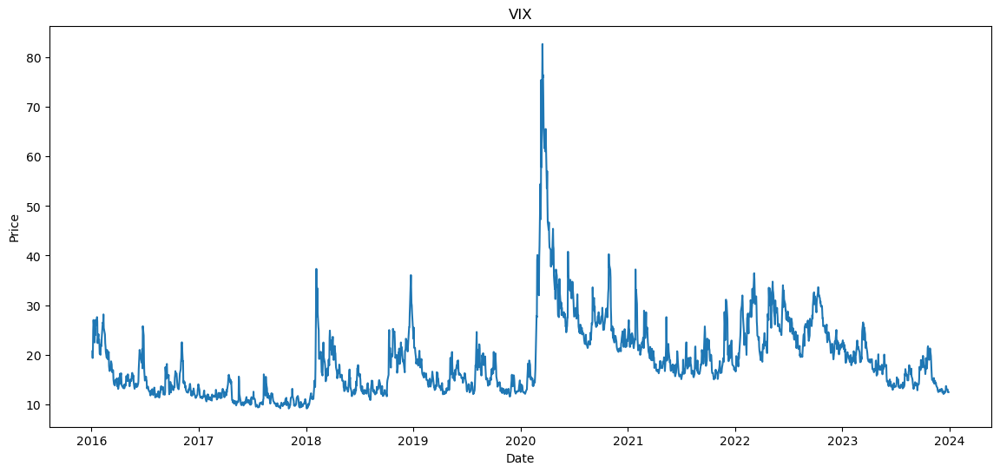

In [87]:
#Plot VIX
plt.figure(figsize=(14,6))
plt.plot(df.index,df['Close'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('VIX')
plt.show()

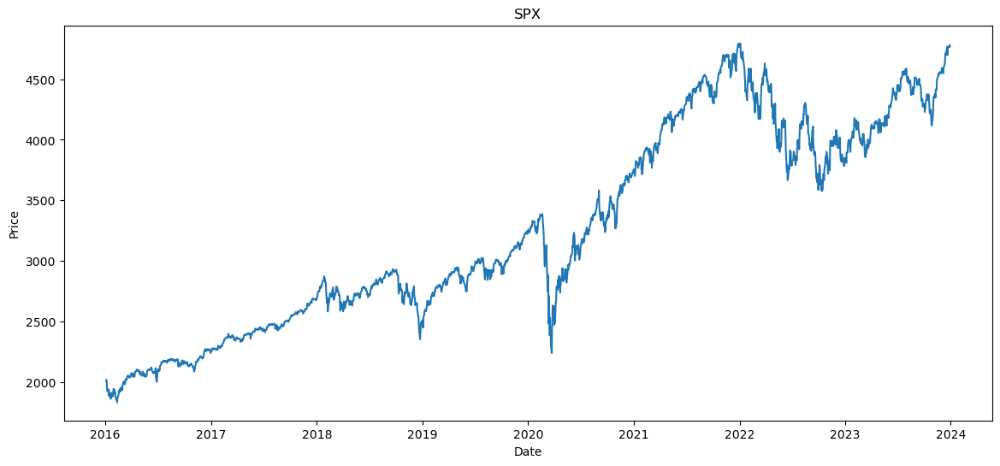

In [88]:
#Plot VIX
plt.figure(figsize=(14,6))
plt.plot(df.index,df['SPX'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('SPX')
plt.show()

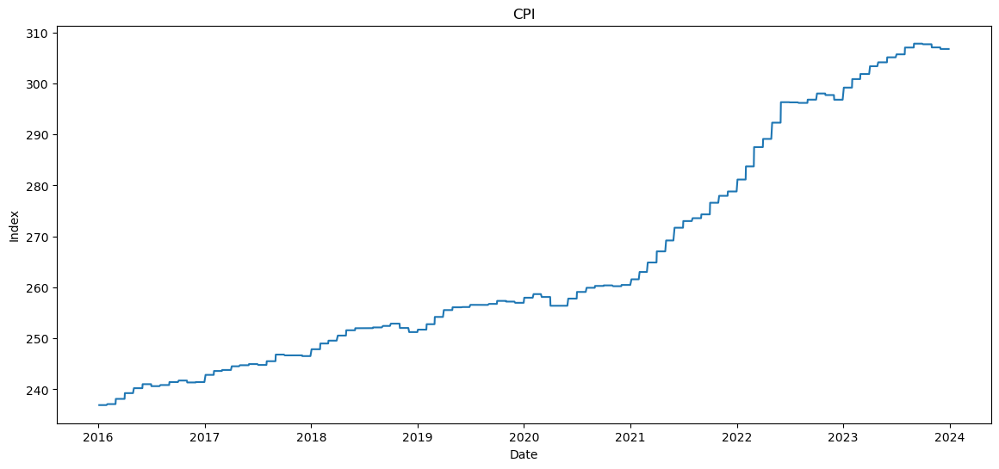

In [89]:
#Plot CPI
plt.figure(figsize=(14,6))
plt.plot(df.index,df['CPIAUCNS'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Index')
plt.title('CPI')
plt.show()

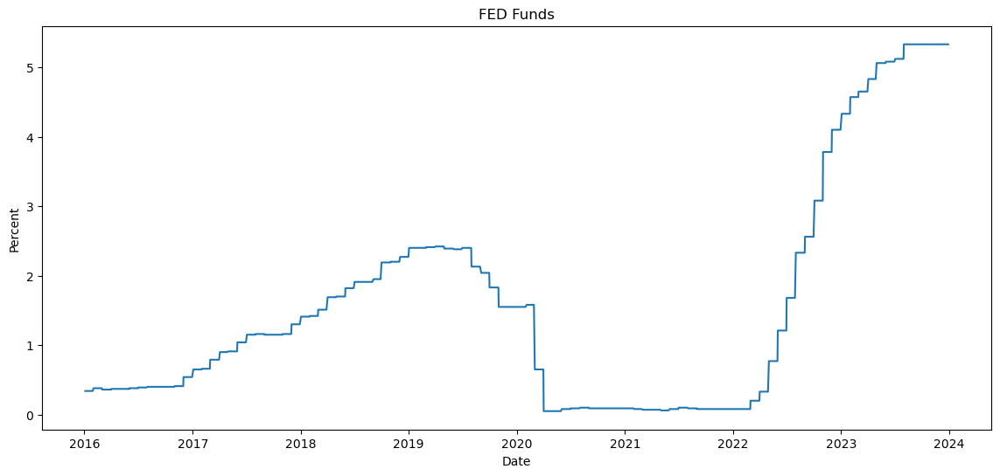

In [90]:
#Plot FedFunds
plt.figure(figsize=(14,6))
plt.plot(df.index,df['FEDFUNDS'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Percent')
plt.title('FED Funds')
plt.show()

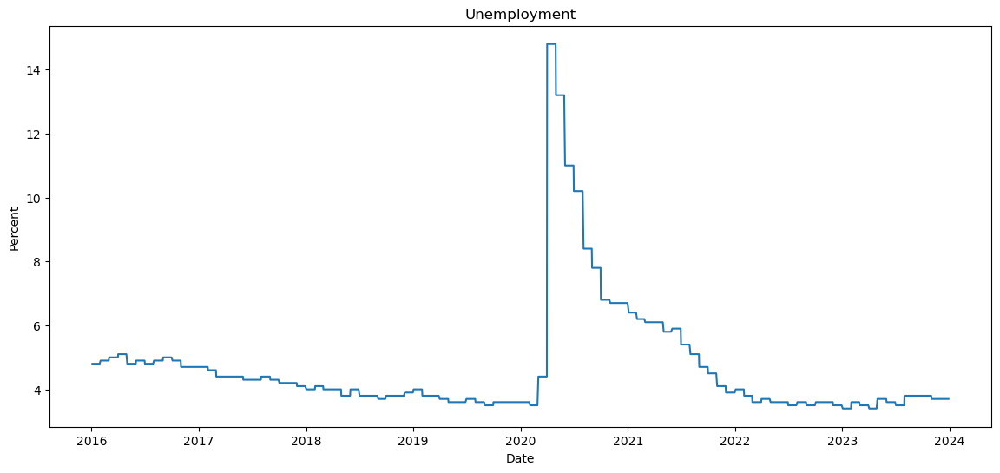

In [91]:
#Plot Unemployment
plt.figure(figsize=(14,6))
plt.plot(df.index,df['UNRATE'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Percent')
plt.title('Unemployment')
plt.show()

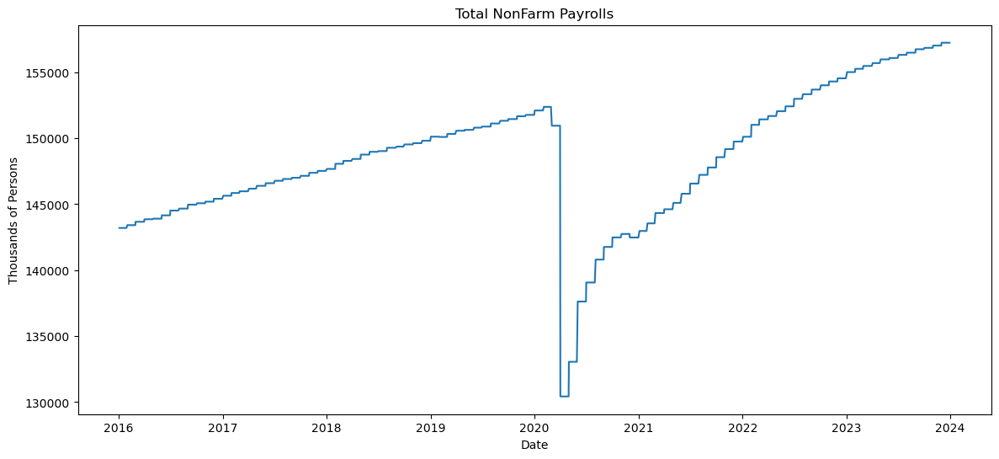

In [92]:
#Plot Payems
plt.figure(figsize=(14,6))
plt.plot(df.index,df['PAYEMS'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Thousands of Persons')
plt.title('Total NonFarm Payrolls')
plt.show()

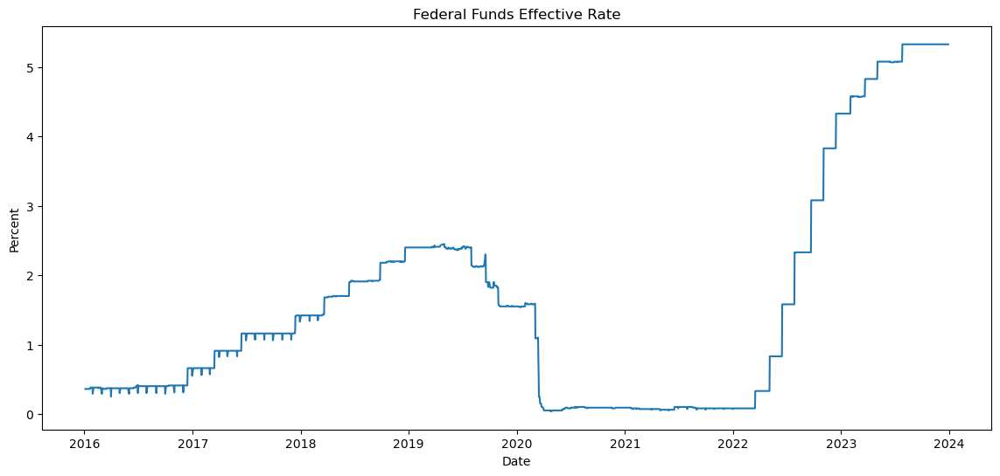

In [93]:
#Plot Effective Fed Funds
plt.figure(figsize=(14,6))
plt.plot(df.index,df['DFF'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Percent')
plt.title('Federal Funds Effective Rate')
plt.show()

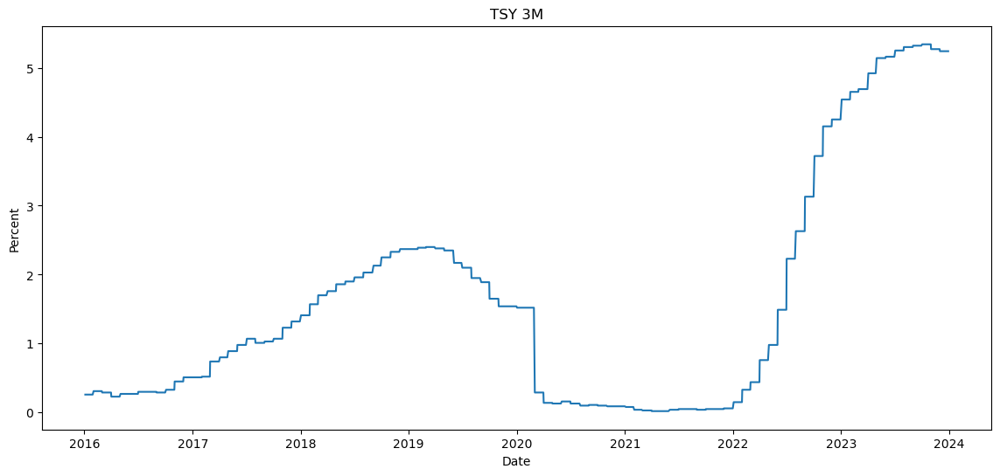

In [94]:
#Plot 3-Month Treasury Rate
plt.figure(figsize=(14,6))
plt.plot(df.index,df['TB3MS'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Percent')
plt.title('TSY 3M')
plt.show()

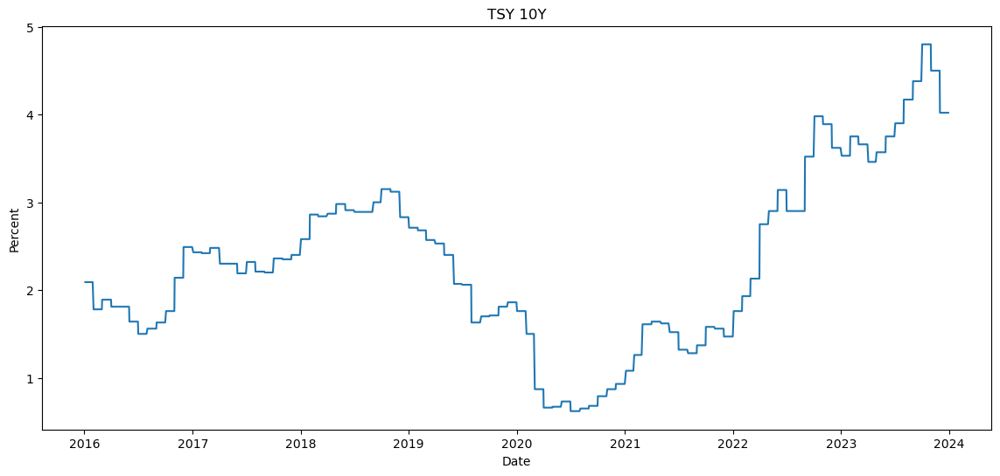

In [95]:
#Plot 10Y Treasury Rate
plt.figure(figsize=(14,6))
plt.plot(df.index,df['GS10'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Percent')
plt.title('TSY 10Y')
plt.show()

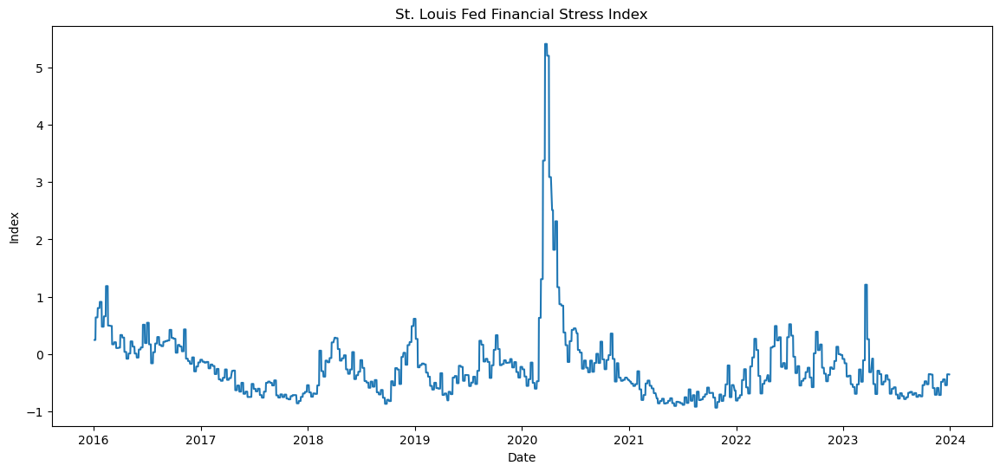

In [98]:
#Plot FED Financial Stress Index
plt.figure(figsize=(14,6))
plt.plot(df.index,df['STLFSI4'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('Index')
plt.title('St. Louis Fed Financial Stress Index')
plt.show()

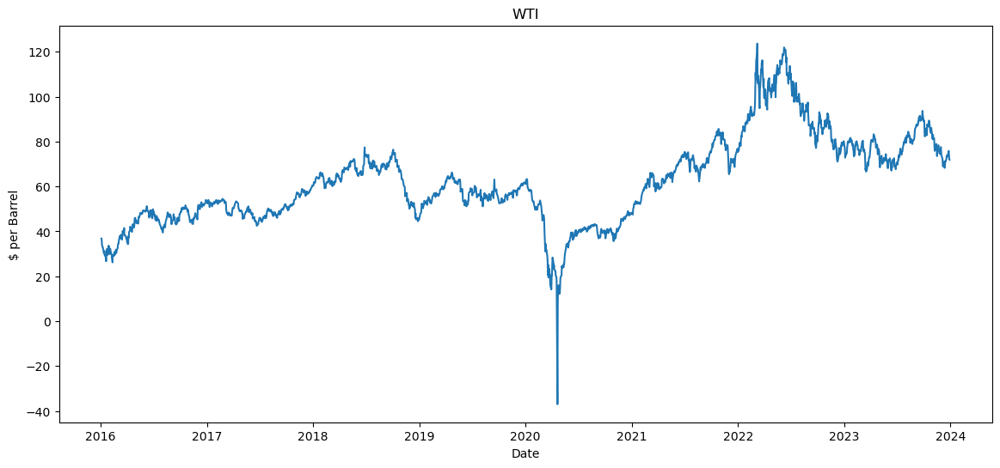

In [99]:
#Plot WTI
plt.figure(figsize=(14,6))
plt.plot(df.index,df['DCOILWTICO'], linestyle ='-')
plt.xlabel('Date')
plt.ylabel('$ per Barrel')
plt.title('WTI')
plt.show()

In [100]:
#We want to predict the next close VIX 
df['Next_Close'] = df['Close'].shift(-1)
df.dropna(inplace=True)

Feature Analysis

In [103]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO', 'Next_Close'],
      dtype='object')

In [104]:
corr_matrix = df[['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO', 'Next_Close']].corr()['Next_Close']

sorted_corr = corr_matrix.abs().sort_values(ascending=False)


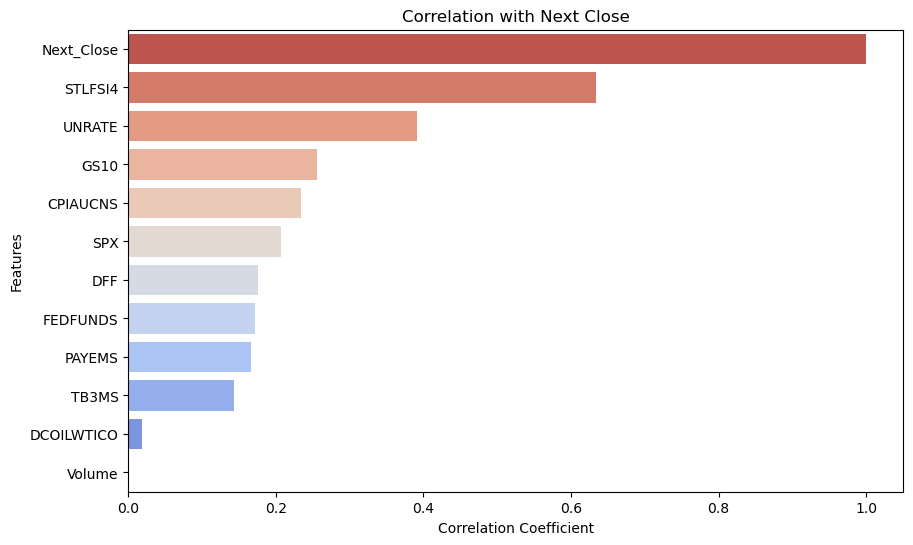

In [105]:
plt.figure(figsize=(10, 6))
sns.barplot(x=sorted_corr.values, y=sorted_corr.index, palette="coolwarm_r")
plt.title(f'Correlation with Next Close')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()

### Time Series Splitting for Cross Validation

In [106]:
from sklearn.model_selection import TimeSeriesSplit

tss = TimeSeriesSplit(n_splits=10,test_size=1)
df = df.sort_index()

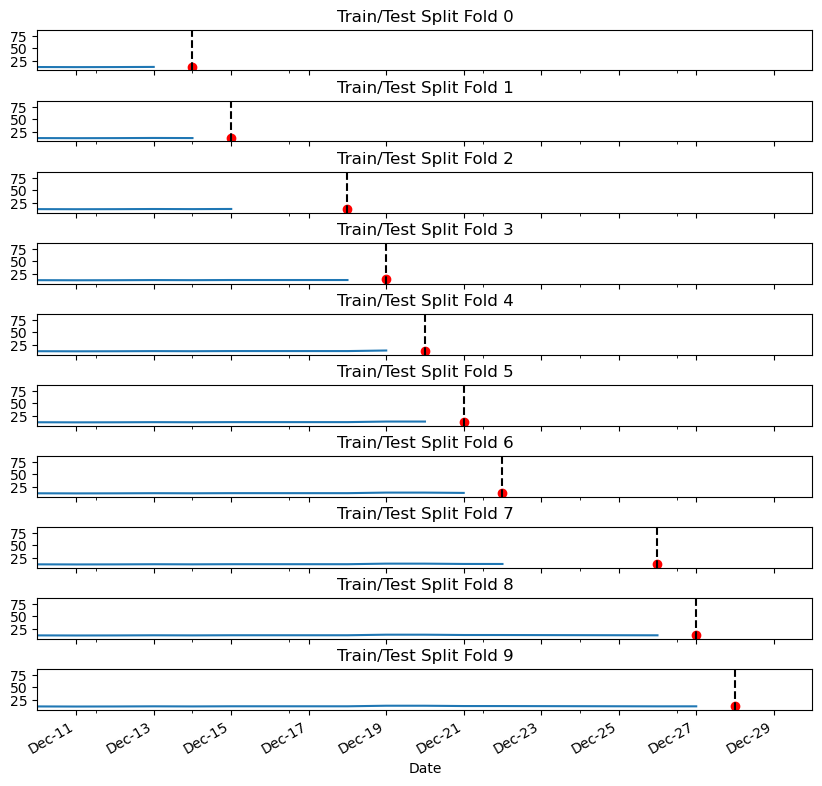

In [107]:
#Implementing a time-series splitting

fig, axs = plt.subplots(10, 1, figsize=(10, 10), sharex=True, gridspec_kw={'hspace': 0.75})

fold = 0
for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]
    train_df['Next_Close'].plot(ax=axs[fold],
                          label='Training Set',
                          title=f'Train/Test Split Fold {fold}')
    
    axs[fold].scatter(test_df.index, test_df['Next_Close'], marker='o', color='red', label='Test Set')

    axs[fold].set_xlim(pd.Timestamp('2023-12-10'), pd.Timestamp('2023-12-30'))
    axs[fold].axvline(test_df.index.min(), color='black', ls='--')
    date_format = mdates.DateFormatter('%b-%d')
    axs[fold].xaxis.set_major_formatter(date_format)

    fold += 1
plt.show()

### XGBOOST Regressor

In [108]:
preds = []
scores = []
actuals = []

for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]

    features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']
    
    target = 'Next_Close'

    X_train = train_df[features]
    y_train = train_df[target]

    X_test = test_df[features]
    y_test = test_df[target]

    model = xgb.XGBRegressor(booster='gbtree',    
                           n_estimators=1000,
                           early_stopping_rounds=50,
                           objective='reg:squarederror',
                           max_depth=3,
                           learning_rate=0.1)

    model.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

    y_pred = model.predict(X_test)
    preds.append(y_pred)
    actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
    actuals.extend(actual_dict)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)


[0]	validation_0-rmse:7.30130	validation_1-rmse:6.60297


[100]	validation_0-rmse:2.03124	validation_1-rmse:1.36040
[175]	validation_0-rmse:1.75510	validation_1-rmse:1.10100
[0]	validation_0-rmse:7.30099	validation_1-rmse:6.31892
[100]	validation_0-rmse:2.01475	validation_1-rmse:1.74522
[200]	validation_0-rmse:1.68321	validation_1-rmse:1.81313
[206]	validation_0-rmse:1.66944	validation_1-rmse:1.81783
[0]	validation_0-rmse:7.30055	validation_1-rmse:6.34504
[100]	validation_0-rmse:2.03936	validation_1-rmse:0.83548
[200]	validation_0-rmse:1.69406	validation_1-rmse:0.12347
[259]	validation_0-rmse:1.56508	validation_1-rmse:0.48258
[0]	validation_0-rmse:7.30013	validation_1-rmse:5.20116
[100]	validation_0-rmse:2.01071	validation_1-rmse:0.46439
[122]	validation_0-rmse:1.93411	validation_1-rmse:0.48896
[0]	validation_0-rmse:7.29925	validation_1-rmse:5.21797
[100]	validation_0-rmse:2.03789	validation_1-rmse:0.24748
[123]	validation_0-rmse:1.94587	validation_1-rmse:0.34176
[0]	validation_0-rmse:7.29838	validation_1-rmse:5.83477
[100]	validation_0-rmse:

In [109]:
y_test_df = pd.DataFrame(actuals)
y_test_df['Error'] = abs((y_test_df['Preds'] - y_test_df['Actual']) / y_test_df['Actual']) * 100

In [110]:
#an r2 score between 0.7 and 1.0 is considered good
r2_score(y_test_df['Actual'],y_test_df['Preds'])

-0.5060366844520916

In [111]:
#On average my model may be off by $11 from the actuals
mean_absolute_error(y_test_df['Actual'],y_test_df['Preds'])

0.27879886627197265

### Parameter Tuning

In [119]:
scores = []
preds = []
actuals = []
df_scores = pd.DataFrame(columns = ['max_depth', 'learning_rate','min_child_weight', 'score'])

for i in (3,4,5):
    for j in (0.1,0.01,0.2):
        for k in (1, 5, 15):

                for train_idx, val_idx in tss.split(df):
                    train_df = df.iloc[train_idx]
                    test_df = df.iloc[val_idx]

                    score = []
                    
                    features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']
                                    
                    target = 'Next_Close'

                    X_train = train_df[features]
                    y_train = train_df[target]

                    X_test = test_df[features]
                    y_test = test_df[target]

                    model = xgb.XGBRegressor(booster='gbtree',    
                                        n_estimators=1000,
                                        early_stopping_rounds=50,
                                        objective='reg:squarederror',
                                        max_depth=i,
                                        learning_rate=j,
                                        min_child_weight = k)

                    model.fit(X_train, y_train,
                        eval_set=[(X_train, y_train), (X_test, y_test)],
                        verbose=0)

                    y_pred = model.predict(X_test)
                    preds.append(y_pred)
                    # actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
                    # actuals.extend(actual_dict)
                    score = np.sqrt(mean_squared_error(y_test, y_pred))
                    scores.append(score)
                    data = {
                        'max_depth': i,
                        'learning_rate': j,
                        'min_child_weight': k,
                        'score': np.mean(scores)
                    }

                    df_scores = df_scores.append(data, ignore_index=True)

                    print(i, ", ", j, ": ",np.mean(scores))


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.05552482604980469
3 ,  0.1 :  0.04531669616699219
3 ,  0.1 :  0.13390159606933594
3 ,  0.1 :  0.10091018676757812
3 ,  0.1 :  0.11613960266113281


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.0969235102335612
3 ,  0.1 :  0.2058882032121931
3 ,  0.1 :  0.3473536968231201
3 ,  0.1 :  0.3448891109890408
3 ,  0.1 :  0.31982765197753904
3 ,  0.1 :  0.30945535139604047


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.2980655034383138
3 ,  0.1 :  0.28543883103590745
3 ,  0.1 :  0.29897267477852957
3 ,  0.1 :  0.31859219868977867
3 ,  0.1 :  0.35752594470977783
3 ,  0.1 :  0.4047025792738971


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.3963858286539714
3 ,  0.1 :  0.38978466234709086
3 ,  0.1 :  0.460269832611084
3 ,  0.1 :  0.48296165466308594
3 ,  0.1 :  0.5216818722811613
3 ,  0.1 :  0.5091089995011039


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.5296084880828857
3 ,  0.1 :  0.5095874786376953
3 ,  0.1 :  0.48998913398155797
3 ,  0.1 :  0.4719170464409722
3 ,  0.1 :  0.4609107289995466


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.4503672369595232
3 ,  0.1 :  0.463189697265625
3 ,  0.1 :  0.45127001116352694
3 ,  0.1 :  0.4374251961708069


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.4802754720052083
3 ,  0.1 :  0.5043382083668428
3 ,  0.1 :  0.4899318695068359
3 ,  0.1 :  0.4957214461432563


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.4826630772771062
3 ,  0.1 :  0.4707869981464587
3 ,  0.1 :  0.45984859955616486
3 ,  0.1 :  0.4509546756744385
3 ,  0.1 :  0.46919492395912726
3 ,  0.1 :  0.48365388597760883


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.4745979752651481
3 ,  0.1 :  0.47683061252940784
3 ,  0.1 :  0.4946834988064236
3 ,  0.1 :  0.5549125671386719
3 ,  0.1 :  0.6217745111343709


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6203783750534058
3 ,  0.1 :  0.6497221576924227
3 ,  0.1 :  0.6367705535888671
3 ,  0.1 :  0.671486873252719


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6661130831791804
3 ,  0.1 :  0.6542919086960127
3 ,  0.1 :  0.6452662856490524
3 ,  0.1 :  0.6336231231689453
3 ,  0.1 :  0.6236103262220111
3 ,  0.1 :  0.6167245162160773


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.608728079960264
3 ,  0.1 :  0.6083411523851298
3 ,  0.1 :  0.6090335528055827
3 ,  0.1 :  0.6149244464811732
3 ,  0.1 :  0.6230165727676884
3 ,  0.1 :  0.6236796606154669
3 ,  0.1 :  0.6230485737323761


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6328764401949369
3 ,  0.1 :  0.6337408296989672
3 ,  0.1 :  0.6326167263201813
3 ,  0.1 :  0.631652271046358
3 ,  0.1 :  0.6493912296018739
3 ,  0.1 :  0.677018301827567
3 ,  0.1 :  0.7055165734089596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7293659051259359
3 ,  0.1 :  0.7576031358274695
3 ,  0.1 :  0.7473812618771115


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7704389190673828
3 ,  0.1 :  0.7622546145790502
3 ,  0.1 :  0.7538255468591467


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.744171264844063
3 ,  0.1 :  0.7541064491754845


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7682950615882873
3 ,  0.1 :  0.797851621368785
3 ,  0.1 :  0.788551109593089
3 ,  0.1 :  0.7791941194649202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7705498309362502
3 ,  0.1 :  0.7855811511769014


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7764490149741949
3 ,  0.1 :  0.7675873876988203


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.779363057830117


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7717597725686063
3 ,  0.1 :  0.7668103430006239
3 ,  0.1 :  0.7815400113116254


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7864746114482051
3 ,  0.1 :  0.7946455863214308


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7904025848875654
3 ,  0.1 :  0.7822580136750874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7747253477573395
3 ,  0.1 :  0.7670219165762675
3 ,  0.1 :  0.7594093692545988
3 ,  0.1 :  0.7521721907336303


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7446548748016357
3 ,  0.1 :  0.7374045778029036
3 ,  0.1 :  0.7301794781404383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.745856266577267
3 ,  0.1 :  0.7684705899311945


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7728645597185407


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7702622233696703


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7750578104892624


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7737757364908854


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7736829442715426
3 ,  0.1 :  0.7692440379749644


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7646867992641689
3 ,  0.1 :  0.76724944795881
3 ,  0.1 :  0.760460254365364


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7575243397762901
3 ,  0.1 :  0.7509743814883025


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7501061620383427
3 ,  0.1 :  0.7536181262415699


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7499306323164601
3 ,  0.1 :  0.7472792152597123


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.746144191424052
3 ,  0.1 :  0.7452849317188105


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7414204175355005
3 ,  0.1 :  0.7354724077674432


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.731653259646508
3 ,  0.1 :  0.7258944473266602
3 ,  0.1 :  0.7202300646948436


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7146105878935085
3 ,  0.1 :  0.7090552598237991
3 ,  0.1 :  0.7056561403496321


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7047914284926194
3 ,  0.1 :  0.7035412242394368


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7082642352942264
3 ,  0.1 :  0.7029562641803483
3 ,  0.1 :  0.6977181648140522


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6927741086041486
3 ,  0.1 :  0.6876971791772282
3 ,  0.1 :  0.6827254469377281


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6891007630721383
3 ,  0.1 :  0.6935694372053627


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6975960459027971
3 ,  0.1 :  0.6926493069804307
3 ,  0.1 :  0.6930538567019181


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6882517221090677
3 ,  0.1 :  0.683478467994266


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6793170073936725
3 ,  0.1 :  0.6747770244128084
3 ,  0.1 :  0.6704123425645893
3 ,  0.1 :  0.6662699918489199


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6621730151592485
3 ,  0.1 :  0.6579346466064453
3 ,  0.1 :  0.6681021886156094


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6705833610735441
3 ,  0.1 :  0.6677482143726224
3 ,  0.1 :  0.6640020531493348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6598033720447171
3 ,  0.1 :  0.6556065082550049
3 ,  0.1 :  0.6515752160625093
3 ,  0.1 :  0.6478616919698594
3 ,  0.1 :  0.6442891906642314


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.640879899263382
3 ,  0.1 :  0.637318694073221
3 ,  0.1 :  0.6356002607463319
3 ,  0.1 :  0.6361764428074375


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6403958215946104
3 ,  0.1 :  0.6442596146554658
3 ,  0.1 :  0.6497643482254212


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6694478246266257
3 ,  0.1 :  0.6859249955131894
3 ,  0.1 :  0.7017199104354226


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7071245473973892


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7087010054560433


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7117210266201995
3 ,  0.1 :  0.7118384355754521


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7139756378086134


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7156863566807338
3 ,  0.1 :  0.7149308052929965


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.713369778994113
3 ,  0.1 :  0.7123308021031068
3 ,  0.1 :  0.7083820470884525


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7044478946261936
3 ,  0.1 :  0.7005972045561226
3 ,  0.1 :  0.6985623391119988
3 ,  0.1 :  0.6948238226885353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6911247191221818
3 ,  0.1 :  0.6874092823750264
3 ,  0.1 :  0.6837847412273448
3 ,  0.1 :  0.6875040186917718
3 ,  0.1 :  0.6853392073448669


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6820707068872199
3 ,  0.1 :  0.6785046426873458
3 ,  0.1 :  0.6749799338934933
3 ,  0.1 :  0.6714847385883331


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6733724762121013
3 ,  0.1 :  0.6848230066987657
3 ,  0.1 :  0.6921183855105669
3 ,  0.1 :  0.6885913829414212
3 ,  0.1 :  0.6915983597034125
3 ,  0.1 :  0.6906272233134568


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6871735175051282
3 ,  0.1 :  0.6931788921356201
3 ,  0.1 :  0.6997849763329349
3 ,  0.1 :  0.6963422227613997
3 ,  0.1 :  0.69302407626448


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6908167483759862
3 ,  0.1 :  0.6924518864329269
3 ,  0.1 :  0.695939554751498
3 ,  0.1 :  0.6939045634246679
3 ,  0.1 :  0.6915815151654757


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6939535460403662
3 ,  0.1 :  0.7014933722359794
3 ,  0.1 :  0.7160705186744437
3 ,  0.1 :  0.7141947206461204


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7132005960168973


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7122444126093499
3 ,  0.1 :  0.70896211224933
3 ,  0.1 :  0.710743921774405


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7083009333105131
3 ,  0.1 :  0.7094192198657114


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.706198060893577
3 ,  0.1 :  0.7031898498535156


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7009605865133294


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7003314860232241
3 ,  0.1 :  0.6985026517791064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6982047174658094
3 ,  0.1 :  0.6999928580390082


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7019229399419464
3 ,  0.1 :  0.7012962433735179


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6991898009651586
3 ,  0.1 :  0.697906706530975


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6968727526457413
3 ,  0.1 :  0.7027928529879748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7000992174806266


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6970945489253098
3 ,  0.1 :  0.6941731607812083


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6945379987676092
3 ,  0.1 :  0.6916476952827583


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6912539920726406
3 ,  0.1 :  0.6903169696070567


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6918003768601677
3 ,  0.1 :  0.6934857885042827


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6969181037048087
3 ,  0.1 :  0.6941916213547887


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.691511664370941
3 ,  0.1 :  0.6888551555696081


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6861045993104273
3 ,  0.1 :  0.6833324199769555
3 ,  0.1 :  0.6806201123998232


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6779163883578393
3 ,  0.1 :  0.675213970812449
3 ,  0.1 :  0.6733147201538086


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.671652463327841
3 ,  0.1 :  0.6702215860760401
3 ,  0.1 :  0.6675899716705201
3 ,  0.1 :  0.6656587405467597
3 ,  0.1 :  0.6636502733417585
3 ,  0.1 :  0.6644160002470016


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6670354405265838
3 ,  0.1 :  0.6657103900761567
3 ,  0.1 :  0.6635040739788512
3 ,  0.1 :  0.6617434134850135
3 ,  0.1 :  0.6598699796245473
3 ,  0.1 :  0.6578625322298239


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6571669052762223
3 ,  0.1 :  0.6569248546253551
3 ,  0.1 :  0.6579988443626548
3 ,  0.1 :  0.6598842950691854
3 ,  0.1 :  0.6583678784888335
3 ,  0.1 :  0.6569223403930664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6611697966281366
3 ,  0.1 :  0.6621906421802662
3 ,  0.1 :  0.6646726193023343
3 ,  0.1 :  0.6630837706958547
3 ,  0.1 :  0.6643219133873126
3 ,  0.1 :  0.6620035241120052


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6596050470525568
3 ,  0.1 :  0.6572380135024803
3 ,  0.1 :  0.6549438173590154
3 ,  0.1 :  0.6531459959290868
3 ,  0.1 :  0.6537979495140814


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6516154357365199
3 ,  0.1 :  0.6493095248619433
3 ,  0.1 :  0.6535163771176169
3 ,  0.1 :  0.6550165048336393


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6527463684619312
3 ,  0.1 :  0.6516038125021416
3 ,  0.1 :  0.649404445728222
3 ,  0.1 :  0.6473060036370147


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6450592875480652
3 ,  0.1 :  0.6431874271907608
3 ,  0.1 :  0.6451033493568157
3 ,  0.1 :  0.64658571354712
3 ,  0.1 :  0.6446941519436771
3 ,  0.1 :  0.6444488955032297


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6461049358860976
3 ,  0.1 :  0.6547478885973914
3 ,  0.1 :  0.6643795709352236
3 ,  0.1 :  0.6639948758212003


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6714600876673756
3 ,  0.1 :  0.6692226690592176
3 ,  0.1 :  0.6771881612141927
3 ,  0.1 :  0.6762408576534436
3 ,  0.1 :  0.6776140794059299


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6778537573987501
3 ,  0.1 :  0.6756399807177091
3 ,  0.1 :  0.6736071477170851
3 ,  0.1 :  0.6721611085280873
3 ,  0.1 :  0.6704698059380249


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6701952265454577
3 ,  0.1 :  0.6701294982317582
3 ,  0.1 :  0.6710915903891287
3 ,  0.1 :  0.6725242099577974
3 ,  0.1 :  0.6724994243719639
3 ,  0.1 :  0.672214410556391


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.674092262413851
3 ,  0.1 :  0.6741425287155878
3 ,  0.1 :  0.6737763368630711
3 ,  0.1 :  0.6734396095155541
3 ,  0.1 :  0.6771572221000239
3 ,  0.1 :  0.6831325483172664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6894364953041077
3 ,  0.1 :  0.6948359718203916
3 ,  0.1 :  0.7013448158406322
3 ,  0.1 :  0.7056082439127352
3 ,  0.1 :  0.7110745936264227


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7097970639742338
3 ,  0.1 :  0.7076793155787181
3 ,  0.1 :  0.7055283409375299


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7058340049371487
3 ,  0.1 :  0.7078020362506159


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7093789158445416
3 ,  0.1 :  0.7072591493497082
3 ,  0.1 :  0.7052827369735901


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7034327332321946
3 ,  0.1 :  0.7061565393459297


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7077069154426233
3 ,  0.1 :  0.7056106527646383
3 ,  0.1 :  0.7103223404474004


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7093473891534748
3 ,  0.1 :  0.7088771611891665
3 ,  0.1 :  0.7129899053012624


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7134179845233817
3 ,  0.1 :  0.7168680297003852


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7148146420804127
3 ,  0.1 :  0.7127416272496068


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7106758366460385
3 ,  0.1 :  0.7087328061892119
3 ,  0.1 :  0.7067264672315087
3 ,  0.1 :  0.7047919815984266


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7031021637356384
3 ,  0.1 :  0.7011013930184501
3 ,  0.1 :  0.6991046269734701


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7029262266375802
3 ,  0.1 :  0.7101964572333749
3 ,  0.1 :  0.7126884541269076


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7137531602886361


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7158141886250357


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7162501150820436


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7155508728666679
3 ,  0.1 :  0.7135593605572799


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7115799321068658


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7096094728506833
3 ,  0.1 :  0.7076846380918724


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.706073774122338
3 ,  0.1 :  0.7041378492837423


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7033693261342506


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7033365306958475
3 ,  0.1 :  0.7023521262228651


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.700606636379076
3 ,  0.1 :  0.7003327346429592


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6995566007253285


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6977129111071482
3 ,  0.1 :  0.6958375054021035


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6944305046633805
3 ,  0.1 :  0.6937128643301081
3 ,  0.1 :  0.6918749923706055


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6900372632006382
3 ,  0.1 :  0.6882118407231743
3 ,  0.1 :  0.6864051970224532


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6874872977626669
3 ,  0.1 :  0.6872973241304097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.689360110465623
3 ,  0.1 :  0.6875560321108833


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6857777189648182
3 ,  0.1 :  0.6839931160211563
3 ,  0.1 :  0.6822426114763532


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6804875512197228
3 ,  0.1 :  0.6820321070747474


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.683290675743339
3 ,  0.1 :  0.6852133978914785


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6834567045554136
3 ,  0.1 :  0.684584802983667


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6844104601412403
3 ,  0.1 :  0.6841748846699567
3 ,  0.1 :  0.6824690000659923
3 ,  0.1 :  0.6807608688933939


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6790667591672955
3 ,  0.1 :  0.6775563838199644
3 ,  0.1 :  0.675942399393973
3 ,  0.1 :  0.6742967137119227
3 ,  0.1 :  0.680694329738617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6809214618140622
3 ,  0.1 :  0.6797101770467426
3 ,  0.1 :  0.6780880556508861
3 ,  0.1 :  0.6764497969410207


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.674874319853606
3 ,  0.1 :  0.67333617703668
3 ,  0.1 :  0.6718985559899332
3 ,  0.1 :  0.6705314341713401
3 ,  0.1 :  0.6691018013616062


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.667554620417153
3 ,  0.1 :  0.6669460514746153
3 ,  0.1 :  0.6675234234448776


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6691253306502003
3 ,  0.1 :  0.6705621889823876
3 ,  0.1 :  0.6728448913758059


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6809897124767303
3 ,  0.1 :  0.6872542241780306
3 ,  0.1 :  0.6940670697882986


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6960658981578163


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6974840709141322
3 ,  0.1 :  0.7017929208533498
3 ,  0.1 :  0.7017707802108114


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7017046768332768


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7031930167720003
3 ,  0.1 :  0.7029022104599897
3 ,  0.1 :  0.7020066713503269


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7014858169913013
3 ,  0.1 :  0.6998494785522746
3 ,  0.1 :  0.6982367122089946
3 ,  0.1 :  0.6966182597847872


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6956358309964846
3 ,  0.1 :  0.6940589282247756
3 ,  0.1 :  0.6924887892831005
3 ,  0.1 :  0.6909320563215264
3 ,  0.1 :  0.6893855062024347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6902850986620702
3 ,  0.1 :  0.6893474199133552
3 ,  0.1 :  0.6879278884086435
3 ,  0.1 :  0.6863739365597249
3 ,  0.1 :  0.684814901785417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6837639949219027
3 ,  0.1 :  0.6843347441556766
3 ,  0.1 :  0.6893244521612507
3 ,  0.1 :  0.6929360531471871
3 ,  0.1 :  0.6913807493917058
3 ,  0.1 :  0.6927026975315248


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6922701103841965
3 ,  0.1 :  0.6907323194401604
3 ,  0.1 :  0.6933993932133528
3 ,  0.1 :  0.69674165725708
3 ,  0.1 :  0.6952064645263942
3 ,  0.1 :  0.6936699162542292


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6926328414849624
3 ,  0.1 :  0.6935442932901928
3 ,  0.1 :  0.6951215115222302
3 ,  0.1 :  0.6941995265191061
3 ,  0.1 :  0.6931346480121237


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6941387747052455
3 ,  0.1 :  0.6976155611424665
3 ,  0.1 :  0.7043968097023342
3 ,  0.1 :  0.7043879213146946


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7042394427510051
3 ,  0.1 :  0.7047229070642854
3 ,  0.1 :  0.7032053429504921


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7037023462275023
3 ,  0.1 :  0.7027730041307441
3 ,  0.1 :  0.7026840981885759


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7011962772434593
3 ,  0.1 :  0.699702960341724


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6986277255606144


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6977339823534534
3 ,  0.1 :  0.6965729099209026


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6954164686465112


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6952981063585241
3 ,  0.1 :  0.6956699190641704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6953009777710217
3 ,  0.1 :  0.6947763690908499


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6943151960811854
3 ,  0.1 :  0.6939380980234803


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6975861271222432


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.698905240968954


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6975527581337576
3 ,  0.1 :  0.6979288946274151


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6979563196828543
3 ,  0.1 :  0.6971029930508014


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6972311435903541
3 ,  0.1 :  0.7002356331451228
3 ,  0.1 :  0.700722647494957


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6992900200904268
3 ,  0.1 :  0.7017692974635533
3 ,  0.1 :  0.700365637567524


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6989847974079412
3 ,  0.1 :  0.6975770954186244
3 ,  0.1 :  0.6961735810345484


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.6948763356064305
3 ,  0.1 :  0.6934885997926036


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6921039078557035
3 ,  0.1 :  0.6907146752598774
3 ,  0.1 :  0.6895476897398313
3 ,  0.1 :  0.6883645362854004
3 ,  0.1 :  0.6876094612532747


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6863573993819644
3 ,  0.1 :  0.6853448742663647
3 ,  0.1 :  0.6840439145527188
3 ,  0.1 :  0.6843917015755531
3 ,  0.1 :  0.6856826510825176
3 ,  0.1 :  0.6849715855464897


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.683808796049103
3 ,  0.1 :  0.6828695495845293
3 ,  0.1 :  0.6818693684596642
3 ,  0.1 :  0.6807970580756081
3 ,  0.1 :  0.6803949400782585
3 ,  0.1 :  0.6802250971803423
3 ,  0.1 :  0.6807334766313724


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6816631761569422
3 ,  0.1 :  0.6808363116064737
3 ,  0.1 :  0.6800435211949007
3 ,  0.1 :  0.6822046110528777
3 ,  0.1 :  0.6826951572660765
3 ,  0.1 :  0.6839492174295279
3 ,  0.1 :  0.6830827233429834


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6836919455692686
3 ,  0.1 :  0.6824403037076698
3 ,  0.1 :  0.6811938467826552
3 ,  0.1 :  0.6799065399169922
3 ,  0.1 :  0.6793953166715092
3 ,  0.1 :  0.6784005427496257


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6786972103696881
3 ,  0.1 :  0.6774264734048249
3 ,  0.1 :  0.676178014503335
3 ,  0.1 :  0.6765999767066395
3 ,  0.1 :  0.6756690928810521


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6744083955632365
3 ,  0.1 :  0.6736832450838125
3 ,  0.1 :  0.6724723388101453
3 ,  0.1 :  0.6713006603184031
3 ,  0.1 :  0.6700511946580485
3 ,  0.1 :  0.6689992252335673


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6699821670334061
3 ,  0.1 :  0.6707349247402615
3 ,  0.1 :  0.6696693328744603
3 ,  0.1 :  0.6694906699261542
3 ,  0.1 :  0.6705449843714031
3 ,  0.1 :  0.6748577075846055


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6805339568251864
3 ,  0.1 :  0.680192007686629
3 ,  0.1 :  0.6846157576091982
3 ,  0.1 :  0.683380617712536
3 ,  0.1 :  0.6873276507268187


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6871891715309837
3 ,  0.1 :  0.687921956749447
3 ,  0.1 :  0.6879213305487148
3 ,  0.1 :  0.6877811218040977
3 ,  0.1 :  0.6867428514501248
3 ,  0.1 :  0.6860662855543532
3 ,  0.1 :  0.6851074095252606


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6849292981132357
3 ,  0.1 :  0.6848664950299007
3 ,  0.1 :  0.6853736713661918
3 ,  0.1 :  0.6861437831606184
3 ,  0.1 :  0.6861057213495972
3 ,  0.1 :  0.685922775404309
3 ,  0.1 :  0.6869457543002141


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6869510386852508
3 ,  0.1 :  0.6867235605695606
3 ,  0.1 :  0.6865120945044204
3 ,  0.1 :  0.6885740492078993
3 ,  0.1 :  0.6919098101871114
3 ,  0.1 :  0.6954396621623651
3 ,  0.1 :  0.6984698881182754


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7021340104619175
3 ,  0.1 :  0.7045401259735747
3 ,  0.1 :  0.7043411794133211


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7031499118339725
3 ,  0.1 :  0.7019841932213825
3 ,  0.1 :  0.7007679707474179
3 ,  0.1 :  0.701419618761932


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7040313486409435
3 ,  0.1 :  0.7082771950229256
3 ,  0.1 :  0.7081067035938131
3 ,  0.1 :  0.707327061388866


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7061621397221621
3 ,  0.1 :  0.7071760727242785
3 ,  0.1 :  0.7098291067227925


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7092605998373439
3 ,  0.1 :  0.7099231046214446


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7102021748609396
3 ,  0.1 :  0.709733516991544
3 ,  0.1 :  0.7121061428698295


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7129932904647569
3 ,  0.1 :  0.7153671171056034
3 ,  0.1 :  0.7163599133491516


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7152130438947758
3 ,  0.1 :  0.7140777295687383
3 ,  0.1 :  0.7129281035992278
3 ,  0.1 :  0.7117357654059493


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7105453066290723
3 ,  0.1 :  0.7094903725844163


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7083166867544337
3 ,  0.1 :  0.7072260363896687


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7089975471306165
3 ,  0.1 :  0.7127626187777598


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.714698872162928


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7161927791620721


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7179537954409261
3 ,  0.1 :  0.7200589699320273


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7208101580523973
3 ,  0.1 :  0.7221864508955103
3 ,  0.1 :  0.7241502270126969


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7249323000673388
3 ,  0.1 :  0.7241035046241873
3 ,  0.1 :  0.7247430078344408


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7241412360360922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7240559115083676
3 ,  0.1 :  0.7247848464221489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7251929617547369
3 ,  0.1 :  0.7248998020611087


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.725186534684067
3 ,  0.1 :  0.7253790595034598
3 ,  0.1 :  0.7251106892862628


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7241087451265246
3 ,  0.1 :  0.7229451734536714
3 ,  0.1 :  0.7218044611653777


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7207367297930595
3 ,  0.1 :  0.719594760131836
3 ,  0.1 :  0.7185049437867186
3 ,  0.1 :  0.717416919969866


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7162747960181752
3 ,  0.1 :  0.7151865648351526
3 ,  0.1 :  0.7166598986065577


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7159186240799265
3 ,  0.1 :  0.71478744850883


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7136745784331648
3 ,  0.1 :  0.7125591675189767
3 ,  0.1 :  0.711918182072677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7121522201682037
3 ,  0.1 :  0.7125624996526649


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7137395879691671
3 ,  0.1 :  0.7130048957788888
3 ,  0.1 :  0.7143707528710366


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.713727617784521
3 ,  0.1 :  0.7135366591337685
3 ,  0.1 :  0.7125638914330751
3 ,  0.1 :  0.7115785705376856


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7106065794479015
3 ,  0.1 :  0.7095108297956249
3 ,  0.1 :  0.7084145848128306
3 ,  0.1 :  0.7073404524061415
3 ,  0.1 :  0.7095461993812596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7087791340167706
3 ,  0.1 :  0.7079123220136089
3 ,  0.1 :  0.7068356443767899
3 ,  0.1 :  0.7057675132342539
3 ,  0.1 :  0.704853122022903


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7039567350431253
3 ,  0.1 :  0.702972066111681
3 ,  0.1 :  0.7020752005381127
3 ,  0.1 :  0.7012287186271876
3 ,  0.1 :  0.7002303828237993


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.6995432304613518
3 ,  0.1 :  0.6997985709993995
3 ,  0.1 :  0.7008830874347974
3 ,  0.1 :  0.7018748451681698


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.703225974577019
3 ,  0.1 :  0.7080947589157219


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7098326310739145
3 ,  0.1 :  0.7156520740560506


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7188674932468437
3 ,  0.1 :  0.7228392556821998
3 ,  0.1 :  0.7248283386230469


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7264740541688376
3 ,  0.1 :  0.728807582741692


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7298850219635872
3 ,  0.1 :  0.7299401795474995


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7308888555456091
3 ,  0.1 :  0.7311432375710392
3 ,  0.1 :  0.7300642568568535


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7303070389064013
3 ,  0.1 :  0.7296669500741411
3 ,  0.1 :  0.7292546580819522
3 ,  0.1 :  0.7282049652413299
3 ,  0.1 :  0.7271561384900225


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7260917535114428
3 ,  0.1 :  0.7250582516541955
3 ,  0.1 :  0.7254351817778427
3 ,  0.1 :  0.7247866166228804
3 ,  0.1 :  0.7239322884461071


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7228884087052456
3 ,  0.1 :  0.7218397331514621
3 ,  0.1 :  0.7214645054029382
3 ,  0.1 :  0.7215938209279746


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7247342567223345
3 ,  0.1 :  0.7269970864960642
3 ,  0.1 :  0.7259507302935597
3 ,  0.1 :  0.7267493021573952
3 ,  0.1 :  0.726420180550937
3 ,  0.1 :  0.7253827624546746


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7270487591325383
3 ,  0.1 :  0.7291522919705327
3 ,  0.1 :  0.7281152425493513
3 ,  0.1 :  0.7271090274870651
3 ,  0.1 :  0.7267229427978863
3 ,  0.1 :  0.7269435980241974


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7280747998844493
3 ,  0.1 :  0.7274317098847518
3 ,  0.1 :  0.7269317475662015
3 ,  0.1 :  0.7275956705570895


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7295338582184355
3 ,  0.1 :  0.7336507832213753
3 ,  0.1 :  0.7334759524170782
3 ,  0.1 :  0.7333507229339556


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7337359377507413
3 ,  0.1 :  0.7327191659143563
3 ,  0.1 :  0.7332757046910561
3 ,  0.1 :  0.7327148410823795


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.732829705296948
3 ,  0.1 :  0.731848483970142
3 ,  0.1 :  0.7308323575925694


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7304502176807388
3 ,  0.1 :  0.7300603310267131


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7290489180904817
3 ,  0.1 :  0.728224037096441


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7282981740653433
3 ,  0.1 :  0.7288486983894643


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7289299747861665
3 ,  0.1 :  0.7288742117973727
3 ,  0.1 :  0.7288052756979836


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7288130403874995


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.729789014379347
3 ,  0.1 :  0.729525255177119


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7299770206498383
3 ,  0.1 :  0.7303735819019255


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7318973215995674
3 ,  0.1 :  0.7320802686000065


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7321101247047891
3 ,  0.1 :  0.7348363982594531


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7351906464575427
3 ,  0.1 :  0.734227446682731


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7354206154891699
3 ,  0.1 :  0.7344289818325558


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7334379229629249
3 ,  0.1 :  0.7324692014092705
3 ,  0.1 :  0.7314946417211684


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.1 :  0.7305415830304546
3 ,  0.1 :  0.7295760557955544


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.1 :  0.7286076034361811
3 ,  0.1 :  0.7276347746332008
3 ,  0.01 :  0.7266859574751421
3 ,  0.01 :  0.7257375373381957


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7248080418904622
3 ,  0.01 :  0.7238443427968438
3 ,  0.01 :  0.7229111955520955
3 ,  0.01 :  0.7219531754573503


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7214146115735608
3 ,  0.01 :  0.721512788178905
3 ,  0.01 :  0.7205873872867967
3 ,  0.01 :  0.7196396206612631
3 ,  0.01 :  0.7186949133558449


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7177792198573176
3 ,  0.01 :  0.7168539172724674
3 ,  0.01 :  0.7159176023185018
3 ,  0.01 :  0.7150647521331868
3 ,  0.01 :  0.714672621080791
3 ,  0.01 :  0.7145689769565123


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7136525272543913
3 ,  0.01 :  0.7127561145911951
3 ,  0.01 :  0.713490174056032
3 ,  0.01 :  0.713101382056872
3 ,  0.01 :  0.7132332631918482
3 ,  0.01 :  0.712316488290762
3 ,  0.01 :  0.7120202778223733


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7111006474865533
3 ,  0.01 :  0.7101823231843897


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7092670026675675
3 ,  0.01 :  0.7086989347396359


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7080051849797829
3 ,  0.01 :  0.7081882103683098
3 ,  0.01 :  0.7081984640087138
3 ,  0.01 :  0.7079944537141969


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7093738873799642
3 ,  0.01 :  0.7099776445063983


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7090707300873973
3 ,  0.01 :  0.7088666455499057


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7079673737895732
3 ,  0.01 :  0.7070732554053045
3 ,  0.01 :  0.7061760540833607
3 ,  0.01 :  0.7052956378747729
3 ,  0.01 :  0.7052482542047646


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7050482166130733
3 ,  0.01 :  0.7041854592818249
3 ,  0.01 :  0.7033547016823789
3 ,  0.01 :  0.7047569703574132


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7088972551074034
3 ,  0.01 :  0.7138484671374112


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7138057036969647
3 ,  0.01 :  0.7166901569270608


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.7157919990223653
3 ,  0.01 :  0.7182760788384536


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.717495625845631
3 ,  0.01 :  0.7165988087654114
3 ,  0.01 :  0.7157063621111428


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7148171256010669
3 ,  0.01 :  0.7139282630359844
3 ,  0.01 :  0.7130728052623236
3 ,  0.01 :  0.7121904906278812


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7113910821767954
3 ,  0.01 :  0.7107131017332774
3 ,  0.01 :  0.7104325837428027
3 ,  0.01 :  0.7103376966177017
3 ,  0.01 :  0.7096869080154984
3 ,  0.01 :  0.7089388150028177
3 ,  0.01 :  0.7090297966755083


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7084187698833471
3 ,  0.01 :  0.7076492567320127
3 ,  0.01 :  0.7068937149515913
3 ,  0.01 :  0.7077207144568948
3 ,  0.01 :  0.7094381115281888
3 ,  0.01 :  0.7112964196426653
3 ,  0.01 :  0.7132468427348341


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7156421126388922
3 ,  0.01 :  0.7171648794492473
3 ,  0.01 :  0.7191691874297576
3 ,  0.01 :  0.7210211701700203
3 ,  0.01 :  0.720597681489963
3 ,  0.01 :  0.7200779677882339
3 ,  0.01 :  0.7217507258454477


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7249294716905366
3 ,  0.01 :  0.7277363936106364
3 ,  0.01 :  0.7284837925247174
3 ,  0.01 :  0.7285537570355887
3 ,  0.01 :  0.7276936139727614
3 ,  0.01 :  0.7291466353031305


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7308469465514478
3 ,  0.01 :  0.7316664174306307
3 ,  0.01 :  0.7334051086517152
3 ,  0.01 :  0.7351501193343167
3 ,  0.01 :  0.7367699040876637
3 ,  0.01 :  0.738277008539168
3 ,  0.01 :  0.7387422202454704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7405388843445551
3 ,  0.01 :  0.7433047969332773
3 ,  0.01 :  0.7451594764999426
3 ,  0.01 :  0.7465337174077333
3 ,  0.01 :  0.7463394443005748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7454562700711764
3 ,  0.01 :  0.7445805405330432
3 ,  0.01 :  0.745073941128313
3 ,  0.01 :  0.7461432297274752
3 ,  0.01 :  0.7466435280789756
3 ,  0.01 :  0.7498359826031853


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7542525054985432
3 ,  0.01 :  0.7585031337021662
3 ,  0.01 :  0.7636479492903036
3 ,  0.01 :  0.7688008013597976
3 ,  0.01 :  0.7742774416828713
3 ,  0.01 :  0.7795274914982163


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.7833850008186688
3 ,  0.01 :  0.7876970873568163
3 ,  0.01 :  0.7928460790614171
3 ,  0.01 :  0.7972588284071102
3 ,  0.01 :  0.8027733748521262
3 ,  0.01 :  0.8078771566846807
3 ,  0.01 :  0.8137537446801107


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.8199486401345994
3 ,  0.01 :  0.8255125839586203
3 ,  0.01 :  0.8301247768534249
3 ,  0.01 :  0.8353115145585391
3 ,  0.01 :  0.8408390486844673
3 ,  0.01 :  0.8462237280175107
3 ,  0.01 :  0.851535082411492


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.8568537675964846
3 ,  0.01 :  0.861457273500775
3 ,  0.01 :  0.8646038826661694
3 ,  0.01 :  0.8684389683965688
3 ,  0.01 :  0.8719883695329939
3 ,  0.01 :  0.8757897414028917


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.8810621542153092
3 ,  0.01 :  0.8862404540893972
3 ,  0.01 :  0.891710779365826
3 ,  0.01 :  0.8970060619440946
3 ,  0.01 :  0.9024902109932006
3 ,  0.01 :  0.9074368574181382
3 ,  0.01 :  0.9121075454141654


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.9172057501331174
3 ,  0.01 :  0.9219388304457152
3 ,  0.01 :  0.9267145344150793
3 ,  0.01 :  0.9322316751404841
3 ,  0.01 :  0.9363589673428923
3 ,  0.01 :  0.9416890203349367
3 ,  0.01 :  0.9466665685846565


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9512929852161344
3 ,  0.01 :  0.950233045714853


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9491694803868003
3 ,  0.01 :  0.9481163035569842


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9470576973600761
3 ,  0.01 :  0.9460024290851184


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9483250200150404
3 ,  0.01 :  0.9507631119216206


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9505767153951031


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9504880587259928
3 ,  0.01 :  0.9494374917693991


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9483986112336626
3 ,  0.01 :  0.9473550338153691


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9463167190551758
3 ,  0.01 :  0.9452790023213592


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9442395532368034


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9432017001453807
3 ,  0.01 :  0.9421633770812451


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9415727306907327


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9415285644950447


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9421654511754259


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9432916442553202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.9447249802153839
3 ,  0.01 :  0.9501148157098883
3 ,  0.01 :  0.95448398902768
3 ,  0.01 :  0.9583603981800995
3 ,  0.01 :  0.9622792365636794
3 ,  0.01 :  0.9667969196710192
3 ,  0.01 :  0.9713453390393345


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.9754135090371837
3 ,  0.01 :  0.9802844578746087
3 ,  0.01 :  0.9858575312020722
3 ,  0.01 :  0.9903640943384635
3 ,  0.01 :  0.9946306763273297
3 ,  0.01 :  0.9987662897883235


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.9976907950498115
3 ,  0.01 :  0.9981038989629818
3 ,  0.01 :  0.9988578424371523
3 ,  0.01 :  0.9999521037862427
3 ,  0.01 :  0.9988769931177939


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.9979831816430507
3 ,  0.01 :  0.9985435049932914
3 ,  0.01 :  0.9988689432829011
3 ,  0.01 :  0.9992029335054646
3 ,  0.01 :  0.9986872433341123


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.9979529227965918
3 ,  0.01 :  0.9972734614141214
3 ,  0.01 :  0.9962119984982619
3 ,  0.01 :  0.9964496431767116


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  0.997398860403832
3 ,  0.01 :  0.9993439379457967
3 ,  0.01 :  1.000646363398072
3 ,  0.01 :  0.9995877770578621
3 ,  0.01 :  1.0003353124957974
3 ,  0.01 :  1.0003723114255876


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  0.9993200231556156
3 ,  0.01 :  1.0002327196953038
3 ,  0.01 :  1.0015036536671442


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.00110384335131
3 ,  0.01 :  1.0000539849933825
3 ,  0.01 :  0.9997772282982474
3 ,  0.01 :  0.9999740975243705


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0007536258677496
3 ,  0.01 :  0.9999642332145003
3 ,  0.01 :  0.999734599927333
3 ,  0.01 :  1.000833464466877
3 ,  0.01 :  1.0031932832803596
3 ,  0.01 :  1.0063292825893968


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0055022443546617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0049202253421148


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0047568987113007


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0037136365371038


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0037015477197315


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0028953987533127


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0028511778678302


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.002025393965822


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0011067138955907


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0006796673309704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0007725834723473


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0008924749708668


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.001339946790041


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0019457516846833


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.00211418716415


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0020805834744746


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0017423443916516


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0016132231618537


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0017071970897662
3 ,  0.01 :  1.0065977714788206
3 ,  0.01 :  1.0117102526546864
3 ,  0.01 :  1.0166876578817563
3 ,  0.01 :  1.0215600924632844
3 ,  0.01 :  1.0271425917289407
3 ,  0.01 :  1.0324255030371043


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.038263547711256
3 ,  0.01 :  1.0426117146680802


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0464745022462298
3 ,  0.01 :  1.0504614144956208


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0540184347253096
3 ,  0.01 :  1.057545255963795


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0598681440257063
3 ,  0.01 :  1.0622269315748474


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0651389966087956
3 ,  0.01 :  1.0680567721225704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0715543825621576
3 ,  0.01 :  1.0748739405493042


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.078131902648742
3 ,  0.01 :  1.0770563997978433
3 ,  0.01 :  1.0759803059105884
3 ,  0.01 :  1.0749037869580396


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0738346338272096
3 ,  0.01 :  1.072783967474481
3 ,  0.01 :  1.0717142384923146
3 ,  0.01 :  1.0709606609933993
3 ,  0.01 :  1.0706863355826572


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0696427767549581
3 ,  0.01 :  1.0685826229527742
3 ,  0.01 :  1.0675249952071946
3 ,  0.01 :  1.0664894382158916
3 ,  0.01 :  1.0654468810475617
3 ,  0.01 :  1.0643962586280142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0634087704999038
3 ,  0.01 :  1.0627689088286147
3 ,  0.01 :  1.0623471117914016
3 ,  0.01 :  1.061312730966
3 ,  0.01 :  1.0602937040657832
3 ,  0.01 :  1.0605057966052078


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0598709805994024
3 ,  0.01 :  1.059629965858984
3 ,  0.01 :  1.058597273634741
3 ,  0.01 :  1.0580338824029063
3 ,  0.01 :  1.0569996334079663


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0559654375811611
3 ,  0.01 :  1.0549353182840207


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0541806844994426
3 ,  0.01 :  1.053318409803437
3 ,  0.01 :  1.053120454152425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0521364713481245
3 ,  0.01 :  1.0511156974599518


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0518010726127958
3 ,  0.01 :  1.051900490510811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0508814006032121
3 ,  0.01 :  1.0504366658454718


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0494271201755048
3 ,  0.01 :  1.0484140412719845
3 ,  0.01 :  1.0474076026879646
3 ,  0.01 :  1.0464094182239077
3 ,  0.01 :  1.0460444692245674


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0455640974761433
3 ,  0.01 :  1.0445803687248927
3 ,  0.01 :  1.043621210868542


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0438166855620605
3 ,  0.01 :  1.0466727615546814


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.0492146081458116
3 ,  0.01 :  1.048876551375992


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.05084148479991
3 ,  0.01 :  1.0498401621787543


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.051387968127115
3 ,  0.01 :  1.0505028071294304
3 ,  0.01 :  1.0496174427756135
3 ,  0.01 :  1.0486396689642044


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0476450924641967
3 ,  0.01 :  1.046652716828843
3 ,  0.01 :  1.0456835691519046
3 ,  0.01 :  1.0446941250868043
3 ,  0.01 :  1.0437682228630754


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0429353560462142
3 ,  0.01 :  1.0424066135763783
3 ,  0.01 :  1.0420202830338072
3 ,  0.01 :  1.0412093091393777
3 ,  0.01 :  1.040324190427672
3 ,  0.01 :  1.040081487074986


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0393019988711945
3 ,  0.01 :  1.0384014655370704
3 ,  0.01 :  1.0375118802364607
3 ,  0.01 :  1.0378350853360314
3 ,  0.01 :  1.038841651036189
3 ,  0.01 :  1.039957576526474


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.041145530979285
3 ,  0.01 :  1.0426761414873142
3 ,  0.01 :  1.0435389055269901
3 ,  0.01 :  1.0447724882850682
3 ,  0.01 :  1.0458905652387818
3 ,  0.01 :  1.0452625838152627
3 ,  0.01 :  1.0445610673289947


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0455445231947789
3 ,  0.01 :  1.0476867434703727
3 ,  0.01 :  1.0495450295224273
3 ,  0.01 :  1.0498212679861207
3 ,  0.01 :  1.0495772763907192
3 ,  0.01 :  1.0486182000901965


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0494396516727584
3 ,  0.01 :  1.0504526519070272
3 ,  0.01 :  1.0507886011294492
3 ,  0.01 :  1.0518335134780714
3 ,  0.01 :  1.0528845738705401
3 ,  0.01 :  1.0538403983493756
3 ,  0.01 :  1.0547105759354831


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0547784794779385
3 ,  0.01 :  1.0558741283154027
3 ,  0.01 :  1.0577188964283795
3 ,  0.01 :  1.05886209174977
3 ,  0.01 :  1.0596357020702991


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0591992258698375
3 ,  0.01 :  1.0582310573710385
3 ,  0.01 :  1.057268827255458
3 ,  0.01 :  1.0573648327458514
3 ,  0.01 :  1.0579067341501103


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0580096392466505
3 ,  0.01 :  1.0601954629358321
3 ,  0.01 :  1.0633301006663929
3 ,  0.01 :  1.0663386907066463
3 ,  0.01 :  1.0700416781292204
3 ,  0.01 :  1.0737535021895186
3 ,  0.01 :  1.077718696732452


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.0815110961775973
3 ,  0.01 :  1.0842271014967189
3 ,  0.01 :  1.087297497295321
3 ,  0.01 :  1.0910189625158206
3 ,  0.01 :  1.094172065810538
3 ,  0.01 :  1.0981820759472547
3 ,  0.01 :  1.1018760914635164


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.1061724012704204
3 ,  0.01 :  1.110718646567894
3 ,  0.01 :  1.114777929692979
3 ,  0.01 :  1.118100704312859
3 ,  0.01 :  1.1218721430788758
3 ,  0.01 :  1.1259109425352638
3 ,  0.01 :  1.1298413669060723


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.1337173818157016
3 ,  0.01 :  1.137601660830634
3 ,  0.01 :  1.1409321775615056
3 ,  0.01 :  1.1431313886999446
3 ,  0.01 :  1.14586810946783
3 ,  0.01 :  1.1483843878070654


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.1510987040201823
3 ,  0.01 :  1.1549606907642969
3 ,  0.01 :  1.15875186090884
3 ,  0.01 :  1.1627730528513591
3 ,  0.01 :  1.1666603747250444
3 ,  0.01 :  1.170697437556444


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.1743178928351634
3 ,  0.01 :  1.1777254338820495
3 ,  0.01 :  1.1814687658176943
3 ,  0.01 :  1.1849295357127247
3 ,  0.01 :  1.1884258203044338
3 ,  0.01 :  1.1925032785241032


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.1954977938032192
3 ,  0.01 :  1.1994338907131201
3 ,  0.01 :  1.203096992619944
3 ,  0.01 :  1.2064879634924102
3 ,  0.01 :  1.2079775139075637


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.206920638810941
3 ,  0.01 :  1.205867690572797


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2048155936327847
3 ,  0.01 :  1.2037635594996823


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2053565812568598
3 ,  0.01 :  1.2070413022427946


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2068501939341583


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2063680819784486
3 ,  0.01 :  1.2053247451782227


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.204281766346286
3 ,  0.01 :  1.203242540359497


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2022068175872511
3 ,  0.01 :  1.2011703180481696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2001326077944272


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.1990945619695328
3 ,  0.01 :  1.1980586905054935


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.197389003938138


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.1971395729532315


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.1973694760223914


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.1979965510602453


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.1988836409918413
3 ,  0.01 :  1.2029009677168632
3 ,  0.01 :  1.2061183280551557
3 ,  0.01 :  1.2089502219990087
3 ,  0.01 :  1.2118172760075199
3 ,  0.01 :  1.2151572032166835
3 ,  0.01 :  1.218523330884437


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2215135262703876
3 ,  0.01 :  1.2251374953832381
3 ,  0.01 :  1.2293164198669382
3 ,  0.01 :  1.2326578011691773
3 ,  0.01 :  1.2358121302833134
3 ,  0.01 :  1.2388651635009142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2378120665854595
3 ,  0.01 :  1.2379277255259404
3 ,  0.01 :  1.2383184100777391
3 ,  0.01 :  1.2389780944798312
3 ,  0.01 :  1.2379273065982783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2370193513773255
3 ,  0.01 :  1.2372627484404768
3 ,  0.01 :  1.237314851957731
3 ,  0.01 :  1.2373769829460655
3 ,  0.01 :  1.2367354953611218


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.235945303228837
3 ,  0.01 :  1.235208112514039
3 ,  0.01 :  1.2341899807551575
3 ,  0.01 :  1.234177497902302


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2347279910383553
3 ,  0.01 :  1.2360666371193252
3 ,  0.01 :  1.2368980074609457
3 ,  0.01 :  1.2358659497843494
3 ,  0.01 :  1.2362594076893656


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2360910993924292
3 ,  0.01 :  1.2350586719592744
3 ,  0.01 :  1.2355779836010374
3 ,  0.01 :  1.2363545617762464


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2358555578827262
3 ,  0.01 :  1.234827937236719
3 ,  0.01 :  1.2344163497289022
3 ,  0.01 :  1.2343786320618844
3 ,  0.01 :  1.2348020778916242


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2339790515471576
3 ,  0.01 :  1.2336025443980068
3 ,  0.01 :  1.234280259381686
3 ,  0.01 :  1.2359592807826711
3 ,  0.01 :  1.2382554873614244


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2377350211932958


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2372857836083602


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2370787478675527


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2360577295871926


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2358722631687378


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.234954836343009


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2345929098679167


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2336269465002994


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.232630957114069


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2320696040069656


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2319154574953277


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.231769817593256


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2320279387177013


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.232351168758258


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2323027687260055


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.232053434663587


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2315484994377186


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.231214071779835


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.23101400823422
3 ,  0.01 :  1.2347252347552884
3 ,  0.01 :  1.2386152930679073
3 ,  0.01 :  1.2423996316212964
3 ,  0.01 :  1.2461021896300277
3 ,  0.01 :  1.2503730849847863
3 ,  0.01 :  1.2544070714479918


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2588861098834778
3 ,  0.01 :  1.2621156848616886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.264960553095891
3 ,  0.01 :  1.2679337868798513


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2706270896338028
3 ,  0.01 :  1.2733043106769322


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.275026130522327
3 ,  0.01 :  1.2767320017660817


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2789134556588198
3 ,  0.01 :  1.2811037599560526


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2837156041054023
3 ,  0.01 :  1.2862009496167541


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.288714655527628
3 ,  0.01 :  1.2876965421734805
3 ,  0.01 :  1.2866690015448699
3 ,  0.01 :  1.2856536790346489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2846251267065898
3 ,  0.01 :  1.283603215789795
3 ,  0.01 :  1.2825850091106314
3 ,  0.01 :  1.2818128773198723
3 ,  0.01 :  1.2814247887893762
3 ,  0.01 :  1.2804203908028975


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2794026279829414
3 ,  0.01 :  1.2783842246243908
3 ,  0.01 :  1.2773860538394657
3 ,  0.01 :  1.276382209007615
3 ,  0.01 :  1.2753718325408137
3 ,  0.01 :  1.2744120499444387


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.273731206732076
3 ,  0.01 :  1.2732254676697938
3 ,  0.01 :  1.272228048419726
3 ,  0.01 :  1.271242899985253
3 ,  0.01 :  1.2712464864074948
3 ,  0.01 :  1.2705700657379007
3 ,  0.01 :  1.2702101193362554


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.269214146520813
3 ,  0.01 :  1.268595331761666
3 ,  0.01 :  1.2675980643024596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2666050898194032
3 ,  0.01 :  1.2656093805840931


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.264977976551041
3 ,  0.01 :  1.264118770228076
3 ,  0.01 :  1.2637941405352424


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2628043071603328
3 ,  0.01 :  1.261817847739558


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2618679433174909
3 ,  0.01 :  1.2614573410845438


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.260475616902113
3 ,  0.01 :  1.2598295792483614


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2588532182988064
3 ,  0.01 :  1.2578733604770105
3 ,  0.01 :  1.2568956840075436
3 ,  0.01 :  1.255927896314094
3 ,  0.01 :  1.2554706874568577


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2549205304303648
3 ,  0.01 :  1.2539644352397563
3 ,  0.01 :  1.2530281216345434


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2529905297035395
3 ,  0.01 :  1.25449181711092


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2564251732900047
3 ,  0.01 :  1.256030156459351


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.2574602485255812
3 ,  0.01 :  1.2564894120205323


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2576993828938332
3 ,  0.01 :  1.2567831868838601
3 ,  0.01 :  1.2559254922558236
3 ,  0.01 :  1.2549946743126004
3 ,  0.01 :  1.2540324731973502


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.253086194911432
3 ,  0.01 :  1.2521250639826105
3 ,  0.01 :  1.2511662646430506
3 ,  0.01 :  1.2502588267706654
3 ,  0.01 :  1.2494266444239124


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2488406014844067
3 ,  0.01 :  1.2483699268845994
3 ,  0.01 :  1.2475555759686578
3 ,  0.01 :  1.2466811893366967
3 ,  0.01 :  1.246327093721346
3 ,  0.01 :  1.2455383354611838
3 ,  0.01 :  1.2446515189438332


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2437735533587186
3 ,  0.01 :  1.2438785394758576
3 ,  0.01 :  1.244537821287438
3 ,  0.01 :  1.2452862987402362
3 ,  0.01 :  1.246093744931116
3 ,  0.01 :  1.2471796891034463
3 ,  0.01 :  1.2477245366961962


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.248570734804327
3 ,  0.01 :  1.2493237857111108
3 ,  0.01 :  1.2486602022860667
3 ,  0.01 :  1.2479369775508267
3 ,  0.01 :  1.2485818711652497
3 ,  0.01 :  1.2501682799717166


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2515249108477056
3 ,  0.01 :  1.2515971076695112
3 ,  0.01 :  1.2512469248599316
3 ,  0.01 :  1.2503068204927121
3 ,  0.01 :  1.2508228359365823
3 ,  0.01 :  1.2514950245685994


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.251617239760207
3 ,  0.01 :  1.2523163067874208
3 ,  0.01 :  1.253020892793807
3 ,  0.01 :  1.2536485250523028
3 ,  0.01 :  1.254206964355743
3 ,  0.01 :  1.2541130097302913


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2548557803235247
3 ,  0.01 :  1.2562088912952472
3 ,  0.01 :  1.256991530176419
3 ,  0.01 :  1.257473747202214
3 ,  0.01 :  1.2569708362243925
3 ,  0.01 :  1.2560362996934336


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.25510516336986
3 ,  0.01 :  1.2550363051403854
3 ,  0.01 :  1.2553311003618397
3 ,  0.01 :  1.2552684169392632
3 ,  0.01 :  1.256904145022882
3 ,  0.01 :  1.2593143695014066
3 ,  0.01 :  1.2616228682906538


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2644988179295087
3 ,  0.01 :  1.2673832001770742
3 ,  0.01 :  1.270475546871391
3 ,  0.01 :  1.2734281646976442
3 ,  0.01 :  1.275503430243348
3 ,  0.01 :  1.2778689551845763
3 ,  0.01 :  1.2807671217331573


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.2832023525097584
3 ,  0.01 :  1.286338541593685
3 ,  0.01 :  1.2892178759855382
3 ,  0.01 :  1.292590509872941
3 ,  0.01 :  1.2961687425509774
3 ,  0.01 :  1.299350394279049
3 ,  0.01 :  1.3019312749510288


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3048800625643888
3 ,  0.01 :  1.3080486797483564
3 ,  0.01 :  1.3111299355708514
3 ,  0.01 :  1.3141679268831399
3 ,  0.01 :  1.317213903473101
3 ,  0.01 :  1.319807988883805
3 ,  0.01 :  1.3214773098801627


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3235873619947072
3 ,  0.01 :  1.3255178627964361
3 ,  0.01 :  1.3276113651725403
3 ,  0.01 :  1.3306456083817915
3 ,  0.01 :  1.333623053029526
3 ,  0.01 :  1.3367901070012334
3 ,  0.01 :  1.3398487204564153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3430312386969885
3 ,  0.01 :  1.3458735583485038
3 ,  0.01 :  1.3485424799991639
3 ,  0.01 :  1.3514877607784463
3 ,  0.01 :  1.354202507030076
3 ,  0.01 :  1.3569474564811397
3 ,  0.01 :  1.3601701791536076


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3625057469542752
3 ,  0.01 :  1.3656148099177332
3 ,  0.01 :  1.3685010434571192
3 ,  0.01 :  1.3711650483122484
3 ,  0.01 :  1.3722692928725866


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.371286474484321
3 ,  0.01 :  1.3716618137798091
3 ,  0.01 :  1.3729906486078551
3 ,  0.01 :  1.3741585089794361
3 ,  0.01 :  1.3753450380004009
3 ,  0.01 :  1.376607492523412


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3760724098407633
3 ,  0.01 :  1.378065830307116
3 ,  0.01 :  1.3770846645690613


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3761045558112008
3 ,  0.01 :  1.3751248428431857


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3741449547902325
3 ,  0.01 :  1.373168215952171


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3721942310659294


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3712180969129677
3 ,  0.01 :  1.3702449825715544


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3696496579862267


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3694302128119902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.369642114876178


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3701425173603896


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3708124039107228
3 ,  0.01 :  1.3739995301276362
3 ,  0.01 :  1.376528835769081
3 ,  0.01 :  1.3787415273793178
3 ,  0.01 :  1.3809840670744016
3 ,  0.01 :  1.383617208502387


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3862729439368615
3 ,  0.01 :  1.3886197625497836
3 ,  0.01 :  1.3914900498124727
3 ,  0.01 :  1.3948190413730246
3 ,  0.01 :  1.3974584476113907
3 ,  0.01 :  1.3999445428325155


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.4023480063496723
3 ,  0.01 :  1.404017618532931
3 ,  0.01 :  1.4039963892886513
3 ,  0.01 :  1.4042097468864365
3 ,  0.01 :  1.4046309470462064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.4036478582216578
3 ,  0.01 :  1.4028334367350317
3 ,  0.01 :  1.4028752827144169
3 ,  0.01 :  1.402773190011185


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.4027089739644993
3 ,  0.01 :  1.4020847671945362
3 ,  0.01 :  1.4013159324933295
3 ,  0.01 :  1.4005826518095328


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3996139024293521
3 ,  0.01 :  1.3994884650244344
3 ,  0.01 :  1.3998286773830195
3 ,  0.01 :  1.4008209554580784
3 ,  0.01 :  1.4013941552903917
3 ,  0.01 :  1.4004264582700816


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.4006378554768768
3 ,  0.01 :  1.4003846756055465
3 ,  0.01 :  1.3994149884358669
3 ,  0.01 :  1.399750743192785
3 ,  0.01 :  1.4002990129083024


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3997512941287975
3 ,  0.01 :  1.3987871968285155
3 ,  0.01 :  1.398304389706145
3 ,  0.01 :  1.3981321282222354
3 ,  0.01 :  1.3983311577553095


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.397522755562438
3 ,  0.01 :  1.3970982143982311
3 ,  0.01 :  1.3975474240855306
3 ,  0.01 :  1.3988268966936983
3 ,  0.01 :  1.4006185544716132


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4000352886988026


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.399464567992913


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3990836480123037


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.398125541373475


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3979571138156104


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.397252876031252


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3970053921150005


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3962160498718095


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3953250370741703


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.394712429905328


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3944537416963896


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.394207430795363


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3940013407687089


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3938967094940393


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.393788900446681


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3935504477957021


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3930998987999403


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.3927741283639314


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.3925951773433363
3 ,  0.01 :  1.3955708506307627
3 ,  0.01 :  1.398696203367405
3 ,  0.01 :  1.4017346818327743
3 ,  0.01 :  1.4047061566810015
3 ,  0.01 :  1.4081513379071209
3 ,  0.01 :  1.4114005567253158


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4150211106427768
3 ,  0.01 :  1.4177018845314442


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4200057726343365
3 ,  0.01 :  1.4224321391044643


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4245596111703207
3 ,  0.01 :  1.4266458182985862


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4280120051035317
3 ,  0.01 :  1.4293520839683476


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4310884603717984
3 ,  0.01 :  1.4328984900819304


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.01 :  1.4350201693680587
3 ,  0.01 :  1.4370402721295161


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.01 :  1.4390851011876282
3 ,  0.2 :  1.4381386249759125
3 ,  0.2 :  1.4372905397160167
3 ,  0.2 :  1.4367596582324806
3 ,  0.2 :  1.4358172677706016
3 ,  0.2 :  1.43488265324466


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4341183179219563
3 ,  0.2 :  1.4341381576202616
3 ,  0.2 :  1.4344748955433282
3 ,  0.2 :  1.4340019911349178
3 ,  0.2 :  1.4330936454712075
3 ,  0.2 :  1.4321832257647846


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.431509719585201
3 ,  0.2 :  1.4308618483514919
3 ,  0.2 :  1.4306175259759635
3 ,  0.2 :  1.4304508249675936
3 ,  0.2 :  1.4305138392164218
3 ,  0.2 :  1.4307198489761606


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.4297773497445243
3 ,  0.2 :  1.4288507841000553
3 ,  0.2 :  1.4287403451876721


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.4282334544871114
3 ,  0.2 :  1.427291683911648
3 ,  0.2 :  1.4268104865037068


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4262912471303826
3 ,  0.2 :  1.4254022627146798
3 ,  0.2 :  1.4247550098519577
3 ,  0.2 :  1.423991383258486
3 ,  0.2 :  1.4236143515708413


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4226808128432076
3 ,  0.2 :  1.4221133835359507
3 ,  0.2 :  1.4215385386982902
3 ,  0.2 :  1.4209575678074189
3 ,  0.2 :  1.4210708420809064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.420681320559916
3 ,  0.2 :  1.4197539572157527
3 ,  0.2 :  1.4190890580220938
3 ,  0.2 :  1.4181629220774405


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4172412060570778
3 ,  0.2 :  1.4163253893668715
3 ,  0.2 :  1.415575766034978
3 ,  0.2 :  1.4157236316693333


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.414809023340543
3 ,  0.2 :  1.413934244765193
3 ,  0.2 :  1.4132046060847367
3 ,  0.2 :  1.4131562119571321


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.4144407309495008
3 ,  0.2 :  1.4157805272621586
3 ,  0.2 :  1.414898078265357


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.414954906767711
3 ,  0.2 :  1.4140537143371266
3 ,  0.2 :  1.4147070640884942
3 ,  0.2 :  1.4157612530410983
3 ,  0.2 :  1.4151375665153005
3 ,  0.2 :  1.4144860595387698


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4136937832816945
3 ,  0.2 :  1.4127868258568548
3 ,  0.2 :  1.4119668108351686
3 ,  0.2 :  1.4112594066206943
3 ,  0.2 :  1.411098577250071
3 ,  0.2 :  1.4109559580779598
3 ,  0.2 :  1.411017409934875


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.410401105267836
3 ,  0.2 :  1.4094977798412913
3 ,  0.2 :  1.4086045643484486


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.4081030705557793
3 ,  0.2 :  1.4072007509378286
3 ,  0.2 :  1.4063459918103411


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.406146652719886
3 ,  0.2 :  1.4067711369471145
3 ,  0.2 :  1.4066939256380282


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.4071223932333268
3 ,  0.2 :  1.4066372368375308


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.4057407147882848
3 ,  0.2 :  1.404848337173462
3 ,  0.2 :  1.4043156749659698


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4034614672326737
3 ,  0.2 :  1.4026285180007478
3 ,  0.2 :  1.401811132600896
3 ,  0.2 :  1.4019018174430329
3 ,  0.2 :  1.4021366493826142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.4015537970406668
3 ,  0.2 :  1.400831056125273
3 ,  0.2 :  1.399942821993734
3 ,  0.2 :  1.3990564521576818


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3995461050206306
3 ,  0.2 :  1.3995149944401994
3 ,  0.2 :  1.3986389629453289


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.398417335997339
3 ,  0.2 :  1.3975442698388933


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3970321892487882
3 ,  0.2 :  1.3967037447619512
3 ,  0.2 :  1.3959493727281145
3 ,  0.2 :  1.396218963291334
3 ,  0.2 :  1.3958398839388446


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.394965764784528
3 ,  0.2 :  1.3940888716739679
3 ,  0.2 :  1.3932264167358859
3 ,  0.2 :  1.3923602397717423
3 ,  0.2 :  1.3915222339187114


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3906595135572712
3 ,  0.2 :  1.3898120312107767
3 ,  0.2 :  1.388943198330719
3 ,  0.2 :  1.3895594125698714


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3904069063809696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.38973471073153
3 ,  0.2 :  1.3896073520183563
3 ,  0.2 :  1.3894249072006388


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.388626401046391
3 ,  0.2 :  1.388078333211555


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3872136112460471
3 ,  0.2 :  1.3866581961373303
3 ,  0.2 :  1.3864280182872881


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.385574079108817
3 ,  0.2 :  1.3852650395673305
3 ,  0.2 :  1.3844383274123415


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3838122438940201
3 ,  0.2 :  1.3834096345007605


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3826603155869703
3 ,  0.2 :  1.3819135599674384
3 ,  0.2 :  1.381477269098218


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3807881588537259
3 ,  0.2 :  1.3800119580608783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.379159231427723
3 ,  0.2 :  1.3784561752536242
3 ,  0.2 :  1.3776120185262999
3 ,  0.2 :  1.376765176984999
3 ,  0.2 :  1.3759367829263394


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.375088808127896
3 ,  0.2 :  1.3743686623141418
3 ,  0.2 :  1.3737965223237212
3 ,  0.2 :  1.3736035754864033


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3733763729954118
3 ,  0.2 :  1.3725339084149286
3 ,  0.2 :  1.3717028075412685


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3708992027811948
3 ,  0.2 :  1.37011417143184
3 ,  0.2 :  1.3692742610255464
3 ,  0.2 :  1.3690661098442825


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3687022840473013
3 ,  0.2 :  1.368468492384202
3 ,  0.2 :  1.3676323922766822


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.366946963634351
3 ,  0.2 :  1.3661137337938052
3 ,  0.2 :  1.365280020950187


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3644625365261336
3 ,  0.2 :  1.363641651665292
3 ,  0.2 :  1.3628469951845827
3 ,  0.2 :  1.3620180555150803
3 ,  0.2 :  1.3612651778515417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.360438190817543
3 ,  0.2 :  1.3608791670176033
3 ,  0.2 :  1.3602089302507958
3 ,  0.2 :  1.359992090397773


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3592155951898075
3 ,  0.2 :  1.3584523036163312
3 ,  0.2 :  1.357653299967448
3 ,  0.2 :  1.356928525586189
3 ,  0.2 :  1.356115606737483
3 ,  0.2 :  1.3554018739491467


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3545844194534469
3 ,  0.2 :  1.3537796400825062
3 ,  0.2 :  1.3531203845848785
3 ,  0.2 :  1.3530119180535436
3 ,  0.2 :  1.3530224752943822


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3531447520379636
3 ,  0.2 :  1.353421097491161
3 ,  0.2 :  1.3552086742293181


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.355076574676734
3 ,  0.2 :  1.3556246708762696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3553931701641817


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3552721418775953
3 ,  0.2 :  1.355392533905652


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3545916190602212
3 ,  0.2 :  1.3541243848183173
3 ,  0.2 :  1.3543796476452132


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3540068986173162
3 ,  0.2 :  1.3531974852976865
3 ,  0.2 :  1.3524763470061087


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.351678689795914
3 ,  0.2 :  1.3508819263326082
3 ,  0.2 :  1.3501098245649195
3 ,  0.2 :  1.3493075780481598
3 ,  0.2 :  1.3485913228334667


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3478216448614508
3 ,  0.2 :  1.3470285141872749
3 ,  0.2 :  1.3462285541352772
3 ,  0.2 :  1.3462246322404905
3 ,  0.2 :  1.3454844455514878
3 ,  0.2 :  1.3447169690916954


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3439591389653802
3 ,  0.2 :  1.343161916308304
3 ,  0.2 :  1.342367617967997
3 ,  0.2 :  1.3420139238123507
3 ,  0.2 :  1.3426072190723148


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.343087535697797
3 ,  0.2 :  1.342318459234294
3 ,  0.2 :  1.3420845620523607
3 ,  0.2 :  1.3415951142638005
3 ,  0.2 :  1.3408186586383384
3 ,  0.2 :  1.3409321569917898


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3412281047629748
3 ,  0.2 :  1.340438314203946
3 ,  0.2 :  1.3396505503072835
3 ,  0.2 :  1.3391917378096474
3 ,  0.2 :  1.3390078867372868
3 ,  0.2 :  1.3391893050249886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.338402398819786
3 ,  0.2 :  1.3376212887702341
3 ,  0.2 :  1.3374938852844418


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3378532402951953
3 ,  0.2 :  1.3387777445952564
3 ,  0.2 :  1.3379955062553164


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3375768527414762
3 ,  0.2 :  1.337127196984213
3 ,  0.2 :  1.3364040353550697


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.336039015563608
3 ,  0.2 :  1.3353695097476819
3 ,  0.2 :  1.3348826236813982
3 ,  0.2 :  1.3341045830587999


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3333400433650513
3 ,  0.2 :  1.3328296199831948


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.332401535727761
3 ,  0.2 :  1.331638663330256


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3311589682893232
3 ,  0.2 :  1.3309129534106119
3 ,  0.2 :  1.3306162612382755


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3300827287921095
3 ,  0.2 :  1.329494638586986
3 ,  0.2 :  1.3288133884680111


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.328362019045447
3 ,  0.2 :  1.3291447509544483
3 ,  0.2 :  1.32928711403839


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3285243681005887
3 ,  0.2 :  1.3279719286494784
3 ,  0.2 :  1.327740733233265


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3272622229735975
3 ,  0.2 :  1.3269308201499512


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3263887984648037
3 ,  0.2 :  1.3262202152267606
3 ,  0.2 :  1.3258576310629664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3270523609963893
3 ,  0.2 :  1.3262900399722262
3 ,  0.2 :  1.3256047769874832


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3248422170535878
3 ,  0.2 :  1.324080658617069
3 ,  0.2 :  1.3233680023544137
3 ,  0.2 :  1.322610565877933


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3218528690622813
3 ,  0.2 :  1.3210960974723391
3 ,  0.2 :  1.3203524088640826
3 ,  0.2 :  1.3196928488832491
3 ,  0.2 :  1.319305029931347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3185642102683144
3 ,  0.2 :  1.317829808599616
3 ,  0.2 :  1.317076341161188
3 ,  0.2 :  1.3171602390834263
3 ,  0.2 :  1.3175158977236223


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3172921165483726
3 ,  0.2 :  1.3165423615755385
3 ,  0.2 :  1.3158276350223623
3 ,  0.2 :  1.315315985611701
3 ,  0.2 :  1.3148261517761508
3 ,  0.2 :  1.3146824964285575


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.314605353770945


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3140746415373004
3 ,  0.2 :  1.3137694879011674
3 ,  0.2 :  1.3132035170408354
3 ,  0.2 :  1.3124935332004923


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.312533090280932
3 ,  0.2 :  1.3119139963266802


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3112366695241955
3 ,  0.2 :  1.3108890583129054
3 ,  0.2 :  1.310534524188989
3 ,  0.2 :  1.3097999678477983
3 ,  0.2 :  1.3093041160674066
3 ,  0.2 :  1.3087597755389024


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3085008197958896
3 ,  0.2 :  1.3077706246559022
3 ,  0.2 :  1.3073869824611193
3 ,  0.2 :  1.3069775085707258
3 ,  0.2 :  1.3065425786837725
3 ,  0.2 :  1.3067042247669116


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.306654666606536
3 ,  0.2 :  1.3059212960327973
3 ,  0.2 :  1.305796575519461
3 ,  0.2 :  1.3050763248057848
3 ,  0.2 :  1.304348706262022


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3036204668809268
3 ,  0.2 :  1.3031424802137237
3 ,  0.2 :  1.3032921825289192


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3028691395991991
3 ,  0.2 :  1.3022733701169824
3 ,  0.2 :  1.3015543762104567
3 ,  0.2 :  1.3014146924285548


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3023548008943817
3 ,  0.2 :  1.3035732834032794
3 ,  0.2 :  1.3029947019967867
3 ,  0.2 :  1.3040563038417272
3 ,  0.2 :  1.3033483636093353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.302859975076971
3 ,  0.2 :  1.3038302387035656
3 ,  0.2 :  1.3036166044545332
3 ,  0.2 :  1.3035650056935577
3 ,  0.2 :  1.303177324365058
3 ,  0.2 :  1.3024881881366113
3 ,  0.2 :  1.3018428855472142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.3012944305691039
3 ,  0.2 :  1.3012168484178686
3 ,  0.2 :  1.3011548692361554
3 ,  0.2 :  1.3012687044503155
3 ,  0.2 :  1.301058741223449


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.3003904040601695
3 ,  0.2 :  1.2996981736369468
3 ,  0.2 :  1.2989919470474782


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.298276408856056
3 ,  0.2 :  1.297734162557191
3 ,  0.2 :  1.2976222046168058
3 ,  0.2 :  1.2982207660380316


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.298459562752961
3 ,  0.2 :  1.2995208174548838


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2991096023685675
3 ,  0.2 :  1.298601271297438


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2982100327722175
3 ,  0.2 :  1.297499467830847
3 ,  0.2 :  1.2968044354405752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2961438074216738
3 ,  0.2 :  1.295539896806343
3 ,  0.2 :  1.2952816017896231
3 ,  0.2 :  1.2954573654827677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2950321367958135
3 ,  0.2 :  1.2943226461541162
3 ,  0.2 :  1.293618301964015
3 ,  0.2 :  1.292983594851606


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2931713656210535
3 ,  0.2 :  1.292923188978626
3 ,  0.2 :  1.2922168736900788


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2920661641886038
3 ,  0.2 :  1.2914610663876263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.290892281560903
3 ,  0.2 :  1.2914025052943172
3 ,  0.2 :  1.2909745785455937


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2910724657553214
3 ,  0.2 :  1.2907736123614033
3 ,  0.2 :  1.290072188413701


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2893784866830849
3 ,  0.2 :  1.2886937312457873
3 ,  0.2 :  1.288001122648207
3 ,  0.2 :  1.2873134742471735
3 ,  0.2 :  1.286709045497089


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2860145605050044
3 ,  0.2 :  1.285344809245288
3 ,  0.2 :  1.28563580094541


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.286460741700904
3 ,  0.2 :  1.286454244609519


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2860397273879105


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2858818760433712


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2852415798935357
3 ,  0.2 :  1.2847253328780635


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2841154989910588
3 ,  0.2 :  1.2836435327252138


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2831421957504396
3 ,  0.2 :  1.2824613986344173
3 ,  0.2 :  1.2817724656211347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2811084117006564
3 ,  0.2 :  1.2805679899957503


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2799530649697908
3 ,  0.2 :  1.2794766110928069
3 ,  0.2 :  1.2787956873917299
3 ,  0.2 :  1.2783763013216225


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2777340069349232
3 ,  0.2 :  1.2771191527952137
3 ,  0.2 :  1.2764353256389132


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2757519184106418
3 ,  0.2 :  1.275069527758776
3 ,  0.2 :  1.274432548678068
3 ,  0.2 :  1.2737905940907523
3 ,  0.2 :  1.2731102505576348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2724303628644373
3 ,  0.2 :  1.271993087691161
3 ,  0.2 :  1.271473846415191
3 ,  0.2 :  1.2717385279337565


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2710948122589827
3 ,  0.2 :  1.2704269473198315
3 ,  0.2 :  1.2697623702791678
3 ,  0.2 :  1.2690922197602796


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2684203462397798
3 ,  0.2 :  1.267956918253029
3 ,  0.2 :  1.2676938651852097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2675541818490133
3 ,  0.2 :  1.266883017910514
3 ,  0.2 :  1.2665773072988982


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2659426337208752
3 ,  0.2 :  1.2652911341373543
3 ,  0.2 :  1.2647149259761228
3 ,  0.2 :  1.2640501287893495


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2634128590740223
3 ,  0.2 :  1.2628139493832318
3 ,  0.2 :  1.2621738537673466
3 ,  0.2 :  1.261511485285691
3 ,  0.2 :  1.2615428605326378


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.260882971972463
3 ,  0.2 :  1.2605645918141941
3 ,  0.2 :  1.2599053189323397
3 ,  0.2 :  1.2592943460848358


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2586523249878765
3 ,  0.2 :  1.2580746399728875
3 ,  0.2 :  1.257420200225493
3 ,  0.2 :  1.2568517959707042
3 ,  0.2 :  1.2562608784020606
3 ,  0.2 :  1.2556130305057813


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2551094015126467
3 ,  0.2 :  1.2548349371486796
3 ,  0.2 :  1.2548739848864534
3 ,  0.2 :  1.254892843574348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2551177191197278
3 ,  0.2 :  1.25685882368637


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2574713191457096
3 ,  0.2 :  1.2583551820850771


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.257741928599109


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2577676489061695
3 ,  0.2 :  1.2579948773894547


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.257344159303478
3 ,  0.2 :  1.2572806666279188


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.25703488500076
3 ,  0.2 :  1.2566046911083577


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.256031342347463
3 ,  0.2 :  1.25546338271499
3 ,  0.2 :  1.254811179253363


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2541591591718477
3 ,  0.2 :  1.2535255242781926
3 ,  0.2 :  1.2528986373505036
3 ,  0.2 :  1.2523250386722362
3 ,  0.2 :  1.2517047722721941
3 ,  0.2 :  1.25111937275566


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.250472393105103
3 ,  0.2 :  1.2505185917869133
3 ,  0.2 :  1.2498806435354382
3 ,  0.2 :  1.2492626552502808
3 ,  0.2 :  1.2486518266838693


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.248006377373018
3 ,  0.2 :  1.2473946450600637
3 ,  0.2 :  1.2471476502654966
3 ,  0.2 :  1.2477136537101876


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2481812225160707
3 ,  0.2 :  1.2475598553150447
3 ,  0.2 :  1.2474048206486652
3 ,  0.2 :  1.247026946113504
3 ,  0.2 :  1.2463860973393512
3 ,  0.2 :  1.2465336520341763


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2468402518166437
3 ,  0.2 :  1.2461995490106028
3 ,  0.2 :  1.2455610003770317
3 ,  0.2 :  1.2452092217247976
3 ,  0.2 :  1.2450971353714961
3 ,  0.2 :  1.2453035601228857


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2446880032466008
3 ,  0.2 :  1.2441502746589852
3 ,  0.2 :  1.2439340738976588


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2438640452871796
3 ,  0.2 :  1.2445832972882835
3 ,  0.2 :  1.243955904870387


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.243440551016716
3 ,  0.2 :  1.2431518274969025
3 ,  0.2 :  1.2425751827345197
3 ,  0.2 :  1.242394156210151


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2418436279102247
3 ,  0.2 :  1.2414416702714033
3 ,  0.2 :  1.2408089837046088


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2401773396403097
3 ,  0.2 :  1.2397238819759393


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2392976314360251
3 ,  0.2 :  1.2388738800041066
3 ,  0.2 :  1.2385806683422529


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2384133411616813
3 ,  0.2 :  1.2381972109018213
3 ,  0.2 :  1.2379190178692039


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2374958694434783
3 ,  0.2 :  1.2370369724521288


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2366692006013988
3 ,  0.2 :  1.2366281256245746


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2367147093181368
3 ,  0.2 :  1.2364447918015453


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2362591083084746
3 ,  0.2 :  1.2360258594200513
3 ,  0.2 :  1.235404826102081


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2348320657556706
3 ,  0.2 :  1.2344393636288515
3 ,  0.2 :  1.234155399888363


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2337579751219103
3 ,  0.2 :  1.2344125850546745
3 ,  0.2 :  1.2337988111174076


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2332131495288492
3 ,  0.2 :  1.2325925879821624
3 ,  0.2 :  1.231973951251454
3 ,  0.2 :  1.2313653745502608


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2307537682691412
3 ,  0.2 :  1.2301361614708204
3 ,  0.2 :  1.229558504250155


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2289444951633084
3 ,  0.2 :  1.228332243090049
3 ,  0.2 :  1.2278193232409638
3 ,  0.2 :  1.2272073720882317
3 ,  0.2 :  1.226734245426367
3 ,  0.2 :  1.226168967582084


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2262878914127473
3 ,  0.2 :  1.2266447067260742
3 ,  0.2 :  1.226494185272781
3 ,  0.2 :  1.2258828026907784
3 ,  0.2 :  1.2252741293257257


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2248110837803154
3 ,  0.2 :  1.2244272217786223
3 ,  0.2 :  1.2243464622991986
3 ,  0.2 :  1.224323900885171
3 ,  0.2 :  1.224473939948823


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.224038048607013
3 ,  0.2 :  1.2235868330618636
3 ,  0.2 :  1.2234033056303733
3 ,  0.2 :  1.223978842703059
3 ,  0.2 :  1.2241242518190478
3 ,  0.2 :  1.2235171603114745


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2229111759005942
3 ,  0.2 :  1.222305941203284
3 ,  0.2 :  1.2217002238858496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.221117148196142
3 ,  0.2 :  1.2206142457656899
3 ,  0.2 :  1.2204171312917578
3 ,  0.2 :  1.2198181359972002
3 ,  0.2 :  1.2192876572425004


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2190194396293816
3 ,  0.2 :  1.2186769232919565
3 ,  0.2 :  1.2180938014277705
3 ,  0.2 :  1.217785358899673
3 ,  0.2 :  1.217188002855012
3 ,  0.2 :  1.2173149778527856


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2167683014322115
3 ,  0.2 :  1.2161695705846025
3 ,  0.2 :  1.215577312903355
3 ,  0.2 :  1.215323328033207
3 ,  0.2 :  1.2156053309480486
3 ,  0.2 :  1.215825932333017


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2152368531473146
3 ,  0.2 :  1.2147791221708586
3 ,  0.2 :  1.2149069509379817
3 ,  0.2 :  1.2159538053787726
3 ,  0.2 :  1.217087095072598


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2168378007178213
3 ,  0.2 :  1.2172880579244267
3 ,  0.2 :  1.216708560648441


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2172491892377244
3 ,  0.2 :  1.2182127155669749
3 ,  0.2 :  1.2180669602671579
3 ,  0.2 :  1.2182616674771873
3 ,  0.2 :  1.217970985520684
3 ,  0.2 :  1.2180499965324998
3 ,  0.2 :  1.2175243223161452


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2170836155589033
3 ,  0.2 :  1.217056510623986
3 ,  0.2 :  1.217043066117731
3 ,  0.2 :  1.2171840649143522
3 ,  0.2 :  1.2173963739902158


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2168039772052255
3 ,  0.2 :  1.2162127411319124


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2159631030908418
3 ,  0.2 :  1.2153833164997305
3 ,  0.2 :  1.2147988443990654


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2147406791020365
3 ,  0.2 :  1.215307139471166
3 ,  0.2 :  1.2162251440098168
3 ,  0.2 :  1.2161789763280042


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2158112202503883
3 ,  0.2 :  1.2156205239653877
3 ,  0.2 :  1.2150360072339954


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2148869998453895
3 ,  0.2 :  1.2143633859069942
3 ,  0.2 :  1.213822253721817
3 ,  0.2 :  1.213305155436198
3 ,  0.2 :  1.2130975994955566


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2131328476902141
3 ,  0.2 :  1.2134018593000089
3 ,  0.2 :  1.2130495451225494


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.212465172733169
3 ,  0.2 :  1.2119362170526287
3 ,  0.2 :  1.2120433227913736


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2121636677063694
3 ,  0.2 :  1.211581007226721


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2114999152146853
3 ,  0.2 :  1.2110624001726171


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.210685153286922
3 ,  0.2 :  1.2108047808584432
3 ,  0.2 :  1.2104349809049875


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2106042770458927
3 ,  0.2 :  1.2100647604476915


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2094859478287452
3 ,  0.2 :  1.2089177059487821
3 ,  0.2 :  1.2083464810128073
3 ,  0.2 :  1.2077777374304082
3 ,  0.2 :  1.2072004362021491


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.206623519127957
3 ,  0.2 :  1.2060475142105767
3 ,  0.2 :  1.2054724019259186
3 ,  0.2 :  1.2057296265850204


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2064614409708794
3 ,  0.2 :  1.2070167493297193


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2074172126326366
3 ,  0.2 :  1.2077336877002325


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2072595269339426
3 ,  0.2 :  1.207145484840796


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2069203125421033
3 ,  0.2 :  1.2065369070454885
3 ,  0.2 :  1.2067212482822258


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2064211059352847
3 ,  0.2 :  1.206029714455745


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.205457982940022
3 ,  0.2 :  1.205508789934741
3 ,  0.2 :  1.2053538897185598
3 ,  0.2 :  1.205081734047117


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.2046470104490394
3 ,  0.2 :  1.2042634374264516
3 ,  0.2 :  1.2039608560463742


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2036066880853196
3 ,  0.2 :  1.2030747812690463
3 ,  0.2 :  1.2025092098798553
3 ,  0.2 :  1.2019504867863644


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.2014066770011462
3 ,  0.2 :  1.2008588402942983
3 ,  0.2 :  1.2002942179733853
3 ,  0.2 :  1.199734868558158


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1991702227183494
3 ,  0.2 :  1.1986140382778403
3 ,  0.2 :  1.19844173127873


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1980187898523667
3 ,  0.2 :  1.1974559888902523
3 ,  0.2 :  1.1968958867677906


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.196339582142077
3 ,  0.2 :  1.1957781645209087
3 ,  0.2 :  1.1960073206906028
3 ,  0.2 :  1.1958928960749153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1958433530567734
3 ,  0.2 :  1.195283907207591
3 ,  0.2 :  1.1951917373027998
3 ,  0.2 :  1.1946917714782286


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1941584728183818
3 ,  0.2 :  1.1936287645653245
3 ,  0.2 :  1.1930754182492604
3 ,  0.2 :  1.1925313333419507
3 ,  0.2 :  1.1919787291054413
3 ,  0.2 :  1.1914516156769868


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1909142689210694
3 ,  0.2 :  1.1911514093538784
3 ,  0.2 :  1.1910255124319846
3 ,  0.2 :  1.1906698022411142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1901519020805822
3 ,  0.2 :  1.189702180579034
3 ,  0.2 :  1.1892144049568105
3 ,  0.2 :  1.1887346594319226
3 ,  0.2 :  1.1881895912525267
3 ,  0.2 :  1.1877204920734599


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1871691153395132
3 ,  0.2 :  1.186679597793487
3 ,  0.2 :  1.186184437272719
3 ,  0.2 :  1.1860746481025854
3 ,  0.2 :  1.1861431510196325


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1862439238256914
3 ,  0.2 :  1.1863996728467543
3 ,  0.2 :  1.1875683058738267


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.188009003356651
3 ,  0.2 :  1.1893697819848792


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1892308461015473
3 ,  0.2 :  1.1893704860121135


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1894154425249082
3 ,  0.2 :  1.1894173333606324
3 ,  0.2 :  1.1898036328929502


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1899178649733348
3 ,  0.2 :  1.1893701078267116


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1888267663064889
3 ,  0.2 :  1.1882822080691289
3 ,  0.2 :  1.1877408706334702
3 ,  0.2 :  1.1873319179752695


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1867890935091177
3 ,  0.2 :  1.1864220277914348
3 ,  0.2 :  1.1859446602306147
3 ,  0.2 :  1.1854247231693829
3 ,  0.2 :  1.1849135520209617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1843701547389736
3 ,  0.2 :  1.1842910045327917
3 ,  0.2 :  1.1838753560267457
3 ,  0.2 :  1.183359706691513
3 ,  0.2 :  1.1828487861276655
3 ,  0.2 :  1.1823075015338473


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1819362946045704
3 ,  0.2 :  1.1818790907172372
3 ,  0.2 :  1.1824104801188449
3 ,  0.2 :  1.1828546737719738
3 ,  0.2 :  1.1823180885593896
3 ,  0.2 :  1.1819962100276886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1816613088459729
3 ,  0.2 :  1.181133219772471
3 ,  0.2 :  1.1812937816564184
3 ,  0.2 :  1.1815953182945826
3 ,  0.2 :  1.181062357579999
3 ,  0.2 :  1.1805723081688675


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1800353027649482
3 ,  0.2 :  1.1795384646221676
3 ,  0.2 :  1.1798953515383415
3 ,  0.2 :  1.1793620572300487
3 ,  0.2 :  1.1788336762514982


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.1785644312871146
3 ,  0.2 :  1.1787486565751881
3 ,  0.2 :  1.179506564216077
3 ,  0.2 :  1.1790832183754811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1788254748666638
3 ,  0.2 :  1.1783442985762926


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.177815560469219
3 ,  0.2 :  1.1775248568990957
3 ,  0.2 :  1.1772460786397234
3 ,  0.2 :  1.1770505538353553


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1765214013384782
3 ,  0.2 :  1.1759905254646839
3 ,  0.2 :  1.1756163380343183


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1753827980647995
3 ,  0.2 :  1.1748666130393137


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1743531407862364
3 ,  0.2 :  1.173999986403366


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1739950481032981
3 ,  0.2 :  1.173823204487495


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1734864531336604
3 ,  0.2 :  1.1733292537141309
3 ,  0.2 :  1.1731658595623355


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1728907086213216
3 ,  0.2 :  1.172796001966051
3 ,  0.2 :  1.172517754201139


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.172407834891896
3 ,  0.2 :  1.1726396331136195
3 ,  0.2 :  1.1724953467370791


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1724757331002715
3 ,  0.2 :  1.1734606097097353
3 ,  0.2 :  1.1729348480621298


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


3 ,  0.2 :  1.1724098297002923
3 ,  0.2 :  1.1723748218623502
3 ,  0.2 :  1.1718652839626493


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.17134770813671
3 ,  0.2 :  1.1708241063495015
3 ,  0.2 :  1.1703009637381596
3 ,  0.2 :  1.1698174084585835


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

3 ,  0.2 :  1.169295632982957
3 ,  0.2 :  1.1688006447894232
3 ,  0.2 :  1.1682973522950582
4 ,  0.1 :  1.167785576047055


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1672704916047136
4 ,  0.1 :  1.1667856995859673
4 ,  0.1 :  1.1662705856866986
4 ,  0.1 :  1.1658109701433461
4 ,  0.1 :  1.1653121609554113
4 ,  0.1 :  1.1651259966168115


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1651524556059474
4 ,  0.1 :  1.1647288466559516
4 ,  0.1 :  1.1642254842540414
4 ,  0.1 :  1.163775740889419
4 ,  0.1 :  1.1633352884122439
4 ,  0.1 :  1.1629116820781338


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.162556756520747
4 ,  0.1 :  1.1622545833283282
4 ,  0.1 :  1.1621069567996842
4 ,  0.1 :  1.1620559679712206
4 ,  0.1 :  1.1615593979030439


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1611151201535115
4 ,  0.1 :  1.1613472609960733
4 ,  0.1 :  1.1611977462532455
4 ,  0.1 :  1.1612242063588922
4 ,  0.1 :  1.1607637148442622
4 ,  0.1 :  1.16064295779264


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.160142643096062
4 ,  0.1 :  1.1596339162246845
4 ,  0.1 :  1.1591238861992246
4 ,  0.1 :  1.15880082409095
4 ,  0.1 :  1.1583058046349344


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1580959821471766
4 ,  0.1 :  1.157826562582607
4 ,  0.1 :  1.1574908175554457
4 ,  0.1 :  1.157821702663586
4 ,  0.1 :  1.1579134004194658


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1574061763307542
4 ,  0.1 :  1.1572232516543823
4 ,  0.1 :  1.1567214270031587
4 ,  0.1 :  1.1562173620762142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1557402405822486
4 ,  0.1 :  1.1552404677956734
4 ,  0.1 :  1.1552073769565219
4 ,  0.1 :  1.154703611038883


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1542090221378307
4 ,  0.1 :  1.153902368942027
4 ,  0.1 :  1.1541545543353597
4 ,  0.1 :  1.154962118087922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1561193920515633
4 ,  0.1 :  1.155638257297901
4 ,  0.1 :  1.1563721431915417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1558687671310046
4 ,  0.1 :  1.1567301637839273


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.156518476580201
4 ,  0.1 :  1.1561013851980593
4 ,  0.1 :  1.1555977852515924
4 ,  0.1 :  1.155104318562285


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1546105366973811
4 ,  0.1 :  1.1541449506973784
4 ,  0.1 :  1.1538051038578625
4 ,  0.1 :  1.1534636418715767
4 ,  0.1 :  1.1531511764327427
4 ,  0.1 :  1.1529771724439102


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1528674977476887
4 ,  0.1 :  1.1525615938007832
4 ,  0.1 :  1.1522204471513662
4 ,  0.1 :  1.1521737234342233
4 ,  0.1 :  1.1518805424889085
4 ,  0.1 :  1.1515305050530922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1511843823002963
4 ,  0.1 :  1.1515812229800535
4 ,  0.1 :  1.1521084598523101
4 ,  0.1 :  1.152869550002075
4 ,  0.1 :  1.1533553065338333


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1533990161833108
4 ,  0.1 :  1.1529020919140678
4 ,  0.1 :  1.1530821941059488


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1525918316830837
4 ,  0.1 :  1.1521447854786726
4 ,  0.1 :  1.151672043744836
4 ,  0.1 :  1.1517386399466416


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1520411899407226
4 ,  0.1 :  1.1522172604215033
4 ,  0.1 :  1.1522883342557357
4 ,  0.1 :  1.1521177964858877
4 ,  0.1 :  1.1516283523395496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1519527992911105
4 ,  0.1 :  1.1519002164439884


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1514054270544412


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1513270185248643


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1508356290825448


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.150361065596585
4 ,  0.1 :  1.1504117080727736
4 ,  0.1 :  1.1499327174389868


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.150007059968427
4 ,  0.1 :  1.1499018332177107


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.149531749013352
4 ,  0.1 :  1.149048196795051
4 ,  0.1 :  1.148558056996968
4 ,  0.1 :  1.1482700292449468


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.147782686021593
4 ,  0.1 :  1.1472927934336183
4 ,  0.1 :  1.1468031726058583


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1463238304616852
4 ,  0.1 :  1.1466901741743902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1474943742569068
4 ,  0.1 :  1.1476236231186812


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1471373948534855
4 ,  0.1 :  1.1470081127888097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1465354089586721
4 ,  0.1 :  1.1464176462051716


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1459321071116886
4 ,  0.1 :  1.14566748117914


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1456983216103724
4 ,  0.1 :  1.145211908102238


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1447948638041308


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.144312757385202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1439932121985739
4 ,  0.1 :  1.1437515698821996


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1433711753350388
4 ,  0.1 :  1.1429482928777146


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.142762117494925
4 ,  0.1 :  1.1425210288982084
4 ,  0.1 :  1.14213034282334


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1417252150082144
4 ,  0.1 :  1.1413275059383465


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1408451810693296
4 ,  0.1 :  1.1403809165874008
4 ,  0.1 :  1.1399110978519595
4 ,  0.1 :  1.1394355064607864


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1390521930742867
4 ,  0.1 :  1.1389999389648438


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1386581528649162
4 ,  0.1 :  1.1385145577206874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1380360698940981


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1375705678839432
4 ,  0.1 :  1.1370922423372365
4 ,  0.1 :  1.136614291568639


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1361640740884664
4 ,  0.1 :  1.135794764258572


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.13544475451237
4 ,  0.1 :  1.1353468180003161
4 ,  0.1 :  1.134884907156354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.134596104287721
4 ,  0.1 :  1.134260497237212


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1340087922614075
4 ,  0.1 :  1.133536409952015
4 ,  0.1 :  1.133079679830333
4 ,  0.1 :  1.1326431413391727
4 ,  0.1 :  1.1321790179431863


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1317179137194007
4 ,  0.1 :  1.1312473900195497
4 ,  0.1 :  1.1313296967126854
4 ,  0.1 :  1.1309145322864245


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1305232880607483
4 ,  0.1 :  1.1300768802459653
4 ,  0.1 :  1.1296544138696636
4 ,  0.1 :  1.1291855743242694
4 ,  0.1 :  1.128770160118275


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1283172736221574
4 ,  0.1 :  1.1278990038235983
4 ,  0.1 :  1.1274356730825352
4 ,  0.1 :  1.1269977285304138
4 ,  0.1 :  1.1266111813631348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1265957514180518
4 ,  0.1 :  1.1266900480908812
4 ,  0.1 :  1.1268597826398816


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1270811087271957
4 ,  0.1 :  1.12823565893395


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1287805102781023
4 ,  0.1 :  1.1292891506337526


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1290999637605341


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.129024943704431
4 ,  0.1 :  1.1291547582399484


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1286883915171904
4 ,  0.1 :  1.1284824880753985


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1284092664718628
4 ,  0.1 :  1.127996662899044


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1277692241053427


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.127305051717644
4 ,  0.1 :  1.1268482034856624
4 ,  0.1 :  1.1264085734200744
4 ,  0.1 :  1.126062064009398


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1257412887239475
4 ,  0.1 :  1.1254242638943612
4 ,  0.1 :  1.1249669725870348
4 ,  0.1 :  1.1245802252723083
4 ,  0.1 :  1.124161281357786


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1236987145375184
4 ,  0.1 :  1.1237260065436019
4 ,  0.1 :  1.1232692208309722
4 ,  0.1 :  1.1228171614941527


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1223684031712382
4 ,  0.1 :  1.1219297080582864
4 ,  0.1 :  1.1217664594814831


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1223364146583135
4 ,  0.1 :  1.1226591539304636
4 ,  0.1 :  1.122287930256527
4 ,  0.1 :  1.1223981722737062
4 ,  0.1 :  1.1221143340126027


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1216807506123527
4 ,  0.1 :  1.1220809861510956
4 ,  0.1 :  1.1225808078787738
4 ,  0.1 :  1.122485783468052
4 ,  0.1 :  1.1220283625363914


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1220055429969584
4 ,  0.1 :  1.1220595125087636
4 ,  0.1 :  1.122518065514543
4 ,  0.1 :  1.122131258833642


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.121676078568969
4 ,  0.1 :  1.1215323187380422
4 ,  0.1 :  1.1218281010130093
4 ,  0.1 :  1.122665206137528


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1222079464041161
4 ,  0.1 :  1.1218651135762532


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1215548971762725
4 ,  0.1 :  1.1211179727840113
4 ,  0.1 :  1.1209790936610928
4 ,  0.1 :  1.1205240320247591


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1203486518968455


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1199451504684077
4 ,  0.1 :  1.1194968233259652


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1192229330588124


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1189965299605549


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1185474655070862


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1182390038913936


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1181789670450748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.118152006463962


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.11791044154855


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1175088415072485


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.117254486933411


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1168701719147431
4 ,  0.1 :  1.117067303858143


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.116720371192349


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1162787478299707
4 ,  0.1 :  1.1158277469211155


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1157457917110216
4 ,  0.1 :  1.1153014225010724


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1150844110607427
4 ,  0.1 :  1.1149362542543646


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.114634669596149
4 ,  0.1 :  1.1141855019996456


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1142885537036094
4 ,  0.1 :  1.113856311003815
4 ,  0.1 :  1.1134349132697556


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1129869372791927
4 ,  0.1 :  1.112539409919794
4 ,  0.1 :  1.1120951855379173


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1116506286756018
4 ,  0.1 :  1.1112048013854956


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1107599821435399
4 ,  0.1 :  1.1103355690256653
4 ,  0.1 :  1.1098912451087377
4 ,  0.1 :  1.1094778900972773
4 ,  0.1 :  1.1090351259985636


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1086443199662264
4 ,  0.1 :  1.1082181750963895
4 ,  0.1 :  1.108073440035391
4 ,  0.1 :  1.1081201008933368
4 ,  0.1 :  1.1077615223488078
4 ,  0.1 :  1.1073310817718507


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1069488635972613
4 ,  0.1 :  1.1065749577004655
4 ,  0.1 :  1.106216168908467
4 ,  0.1 :  1.105919179444115
4 ,  0.1 :  1.1056696524401148
4 ,  0.1 :  1.1055592740904496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.105535905485758
4 ,  0.1 :  1.1051111719444797
4 ,  0.1 :  1.1047334838265106
4 ,  0.1 :  1.1049650583609167
4 ,  0.1 :  1.1048528241332618
4 ,  0.1 :  1.1048990917053951


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1045066413773135
4 ,  0.1 :  1.1044202222649597
4 ,  0.1 :  1.1040148213653869
4 ,  0.1 :  1.1035869030580991


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1031499032136889
4 ,  0.1 :  1.1029102361041274
4 ,  0.1 :  1.1025616497026165


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1024080870643496
4 ,  0.1 :  1.1021255328985302
4 ,  0.1 :  1.1017014857419987
4 ,  0.1 :  1.1020476684842466


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.102201348061418
4 ,  0.1 :  1.1017650819532943
4 ,  0.1 :  1.1016535245513313
4 ,  0.1 :  1.1012294480203404


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.100796966235849
4 ,  0.1 :  1.1003887350731756
4 ,  0.1 :  1.0999600274760732
4 ,  0.1 :  1.0999520334600226
4 ,  0.1 :  1.0998956810618274


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0994713489970716
4 ,  0.1 :  1.0992164299444787
4 ,  0.1 :  1.0994980561897834
4 ,  0.1 :  1.100297564211704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.1014743270392864
4 ,  0.1 :  1.1012755699097594


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.101595760659469
4 ,  0.1 :  1.101162225242675


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.101660046883335
4 ,  0.1 :  1.1014874812470563
4 ,  0.1 :  1.1011328699079688
4 ,  0.1 :  1.100848208058555
4 ,  0.1 :  1.1004522878200929


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.1000248455008652
4 ,  0.1 :  1.0996262075201784
4 ,  0.1 :  1.0993409684539028
4 ,  0.1 :  1.0990542291706336
4 ,  0.1 :  1.0987936120874742


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0986579007515482
4 ,  0.1 :  1.0985802120549553
4 ,  0.1 :  1.0983254077431739
4 ,  0.1 :  1.0980387566700145
4 ,  0.1 :  1.0980177925990753
4 ,  0.1 :  1.0977743604746597


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.097479569618246
4 ,  0.1 :  1.0971882691879213
4 ,  0.1 :  1.097567596301384
4 ,  0.1 :  1.0980646502226592
4 ,  0.1 :  1.098772843989112


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0992325050211065


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0991145653786065
4 ,  0.1 :  1.0988161355582489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.098806738528127
4 ,  0.1 :  1.0983859613735232
4 ,  0.1 :  1.0979614989693451
4 ,  0.1 :  1.0975520139171326


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0975815148240353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0976654898795637
4 ,  0.1 :  1.0977939277806201
4 ,  0.1 :  1.0978792807547895


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0977463927938
4 ,  0.1 :  1.0973226425716278
4 ,  0.1 :  1.0976368054139962
4 ,  0.1 :  1.0980326055739977


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0976507603590184
4 ,  0.1 :  1.097855355593472


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0976122241928024


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.097239292499631
4 ,  0.1 :  1.0975678158286744
4 ,  0.1 :  1.0971446897889365
4 ,  0.1 :  1.0975612665487269


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0974412067755825
4 ,  0.1 :  1.0972430880341815
4 ,  0.1 :  1.0968305693978224


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0964099779339154
4 ,  0.1 :  1.0960996692663367
4 ,  0.1 :  1.0956786558314058
4 ,  0.1 :  1.0952845658114518


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0948618834012267
4 ,  0.1 :  1.0944438834249237
4 ,  0.1 :  1.0948084505009825


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0953693764891732
4 ,  0.1 :  1.0957520641113752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0953921783135743
4 ,  0.1 :  1.0954058712888415


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0953048374948362
4 ,  0.1 :  1.095148842809016


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0947477912902832
4 ,  0.1 :  1.0944719816895


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.094374536093522
4 ,  0.1 :  1.093958332590813


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0935407596799085
4 ,  0.1 :  1.0931220331027274


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0929651611691151


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.092787775903723
4 ,  0.1 :  1.0924950311520347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0923603192377291
4 ,  0.1 :  1.0923358811272514
4 ,  0.1 :  1.0921178578143373


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0917708165430182
4 ,  0.1 :  1.09135325913953


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.090998956421996
4 ,  0.1 :  1.0906433926029826


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0902318101410473
4 ,  0.1 :  1.0898170536786125
4 ,  0.1 :  1.089403676658846


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0889881905274976
4 ,  0.1 :  1.0889447244979042


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0885949806146429
4 ,  0.1 :  1.088609560858103


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0882874415023518
4 ,  0.1 :  1.08803574777231


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0876215765816826
4 ,  0.1 :  1.0872087863593818


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0867958391942496
4 ,  0.1 :  1.086447624673945
4 ,  0.1 :  1.0860819680557454


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.08602881232142
4 ,  0.1 :  1.0856216884483996
4 ,  0.1 :  1.0854310213975993


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0850224670601398
4 ,  0.1 :  1.0846478890177873


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0842620617976904
4 ,  0.1 :  1.0838522277942015
4 ,  0.1 :  1.0835011376998258
4 ,  0.1 :  1.0831300530856627


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0827213264225377
4 ,  0.1 :  1.082312023639679
4 ,  0.1 :  1.0823175498185307
4 ,  0.1 :  1.082266800697783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.081857542715603
4 ,  0.1 :  1.081456059587164
4 ,  0.1 :  1.08109635711843
4 ,  0.1 :  1.0806899888895716
4 ,  0.1 :  1.08033197314324


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0799427443040461
4 ,  0.1 :  1.079544426675741
4 ,  0.1 :  1.079138434068212
4 ,  0.1 :  1.0787379575288327


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0783316168490218
4 ,  0.1 :  1.0780387286011157
4 ,  0.1 :  1.0781073602591589


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0781830591895036
4 ,  0.1 :  1.0784637884921338
4 ,  0.1 :  1.0796859469860625


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0805989668008704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0810696374836521


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0806671479590853


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0806904935783033
4 ,  0.1 :  1.0807438889094352


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0803384981431148
4 ,  0.1 :  1.0801390230476677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0801686574996747
4 ,  0.1 :  1.079763540896096


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0795654029402788


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.079162791393686
4 ,  0.1 :  1.0787666680974521
4 ,  0.1 :  1.0783860453059164
4 ,  0.1 :  1.0779825058468984


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0778055619336888
4 ,  0.1 :  1.0775360024648795
4 ,  0.1 :  1.0771392024802733
4 ,  0.1 :  1.0768063347361911


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0764041709614798
4 ,  0.1 :  1.0760119163504633
4 ,  0.1 :  1.0760544776204275
4 ,  0.1 :  1.075657942438357


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0752656495393211
4 ,  0.1 :  1.0748835310745666
4 ,  0.1 :  1.0744997198060766
4 ,  0.1 :  1.0743019140970782
4 ,  0.1 :  1.0748366776592864
4 ,  0.1 :  1.0748296457073987
4 ,  0.1 :  1.0745106425111364


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0746284494801086
4 ,  0.1 :  1.0744731490101134
4 ,  0.1 :  1.0741179364460824
4 ,  0.1 :  1.0744318660750265


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.074875817073849
4 ,  0.1 :  1.074866688800602
4 ,  0.1 :  1.0744676083558737
4 ,  0.1 :  1.0744746016323257


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0745513781545777
4 ,  0.1 :  1.074983666841637
4 ,  0.1 :  1.0745874559786481
4 ,  0.1 :  1.074194008195904


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0740444470264594
4 ,  0.1 :  1.0743939710546422
4 ,  0.1 :  1.0750667991482827


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0747892745418253
4 ,  0.1 :  1.0745537468913393
4 ,  0.1 :  1.0744166476486703


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0740199401065735
4 ,  0.1 :  1.0739714022662494
4 ,  0.1 :  1.0735749324661892


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0734343208273545
4 ,  0.1 :  1.0731205868078537


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.072724755839668
4 ,  0.1 :  1.0724344327413742


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0722055755182003


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0718541772788273
4 ,  0.1 :  1.0717203292059565


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0715597728778425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.071616223353525


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0714811238024575


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.07109541924584


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0707364687370702


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0705132126808166


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0706343221471661


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0705175981374455
4 ,  0.1 :  1.070205275556247


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0699382370964197
4 ,  0.1 :  1.0698986301947078


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0695080351322255


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0691615147690305
4 ,  0.1 :  1.0690464532969635


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0688386000133163
4 ,  0.1 :  1.0686179947067094


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0691589437880737
4 ,  0.1 :  1.0687702292055545
4 ,  0.1 :  1.0683940457547492


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0680160982903548
4 ,  0.1 :  1.0676257340955997
4 ,  0.1 :  1.0672407213010286


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.066859823707076
4 ,  0.1 :  1.0664701831001187


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0660916461088048
4 ,  0.1 :  1.065711528889454
4 ,  0.1 :  1.0654266368555614
4 ,  0.1 :  1.0650425812869417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0646543102980617
4 ,  0.1 :  1.0643152710995243
4 ,  0.1 :  1.0639400315415013
4 ,  0.1 :  1.063824545269193
4 ,  0.1 :  1.0638830846641383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0635730953022209
4 ,  0.1 :  1.0631891800820417
4 ,  0.1 :  1.062857577237216
4 ,  0.1 :  1.0625335418801012
4 ,  0.1 :  1.06222321959429
4 ,  0.1 :  1.0619690718756474


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0617580642367759
4 ,  0.1 :  1.0616736008770453
4 ,  0.1 :  1.061668267270823
4 ,  0.1 :  1.0612976965283327
4 ,  0.1 :  1.0609699931155088
4 ,  0.1 :  1.0611965301115471


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0611102795255356
4 ,  0.1 :  1.0611682174776569
4 ,  0.1 :  1.0608269804029857


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0604674518431954
4 ,  0.1 :  1.060083889581705
4 ,  0.1 :  1.0598624920974373
4 ,  0.1 :  1.0595617039170888


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0592810117599547
4 ,  0.1 :  1.0590163303937525
4 ,  0.1 :  1.0589969341571515
4 ,  0.1 :  1.0586223140950668
4 ,  0.1 :  1.058243768389842


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0585858907878485
4 ,  0.1 :  1.0587047882300182
4 ,  0.1 :  1.0583236085139511
4 ,  0.1 :  1.0582769074311127
4 ,  0.1 :  1.0578972757377954


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.057516461359669
4 ,  0.1 :  1.057175128901065
4 ,  0.1 :  1.0568003838076871
4 ,  0.1 :  1.0568086308541058
4 ,  0.1 :  1.0567728376611452
4 ,  0.1 :  1.0564019856566067


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.056185350544882
4 ,  0.1 :  1.0564119528079856
4 ,  0.1 :  1.05713590967805
4 ,  0.1 :  1.058321079245935


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0581866477525572


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0585038042821022
4 ,  0.1 :  1.0581327679765058
4 ,  0.1 :  1.0589924207297705
4 ,  0.1 :  1.0587264183643086
4 ,  0.1 :  1.0584187480303482


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0581379995267535
4 ,  0.1 :  1.0578119677992146
4 ,  0.1 :  1.0574714585578933
4 ,  0.1 :  1.0571235409792572
4 ,  0.1 :  1.0568788908275486
4 ,  0.1 :  1.0566328449535574


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0564105683626894
4 ,  0.1 :  1.0563020624433246
4 ,  0.1 :  1.0562464017095161
4 ,  0.1 :  1.0560293490337016
4 ,  0.1 :  1.0557832517157781


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0557792190138182
4 ,  0.1 :  1.0555724546871084
4 ,  0.1 :  1.055318862985732
4 ,  0.1 :  1.0550684227313187
4 ,  0.1 :  1.0554291128772617
4 ,  0.1 :  1.055897107367076


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0565575528399376
4 ,  0.1 :  1.0569915147236513
4 ,  0.1 :  1.0571987123611473


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0570325603952961
4 ,  0.1 :  1.0571534442156023


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0567779764612446
4 ,  0.1 :  1.0564164316112346
4 ,  0.1 :  1.056071901981569
4 ,  0.1 :  1.0559922889075946


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0562159483125761
4 ,  0.1 :  1.0564590220755719
4 ,  0.1 :  1.0565514938073224


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0564449761118304
4 ,  0.1 :  1.0560711368448634
4 ,  0.1 :  1.0563722065420393


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0562443701144868
4 ,  0.1 :  1.0558717822826085


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0559167517846577
4 ,  0.1 :  1.0556860249990114


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.055652629532718
4 ,  0.1 :  1.055739537228965
4 ,  0.1 :  1.055705048262294
4 ,  0.1 :  1.0560996306818085


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.05573283241614
4 ,  0.1 :  1.0554349225595456
4 ,  0.1 :  1.0550737387709306


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0547028062037587
4 ,  0.1 :  1.054456004551863
4 ,  0.1 :  1.0540887864229123
4 ,  0.1 :  1.0537250571874046


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.053363767476149
4 ,  0.1 :  1.05299340348477
4 ,  0.1 :  1.0532867655126583


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.053770625167777
4 ,  0.1 :  1.05444637900834


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0546196935884982
4 ,  0.1 :  1.0550071729042123


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0547682404057537


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0547889564814192
4 ,  0.1 :  1.0549205091803817


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.055105530922873
4 ,  0.1 :  1.0553433793923261


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0551320098727148
4 ,  0.1 :  1.0551769421721524


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0549759487213584


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0547939891781781
4 ,  0.1 :  1.0548216308198388


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0546096739002904
4 ,  0.1 :  1.054342904901738
4 ,  0.1 :  1.054320525189053


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0542774567237267
4 ,  0.1 :  1.054038821130064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0536780247398392
4 ,  0.1 :  1.053310723726124


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.052944948553373
4 ,  0.1 :  1.0525851234715646
4 ,  0.1 :  1.052228539287836
4 ,  0.1 :  1.0518803312090743


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0515236545307367
4 ,  0.1 :  1.0512805199448594


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0511345720457284
4 ,  0.1 :  1.0510603583510933


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0508015122586305
4 ,  0.1 :  1.0508538613616487
4 ,  0.1 :  1.0507018985894296


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0503370527184528
4 ,  0.1 :  1.0501371577319913


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0499081825439325
4 ,  0.1 :  1.0498444174129653
4 ,  0.1 :  1.0499197206964257


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0495566805203755
4 ,  0.1 :  1.0494717065347063


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0491087729528825
4 ,  0.1 :  1.0487571697122637
4 ,  0.1 :  1.0484075132917596
4 ,  0.1 :  1.0480702540696805


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0477503550523533
4 ,  0.1 :  1.0474154109313987
4 ,  0.1 :  1.047054627265296
4 ,  0.1 :  1.0467018274008175


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0468188770914573
4 ,  0.1 :  1.0465283708892368
4 ,  0.1 :  1.0461836500946087


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0458284108398943
4 ,  0.1 :  1.045468698803441
4 ,  0.1 :  1.0451095890710598
4 ,  0.1 :  1.044769113235052
4 ,  0.1 :  1.0444245080022843


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0440682930482348
4 ,  0.1 :  1.0437165694879884
4 ,  0.1 :  1.0433804715912918


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.04302224287778
4 ,  0.1 :  1.0428468913230133
4 ,  0.1 :  1.0428796795126574
4 ,  0.1 :  1.043116972794546


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.043414511820125
4 ,  0.1 :  1.0444057996898213


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0448396224765626


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0453863465310456
4 ,  0.1 :  1.0457489345441695


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0462410005916845
4 ,  0.1 :  1.0466106025593587
4 ,  0.1 :  1.0466843378412856


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0472983462762226


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0475119732795877


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0473591246694889
4 ,  0.1 :  1.0473683478900926


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0471223344694967
4 ,  0.1 :  1.04676682071542
4 ,  0.1 :  1.0464296288668353
4 ,  0.1 :  1.046080336178819


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0458233904161098
4 ,  0.1 :  1.0455877469224035
4 ,  0.1 :  1.045235678874749


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0448784133478
4 ,  0.1 :  1.0445300237541524
4 ,  0.1 :  1.04418204308208
4 ,  0.1 :  1.044231858235559
4 ,  0.1 :  1.0438799131763437


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.043531792609103
4 ,  0.1 :  1.0431894650638307
4 ,  0.1 :  1.0428338673935535
4 ,  0.1 :  1.0426558508228962


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0431560047486517
4 ,  0.1 :  1.0433463611485767
4 ,  0.1 :  1.0430651484396836
4 ,  0.1 :  1.0429811396455895


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0426378392994626
4 ,  0.1 :  1.0423235672521625
4 ,  0.1 :  1.0427475374707886
4 ,  0.1 :  1.0432749647672483
4 ,  0.1 :  1.043344550536466


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0429971971777652
4 ,  0.1 :  1.0430124949080337
4 ,  0.1 :  1.0431613057203915
4 ,  0.1 :  1.0435677031304922
4 ,  0.1 :  1.0432136743471725


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.1 :  1.0428608352951085
4 ,  0.1 :  1.0427710233582246
4 ,  0.1 :  1.0430640446691037
4 ,  0.1 :  1.043618170851368


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0434716042725767
4 ,  0.1 :  1.0432288901915718
4 ,  0.1 :  1.0430548648853606


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0427022800303507
4 ,  0.1 :  1.0425680254114864


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0422169281439464
4 ,  0.1 :  1.0421101467247382


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.041842991633541


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0414985158468428
4 ,  0.1 :  1.041231696992307


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0408812355085306


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0405301445646111


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0403355499638363
4 ,  0.1 :  1.0402673597117025


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0403580171864912
4 ,  0.1 :  1.0403346111866083


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.040023301641749


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0398127711365486
4 ,  0.1 :  1.039705850492627


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0397271098512593


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0396671510232254


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0393888616626068


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0393168962326589


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0394908431078174
4 ,  0.1 :  1.0397171565464565


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0395008726145631
4 ,  0.1 :  1.039933913259407


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.039598224465682
4 ,  0.1 :  1.0392548313633874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0393469215239455
4 ,  0.1 :  1.0392894460146398
4 ,  0.1 :  1.0389438785217817


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0385982530691702
4 ,  0.1 :  1.0382503283886744


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0379031521591109
4 ,  0.1 :  1.0375651744732661


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.1 :  1.0372212253209137
4 ,  0.1 :  1.036874180018822


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0365276055895951
4 ,  0.01 :  1.0361991187003146


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.035854733695716
4 ,  0.01 :  1.0355087066079205


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0351664571510364
4 ,  0.01 :  1.034822540436097
4 ,  0.01 :  1.0345787226656245
4 ,  0.01 :  1.0344951652557415


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0341531984560244
4 ,  0.01 :  1.0338135681763103
4 ,  0.01 :  1.0334704380983033
4 ,  0.01 :  1.0331279163360596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0327838413399961
4 ,  0.01 :  1.03244581927783
4 ,  0.01 :  1.0321202641759282
4 ,  0.01 :  1.0319113763131091
4 ,  0.01 :  1.0317757090792283


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.031435071192657
4 ,  0.01 :  1.0310939798967205
4 ,  0.01 :  1.031171551410188
4 ,  0.01 :  1.0309629639980207
4 ,  0.01 :  1.0308872767857142
4 ,  0.01 :  1.030548971145108
4 ,  0.01 :  1.0303637136026207
4 ,  0.01 :  1.0300234096057383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0297134205768184
4 ,  0.01 :  1.02937223266804
4 ,  0.01 :  1.0292077481904776


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0289308227448026
4 ,  0.01 :  1.0288793217511742
4 ,  0.01 :  1.0287029497589486


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0284780148638795
4 ,  0.01 :  1.0288021330090005


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.028938456926024
4 ,  0.01 :  1.028598220073108


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0285440008476299
4 ,  0.01 :  1.0282054976786463
4 ,  0.01 :  1.0278692970351517


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0275328459423054
4 ,  0.01 :  1.0271969660427642
4 ,  0.01 :  1.0270744347658909
4 ,  0.01 :  1.0269121982083462


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0265765459141847
4 ,  0.01 :  1.0262495496342239
4 ,  0.01 :  1.026490423728875


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0273116054547484
4 ,  0.01 :  1.0286286820689772


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0288046358131138


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.029455023530992


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.029117078825076
4 ,  0.01 :  1.0301695550966905
4 ,  0.01 :  1.0298684226839165


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0295375095155435


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0292043585592316


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0288693399520208
4 ,  0.01 :  1.0285317336996032
4 ,  0.01 :  1.028201422354662


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.027866765533868
4 ,  0.01 :  1.027544564953545
4 ,  0.01 :  1.0272542679403711
4 ,  0.01 :  1.0270690342448665
4 ,  0.01 :  1.02693296088547


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0266493138076047
4 ,  0.01 :  1.026339558442642
4 ,  0.01 :  1.0262526728620383
4 ,  0.01 :  1.025979130113523
4 ,  0.01 :  1.0256631273684838


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0253505450892824
4 ,  0.01 :  1.0254740641715288
4 ,  0.01 :  1.0258220151173982
4 ,  0.01 :  1.0262224229187231
4 ,  0.01 :  1.0266361168007445


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0271686739642727
4 ,  0.01 :  1.0274670599022384
4 ,  0.01 :  1.0278947184454021
4 ,  0.01 :  1.0282413280975102


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0279598933059668
4 ,  0.01 :  1.0276722444557942
4 ,  0.01 :  1.027973334875564


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0286766935669303
4 ,  0.01 :  1.0293303685764723
4 ,  0.01 :  1.0294281847702176
4 ,  0.01 :  1.0293427150282863


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0290077071016033
4 ,  0.01 :  1.0292970137219069
4 ,  0.01 :  1.029653076700522
4 ,  0.01 :  1.0297705205281575
4 ,  0.01 :  1.0301365861657072


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.030503629437119
4 ,  0.01 :  1.030836155230229
4 ,  0.01 :  1.031136176384049
4 ,  0.01 :  1.031151085085683
4 ,  0.01 :  1.0315281079597807


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.032165996754502
4 ,  0.01 :  1.0325573557118413
4 ,  0.01 :  1.0328167907304182
4 ,  0.01 :  1.0326465931278768


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.032398948558182
4 ,  0.01 :  1.0320668972770413
4 ,  0.01 :  1.032074160835286
4 ,  0.01 :  1.0322382903168525


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0322445560813336
4 ,  0.01 :  1.03298895060534
4 ,  0.01 :  1.0340669543746217
4 ,  0.01 :  1.0350998475487627


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0364262495182681
4 ,  0.01 :  1.0377573327602208
4 ,  0.01 :  1.0391803000324455
4 ,  0.01 :  1.0405431891550045
4 ,  0.01 :  1.0415233660698553


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.042631254537754
4 ,  0.01 :  1.0439731114910495
4 ,  0.01 :  1.0451132387778175


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0451606004027534


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0449746774543764


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0449872978569306


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.045042899188596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0449978268998559
4 ,  0.01 :  1.0462100541894752
4 ,  0.01 :  1.0475847411186385
4 ,  0.01 :  1.0490570080629227
4 ,  0.01 :  1.0504919625555205


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0502358889970622


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0500294129462353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0497850383779377


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.049449912997952


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0491132849483582


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.048777025991594


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.048524554891773


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0484407714271178


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0483534670135997


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.048352553905585


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0481777936745362


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0480072056918783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0476829227712572


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0473475856146037


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0470876223754884


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0469328065141226


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.046652499273024


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0465630027644164


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0462292710520962


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0460652147238247


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.045846812986254


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0455829978445936
4 ,  0.01 :  1.0452506512527149


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044917897502556
4 ,  0.01 :  1.044586879784981


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0442567051065212
4 ,  0.01 :  1.0439255978599793


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0435930052101423
4 ,  0.01 :  1.0440956773785277


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.043887425380148


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.043817357704238
4 ,  0.01 :  1.0434870173565374


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0431551546417828
4 ,  0.01 :  1.0428268475690263
4 ,  0.01 :  1.0424977116061698


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0421669927282995
4 ,  0.01 :  1.0418362076562058


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0415065821728833
4 ,  0.01 :  1.0411780340098395


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.040877145131429


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.040757510670402


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0408506756506595


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.041099083752546


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.041401776318015
4 ,  0.01 :  1.042686566686857
4 ,  0.01 :  1.0437651142874598
4 ,  0.01 :  1.0446777615624212


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0455984015340969


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0457963937443622


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0459709396845178


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0457563520948632


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0456481034208294


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0457355774847195


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0454288734648232


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0454555445184452


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0454424570725827
4 ,  0.01 :  1.045419576456391
4 ,  0.01 :  1.0451679949206536


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0450654428589792
4 ,  0.01 :  1.0450394576280275
4 ,  0.01 :  1.0447282370089432
4 ,  0.01 :  1.0444008221692425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0442221638835494
4 ,  0.01 :  1.0440015627591206
4 ,  0.01 :  1.0438435024351587
4 ,  0.01 :  1.043798121457136


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.043472999966591
4 ,  0.01 :  1.0431453727040372
4 ,  0.01 :  1.0428177601663373


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0428030358920308
4 ,  0.01 :  1.0429908823794594
4 ,  0.01 :  1.0434739783003524
4 ,  0.01 :  1.0437583842443814
4 ,  0.01 :  1.0435697855661863


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0436830772148384
4 ,  0.01 :  1.0436036992357425
4 ,  0.01 :  1.0433841513210904
4 ,  0.01 :  1.0438484269073947


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044258467864751
4 ,  0.01 :  1.0443833668030167
4 ,  0.01 :  1.044060006555589


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0441429104123796
4 ,  0.01 :  1.044244255199725


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0446366406860543
4 ,  0.01 :  1.0445500061918684
4 ,  0.01 :  1.0444145605471615


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0443366760382773
4 ,  0.01 :  1.0449687783012844
4 ,  0.01 :  1.0458264265927943


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0456389459967612


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.045445311706314


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0453565834016818


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.045032614958945


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.045041229840968


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044737864656493


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0446479548087213


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044386690934945


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.04411793319959


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0439481750088861


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0439487451333496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0439697884577748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0440313436025996


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0441798602833468


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044298450918619


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0443961133111506


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044378735532808


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044402693160617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.044422036450127
4 ,  0.01 :  1.0457876104121995
4 ,  0.01 :  1.0472081599028213


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0472966860037196


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0472962304274538


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0474452626213242


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0474808544438174


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0475759346540585


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0476243730960095


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0476340227981156


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.047457464861013


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0475523160979932


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0472318652244543


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0469084069368013


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0465844893219447


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.046304684764934


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0459811939600447


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0457937031293394


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0455508075921585


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0453283037710677
4 ,  0.01 :  1.045005708509496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0447634946935593
4 ,  0.01 :  1.0444424055240773
4 ,  0.01 :  1.0441213650160532
4 ,  0.01 :  1.0438027452495935
4 ,  0.01 :  1.0434820917407708
4 ,  0.01 :  1.0432543193073955
4 ,  0.01 :  1.0431745000172101
4 ,  0.01 :  1.0428560915657274


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0425398259446332
4 ,  0.01 :  1.0422203144416433
4 ,  0.01 :  1.0419013500947445
4 ,  0.01 :  1.0415809370187612
4 ,  0.01 :  1.0412660987147622


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0409627585393477
4 ,  0.01 :  1.040767141682824
4 ,  0.01 :  1.040639134367771
4 ,  0.01 :  1.0403218314761207
4 ,  0.01 :  1.0400040955156893


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0400730009491839
4 ,  0.01 :  1.0398776231183824
4 ,  0.01 :  1.0398049832999834
4 ,  0.01 :  1.0394897820759406
4 ,  0.01 :  1.0393159284945537


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0389988567111392
4 ,  0.01 :  1.0387045734322513


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0383865859578638
4 ,  0.01 :  1.0382287178798986
4 ,  0.01 :  1.0379701431587438


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0379198005449746
4 ,  0.01 :  1.0377439615046526


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0375202785175706
4 ,  0.01 :  1.0378196404250026


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0379444901930817
4 ,  0.01 :  1.0376340453956996


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0375918301827967
4 ,  0.01 :  1.037275406086525
4 ,  0.01 :  1.0369609480413773


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.036647027228778
4 ,  0.01 :  1.036333887614162
4 ,  0.01 :  1.0362178765832832
4 ,  0.01 :  1.036065171425864
4 ,  0.01 :  1.035752209512199


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0354472328634823
4 ,  0.01 :  1.035668542514408


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0364093080439873
4 ,  0.01 :  1.0375068274833688


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0376957273555854
4 ,  0.01 :  1.0386636438561299


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0383503048986442
4 ,  0.01 :  1.0392429570502029


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0389462958428952
4 ,  0.01 :  1.0386376682385847
4 ,  0.01 :  1.0383371323012032


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.038025517944577
4 ,  0.01 :  1.0377118026381238
4 ,  0.01 :  1.037403673277382
4 ,  0.01 :  1.0370915133602159


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0367908550118936
4 ,  0.01 :  1.036519677703367
4 ,  0.01 :  1.036345619805442
4 ,  0.01 :  1.0362170049731534


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0359519470099248
4 ,  0.01 :  1.0356627388890314
4 ,  0.01 :  1.0355795817545586
4 ,  0.01 :  1.035323836534196
4 ,  0.01 :  1.0350288204650324


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0347369544625102
4 ,  0.01 :  1.0348483311791026
4 ,  0.01 :  1.035167248543923
4 ,  0.01 :  1.0355346917817785
4 ,  0.01 :  1.035914441255977


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0364041328430176
4 ,  0.01 :  1.0366772896787688
4 ,  0.01 :  1.037070015490343
4 ,  0.01 :  1.0373878050095144


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0371247560918944
4 ,  0.01 :  1.0368559487804567
4 ,  0.01 :  1.0371316606661953


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.037779458718448
4 ,  0.01 :  1.03838133510155
4 ,  0.01 :  1.0384690858542687
4 ,  0.01 :  1.0383873031800053


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.038074944831276
4 ,  0.01 :  1.0383398370668158
4 ,  0.01 :  1.0386664981480431
4 ,  0.01 :  1.038772432669262


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0391083773275964
4 ,  0.01 :  1.0394452445419595
4 ,  0.01 :  1.0397501957821422
4 ,  0.01 :  1.0400250909420161
4 ,  0.01 :  1.0400362143684128


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0403823772350231
4 ,  0.01 :  1.0409699242167272
4 ,  0.01 :  1.0413293947263353
4 ,  0.01 :  1.0415668161359593


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0414067052693587
4 ,  0.01 :  1.0411710375967411


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.040861141195686
4 ,  0.01 :  1.0408652273880568
4 ,  0.01 :  1.0410144799051348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0410176500227324
4 ,  0.01 :  1.0417039225915234
4 ,  0.01 :  1.0426989757739937


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0436523290254056
4 ,  0.01 :  1.0448773769500759
4 ,  0.01 :  1.0461068181900317
4 ,  0.01 :  1.047421364434988


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.048680368185186
4 ,  0.01 :  1.0495851936716445
4 ,  0.01 :  1.0506082774632863
4 ,  0.01 :  1.0518479846989657
4 ,  0.01 :  1.0529010174879387


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0529380993002104


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0526933194913841


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0527141683676902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0527806299103821


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0527215207209353
4 ,  0.01 :  1.053841504777856
4 ,  0.01 :  1.0551119532512703
4 ,  0.01 :  1.056472808140385
4 ,  0.01 :  1.0577991828566402


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.057510976848148


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0572907522440453


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0569946633996459


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0566804192798533


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0563672362836731


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0560540713668756


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.055740542023648


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0558202886284018


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0558326048975601


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0559537736978188


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.055670121303298


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0554965521949082


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0551835625197115


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0548708240250046


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0546143517101312


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.054332144278067


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0540425596643963


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0540560088921553


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0537444329812302


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0536630525501496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0534052535627014


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0532602035445737
4 ,  0.01 :  1.0529491682859091


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0526380688348467
4 ,  0.01 :  1.0523292263067079


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0520188842953748
4 ,  0.01 :  1.0517102910158413


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.051400254178899
4 ,  0.01 :  1.0518710306431074


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0516433169898751


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0515838248891465
4 ,  0.01 :  1.0512771716127702


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0509688868275229
4 ,  0.01 :  1.050660227239571
4 ,  0.01 :  1.050352712764976


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0500450440464384
4 ,  0.01 :  1.0497373037821272


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.049428564750485
4 ,  0.01 :  1.049120585310803


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0488159154996903


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0486977981118595


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.048771053719121


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0489634032252253


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.049238021955958
4 ,  0.01 :  1.0504368130384685
4 ,  0.01 :  1.0514419580871313
4 ,  0.01 :  1.0522915749989463


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.053142695403148
4 ,  0.01 :  1.0542085070005605


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0544529461937588


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0542067189370432


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.054226400005751


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.054324636146304


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0541265835833278


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0542468644752794


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0542372157598134
4 ,  0.01 :  1.0541972829251434
4 ,  0.01 :  1.0540087601927104
4 ,  0.01 :  1.0539017521616587


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0539035295038484
4 ,  0.01 :  1.053612376095956
4 ,  0.01 :  1.0533061954439191
4 ,  0.01 :  1.0531206091964962
4 ,  0.01 :  1.0529006776355563


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0527617686262756
4 ,  0.01 :  1.0527170830051393
4 ,  0.01 :  1.0524129878688262
4 ,  0.01 :  1.0521065567546453
4 ,  0.01 :  1.0517998815556528


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0517836070401427
4 ,  0.01 :  1.05195519861605
4 ,  0.01 :  1.0524006217883162
4 ,  0.01 :  1.0526617923816601
4 ,  0.01 :  1.0524842795358953
4 ,  0.01 :  1.0525867604348433


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0525105444451432
4 ,  0.01 :  1.0523043145123128
4 ,  0.01 :  1.0527323594369409
4 ,  0.01 :  1.0532451638515221
4 ,  0.01 :  1.053358406339769


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0530616194702858
4 ,  0.01 :  1.0531359081939013
4 ,  0.01 :  1.053351078111027
4 ,  0.01 :  1.0537184993091309


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.053634692844475
4 ,  0.01 :  1.0533292141984958
4 ,  0.01 :  1.0535697488679625
4 ,  0.01 :  1.0541535115497922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0549465603175683


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0547287925218076


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0546139573359834


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0545920118046166


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0542880248360396


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0542757010549662


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0539923153243869


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.053885062972647


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.053664732310507


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0533717031040253


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0531944574959502


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0531878026105932


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.053171554190575


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0532377268392479


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0533128622155326


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.053403105861081


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0534644082842468


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0534301680747908


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0534270752116015


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0534347650260034
4 ,  0.01 :  1.0546996928966306


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0549529986410398


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.055019459463334


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0549925073564859


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0551037961436855


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0550996333901284


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.055195965709258


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.055442071269742


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0554369349199828


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0554005137661047
4 ,  0.01 :  1.055998895962119


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0556959561761614


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0553932957265568


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.05509096861776


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0547883577691899


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0544870022278972


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0543624174991788


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.054182836896549


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0539822928603189
4 ,  0.01 :  1.053681869167703


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0535202729045798
4 ,  0.01 :  1.0532189549877706


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.052917327716904
4 ,  0.01 :  1.0526191683561335
4 ,  0.01 :  1.0523186726804998
4 ,  0.01 :  1.0521046073055185
4 ,  0.01 :  1.0520279433431117


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0517297935758707
4 ,  0.01 :  1.051433575507978
4 ,  0.01 :  1.051134308849637
4 ,  0.01 :  1.0508348343370981


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0505346729946872
4 ,  0.01 :  1.0502396749768939
4 ,  0.01 :  1.049955345977548
4 ,  0.01 :  1.0497710700718625
4 ,  0.01 :  1.0496495914159758
4 ,  0.01 :  1.0493520838484915


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0490545376221225
4 ,  0.01 :  1.049115967900156
4 ,  0.01 :  1.0489318835147263
4 ,  0.01 :  1.048861818683324
4 ,  0.01 :  1.048566495635021
4 ,  0.01 :  1.0484023892981373


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0481053015269706
4 ,  0.01 :  1.0479087300072498
4 ,  0.01 :  1.0476543430314254


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.047478773272302
4 ,  0.01 :  1.0472358841984235
4 ,  0.01 :  1.0471864714964259
4 ,  0.01 :  1.0470154471854307


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0468332673962513
4 ,  0.01 :  1.047167980728518


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.047310989282348
4 ,  0.01 :  1.0470491881669837


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0470319449529264
4 ,  0.01 :  1.046735376720228
4 ,  0.01 :  1.0464389096865183


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.04614346416284
4 ,  0.01 :  1.045849744663682
4 ,  0.01 :  1.0457392258045184
4 ,  0.01 :  1.0455945995118883
4 ,  0.01 :  1.045300293995659


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.045014125024293
4 ,  0.01 :  1.0452298215954137


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0459427317838572


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.046975904573235
4 ,  0.01 :  1.0470356325949393


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0479280104900182
4 ,  0.01 :  1.0477873326966125


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.048601040234834
4 ,  0.01 :  1.0483425869788068
4 ,  0.01 :  1.0480488060085946
4 ,  0.01 :  1.0477563224943345


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.047467020600908
4 ,  0.01 :  1.0471809547139992
4 ,  0.01 :  1.0468918046404876
4 ,  0.01 :  1.0465988997142954
4 ,  0.01 :  1.0463166776261645


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0460618560218704
4 ,  0.01 :  1.0458973268068505
4 ,  0.01 :  1.0457750460744037
4 ,  0.01 :  1.0455258915746135
4 ,  0.01 :  1.045254271869928
4 ,  0.01 :  1.045174244725177


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0449337263902028
4 ,  0.01 :  1.0446566807998927
4 ,  0.01 :  1.0443825544637444
4 ,  0.01 :  1.0444834168617902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0447772933071724
4 ,  0.01 :  1.0451163127578509
4 ,  0.01 :  1.0454667931932489
4 ,  0.01 :  1.045919540257359
4 ,  0.01 :  1.046170918593246
4 ,  0.01 :  1.0465335173742116


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0468587380055294
4 ,  0.01 :  1.0466602573293065
4 ,  0.01 :  1.046440340988296
4 ,  0.01 :  1.046730124699618
4 ,  0.01 :  1.0473703030315062
4 ,  0.01 :  1.047927475724195


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.048006427127684
4 ,  0.01 :  1.0479276779486906
4 ,  0.01 :  1.0476345217194545
4 ,  0.01 :  1.0478782664491029
4 ,  0.01 :  1.0481794860301599


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.04827537557974
4 ,  0.01 :  1.0485852561186464
4 ,  0.01 :  1.048896009538557
4 ,  0.01 :  1.0491770839264463


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0494302078302526
4 ,  0.01 :  1.049437928559595
4 ,  0.01 :  1.0497573810970693
4 ,  0.01 :  1.0503014436647213
4 ,  0.01 :  1.0506333130360048


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0508516328684916
4 ,  0.01 :  1.0507000575277214
4 ,  0.01 :  1.050495006676231
4 ,  0.01 :  1.0502040336321588


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0502052307128906
4 ,  0.01 :  1.0503415186690328
4 ,  0.01 :  1.050341869277699
4 ,  0.01 :  1.0509779311780911


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0519013848477419
4 ,  0.01 :  1.0527860699374507
4 ,  0.01 :  1.0539236538659755
4 ,  0.01 :  1.0550653753325763
4 ,  0.01 :  1.0562863543621355


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0574556899833414
4 ,  0.01 :  1.058038476576927


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0582593565753409


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.05847272295101


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.058392812490927


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0585541176795958


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.058475770608679


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0585404480251586


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0586345097173626


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0585465174536328
4 ,  0.01 :  1.0595875275779862
4 ,  0.01 :  1.0607686561144396
4 ,  0.01 :  1.0620339996172907


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0619332148071932


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0617554919083516


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0615501512120635


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.061256355078588
4 ,  0.01 :  1.060964674912682


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.060671887634007


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.060379531018036


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.06008633551591


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0599393462185311


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0597554943262955


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0598520104433042


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059789584334564


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0597942112559113


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059695063688188


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059488196454609


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0593727868859557


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0592481111059127


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059191188417632


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0592306503194902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0589387371482881


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.058976393681771


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.058782677638626


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0585263265394311
4 ,  0.01 :  1.0582358539679004


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0579461654902556
4 ,  0.01 :  1.0576578127658633


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0573671245942355
4 ,  0.01 :  1.0570762602794286


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.056787535171173
4 ,  0.01 :  1.0572269050046446


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0570213103962836


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0568013803157612
4 ,  0.01 :  1.0565113840522347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0562242480694217
4 ,  0.01 :  1.0559345218652163


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0556455625795316
4 ,  0.01 :  1.0553573418396365


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0550680301807545
4 ,  0.01 :  1.054779579269317


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0544911176170557


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0542161723500805


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0541090292288984


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0541466253097742


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0543346838636354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0545511715775122
4 ,  0.01 :  1.0556682144946148
4 ,  0.01 :  1.0566034327456386
4 ,  0.01 :  1.0573937566107503


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0581855140055818
4 ,  0.01 :  1.0591773770368584


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0593907704048302


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059429144722479


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0598673169078723


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0602584652352354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0603443679101217


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0604415120825947


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0603887615766068


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0601548352313075
4 ,  0.01 :  1.0599774921519212
4 ,  0.01 :  1.0598810893948993


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0598831028558695
4 ,  0.01 :  1.0596100790814504
4 ,  0.01 :  1.059323037742594
4 ,  0.01 :  1.0591616138259776


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0589472060629486
4 ,  0.01 :  1.0588160677628655
4 ,  0.01 :  1.0587727627678936
4 ,  0.01 :  1.0584876238245542
4 ,  0.01 :  1.0582002968212207


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.057913448747682
4 ,  0.01 :  1.0578966138154156
4 ,  0.01 :  1.0580549302325362
4 ,  0.01 :  1.0584685571815657
4 ,  0.01 :  1.0587104125309172


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0585432614663708
4 ,  0.01 :  1.058637168722699
4 ,  0.01 :  1.0585644617919425
4 ,  0.01 :  1.0583705242162158
4 ,  0.01 :  1.0587680077203512


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.059244543095737
4 ,  0.01 :  1.0593485131439573
4 ,  0.01 :  1.0590701350095506
4 ,  0.01 :  1.059137782430261
4 ,  0.01 :  1.0593368106016263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.0596779219378372
4 ,  0.01 :  1.059601698533778
4 ,  0.01 :  1.0594804381188276
4 ,  0.01 :  1.0597030988081544


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.060245873866143
4 ,  0.01 :  1.0609838613665423


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0607734936001882


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.060542139887133


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0603958751059868


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0601095938096334


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0600446047234187


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059759495936308


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0596706305930217


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0594839314861015


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0592401286298625


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0590818606845638


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0590589301100055


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0590259778785653


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0590709187592457


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0591093809641265


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0592036671165763


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059275623540367


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0592695625481838


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0592922467402461


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.059322002757866
4 ,  0.01 :  1.060500609865104


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.060859083552204


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0611040054325391


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0612053104626236


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0615375296334624


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0617386209650874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0619034855525211


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0622052329439353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0621745543511922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.062144533895512
4 ,  0.01 :  1.0627257155450893


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.062636095566811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0623513651648613


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0620675150894288


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0618351397262569


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0615511934601354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0614281196297892


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.01 :  1.0612393304122982


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.01 :  1.061043569266078
4 ,  0.2 :  1.060761966082473
4 ,  0.2 :  1.0605143671339452
4 ,  0.2 :  1.0602875217643888
4 ,  0.2 :  1.0600041761599814


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0598092632497695
4 ,  0.2 :  1.0595751451126747
4 ,  0.2 :  1.0596228739209892
4 ,  0.2 :  1.0597976892987515
4 ,  0.2 :  1.0597013691042223


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.059418542299156
4 ,  0.2 :  1.0591697048771782
4 ,  0.2 :  1.0589385894193055
4 ,  0.2 :  1.0587175431857114
4 ,  0.2 :  1.058658590950181


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0585437527974446


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0583626636026129
4 ,  0.2 :  1.0582145904935498
4 ,  0.2 :  1.0579351203587097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0578204773814994
4 ,  0.2 :  1.0579672438803114
4 ,  0.2 :  1.05773197804777


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0574533649350153
4 ,  0.2 :  1.0573265972513033
4 ,  0.2 :  1.0572128039657134
4 ,  0.2 :  1.0569470377678567
4 ,  0.2 :  1.0567325152351768


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0564699119738223
4 ,  0.2 :  1.0564235387696188
4 ,  0.2 :  1.0561547935579079
4 ,  0.2 :  1.0559668554886088
4 ,  0.2 :  1.0558807433316255


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.055737412890421
4 ,  0.2 :  1.0559822138707349
4 ,  0.2 :  1.055875042636757
4 ,  0.2 :  1.055596876017927


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0553597549139047
4 ,  0.2 :  1.055080668418051
4 ,  0.2 :  1.0548250806006203
4 ,  0.2 :  1.0545522331496553
4 ,  0.2 :  1.0543946780274245
4 ,  0.2 :  1.054526056526071


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.054624382010963
4 ,  0.2 :  1.0543640118039053
4 ,  0.2 :  1.0541658891070675


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0543237759322717
4 ,  0.2 :  1.0548730770515657


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0552936351721656
4 ,  0.2 :  1.055043646560092


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0552736762714183
4 ,  0.2 :  1.0550081157306384
4 ,  0.2 :  1.0556616329731163
4 ,  0.2 :  1.055907998892132
4 ,  0.2 :  1.055668427800679


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0553899134769071
4 ,  0.2 :  1.0551178725854073
4 ,  0.2 :  1.0548532564449487
4 ,  0.2 :  1.0547723707267505


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0545259901127713
4 ,  0.2 :  1.0544395519672851
4 ,  0.2 :  1.0543616125234974
4 ,  0.2 :  1.0543670355331534
4 ,  0.2 :  1.054410864875478


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0541518692470588
4 ,  0.2 :  1.0538745610517526
4 ,  0.2 :  1.0537539660303217


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0534773771150023
4 ,  0.2 :  1.0532242738843152


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.053122342400823
4 ,  0.2 :  1.0535833269012964
4 ,  0.2 :  1.053626285056717


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0539688848534572
4 ,  0.2 :  1.0540440253520031


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.05389451053964
4 ,  0.2 :  1.0537078561479885
4 ,  0.2 :  1.0536199987716874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0533815610130388
4 ,  0.2 :  1.0531234888815304
4 ,  0.2 :  1.0528713391892028
4 ,  0.2 :  1.0528989843379533


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0530731311163146
4 ,  0.2 :  1.053145361146587
4 ,  0.2 :  1.0532099863981308
4 ,  0.2 :  1.053127380239208
4 ,  0.2 :  1.0528520233002467


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.053070746916127
4 ,  0.2 :  1.0527972471211724


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0525224881294446


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.052478928482411
4 ,  0.2 :  1.0522040243428123


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.051962783414554
4 ,  0.2 :  1.051961370867955
4 ,  0.2 :  1.0516868508575417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0517213974875965
4 ,  0.2 :  1.0518047574855978
4 ,  0.2 :  1.0515711253990392


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.051298120070985
4 ,  0.2 :  1.0510377206981556
4 ,  0.2 :  1.050903931878237
4 ,  0.2 :  1.0506329762792612


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.050359513085078
4 ,  0.2 :  1.0500894955226354
4 ,  0.2 :  1.0498181930394852
4 ,  0.2 :  1.0502165103095344


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0507246053724992
4 ,  0.2 :  1.0505178386966387


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0502980606408827
4 ,  0.2 :  1.0502782175777978


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0500216423270916
4 ,  0.2 :  1.0499448557922173


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0496741129921068
4 ,  0.2 :  1.049543560264139


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.049364191357241
4 ,  0.2 :  1.0490915802561072
4 ,  0.2 :  1.049018579137638


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0487462251836603
4 ,  0.2 :  1.04860288797803


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.048453290390696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0482333198386973
4 ,  0.2 :  1.0479752840498413


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0479377306234356
4 ,  0.2 :  1.0478386901226282


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0475731222376725
4 ,  0.2 :  1.0473082899861907


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.047037300096024
4 ,  0.2 :  1.0468244774971602
4 ,  0.2 :  1.0465551439081255
4 ,  0.2 :  1.0462843614930875


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0460257010542602
4 ,  0.2 :  1.0457554095526906


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0455586900994818
4 ,  0.2 :  1.0453042194624977
4 ,  0.2 :  1.045257239370097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0449878328711935
4 ,  0.2 :  1.0447211555191083


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0444630728827582
4 ,  0.2 :  1.0441957238231079
4 ,  0.2 :  1.0439340117549107
4 ,  0.2 :  1.0440399981025206


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0438161046466818
4 ,  0.2 :  1.0438303220195155
4 ,  0.2 :  1.0435610376029314


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0433110012539522
4 ,  0.2 :  1.0430420803740936
4 ,  0.2 :  1.0427747467308506


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.042510834428453
4 ,  0.2 :  1.0422551175485841
4 ,  0.2 :  1.0420047646020874
4 ,  0.2 :  1.0417422157816134


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0414780440954174
4 ,  0.2 :  1.0412126025638064
4 ,  0.2 :  1.041348314260737
4 ,  0.2 :  1.0412662951167886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0410000691688601
4 ,  0.2 :  1.040786384892482
4 ,  0.2 :  1.0405191291573728
4 ,  0.2 :  1.0403026572477232
4 ,  0.2 :  1.0400516751613793


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0398013580130208
4 ,  0.2 :  1.0395376685955124
4 ,  0.2 :  1.0392776907944097
4 ,  0.2 :  1.039011289696429
4 ,  0.2 :  1.0389429133520207


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.038800544650693
4 ,  0.2 :  1.038885071816338
4 ,  0.2 :  1.0390573538266696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.039239401574075
4 ,  0.2 :  1.0398255711882496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0403211284777216
4 ,  0.2 :  1.0405481706877224


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0403951642455274
4 ,  0.2 :  1.0403251953144532


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0404362762740178
4 ,  0.2 :  1.0401700567930723
4 ,  0.2 :  1.0400454527766358


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0400417030314961
4 ,  0.2 :  1.0397762034256968
4 ,  0.2 :  1.0396332674962612


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0393688570895587
4 ,  0.2 :  1.0391073753228282
4 ,  0.2 :  1.0388484155842475
4 ,  0.2 :  1.03861238276995
4 ,  0.2 :  1.0383602548442934


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.038271245815244
4 ,  0.2 :  1.038015515501933
4 ,  0.2 :  1.037756950514657
4 ,  0.2 :  1.037506989817387
4 ,  0.2 :  1.0372484344295674


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0371156260276249
4 ,  0.2 :  1.0368585362954486
4 ,  0.2 :  1.0365956519060073
4 ,  0.2 :  1.0363657660345853


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0361067206312569
4 ,  0.2 :  1.035951236114968
4 ,  0.2 :  1.0362472393398037
4 ,  0.2 :  1.0363902390458202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.036173955625749
4 ,  0.2 :  1.0361861726638624
4 ,  0.2 :  1.0359800320801589
4 ,  0.2 :  1.0357221492850726


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0359111354493429
4 ,  0.2 :  1.0361823996877282
4 ,  0.2 :  1.0360853913655765
4 ,  0.2 :  1.0358522869476272


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0356709353661713
4 ,  0.2 :  1.0356489210564472
4 ,  0.2 :  1.0359163586786633
4 ,  0.2 :  1.0356557498662862


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0353963664725079
4 ,  0.2 :  1.03532157708375
4 ,  0.2 :  1.0355095581712228


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0356785222714284
4 ,  0.2 :  1.0354390198712655


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.035176778395246
4 ,  0.2 :  1.0350346800706816
4 ,  0.2 :  1.0347737650328044


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0347749837529234
4 ,  0.2 :  1.0345152836096914
4 ,  0.2 :  1.0345008487252685


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0342841365449527
4 ,  0.2 :  1.0340227204237213


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.033790369004885
4 ,  0.2 :  1.0336082466690415


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.033347534856271
4 ,  0.2 :  1.0331222284138277


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0330652552421646
4 ,  0.2 :  1.0330620830452102


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0328873829791065


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.032626787821452


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0323844843747998


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0322395175582675


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0319894695907186
4 ,  0.2 :  1.031780228976612


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0315256013024239
4 ,  0.2 :  1.0312900516782006


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0312107588241923
4 ,  0.2 :  1.0309920679619318


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0308353586379375
4 ,  0.2 :  1.0307492247283114
4 ,  0.2 :  1.0305653796702339


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0303061951931167
4 ,  0.2 :  1.030405666746604
4 ,  0.2 :  1.0301531273005204


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.029921492120619
4 ,  0.2 :  1.029684062458277
4 ,  0.2 :  1.0294332698361957


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0291748499636733
4 ,  0.2 :  1.0289163975066602
4 ,  0.2 :  1.0286580774612293


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0284001075599087
4 ,  0.2 :  1.0281580265672174
4 ,  0.2 :  1.027912859096039
4 ,  0.2 :  1.027708357846136


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0274511144058396
4 ,  0.2 :  1.0272765289903374
4 ,  0.2 :  1.0270651748007102
4 ,  0.2 :  1.0271180716112902
4 ,  0.2 :  1.0272901254092046


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0272079527960247
4 ,  0.2 :  1.0269584794252231
4 ,  0.2 :  1.0267332766918427
4 ,  0.2 :  1.0265246797968317
4 ,  0.2 :  1.026325513578696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0262783350140647
4 ,  0.2 :  1.0262603216035333


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.026005148410797
4 ,  0.2 :  1.0259273965726403
4 ,  0.2 :  1.0256875141568924


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0254342081306758
4 ,  0.2 :  1.0255299757767866


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0252807112371132
4 ,  0.2 :  1.0250256795973642


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0247751344966864
4 ,  0.2 :  1.0247815830740863
4 ,  0.2 :  1.0245318147540836


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0242773198724684
4 ,  0.2 :  1.0240229057629666
4 ,  0.2 :  1.0239410233996802
4 ,  0.2 :  1.0236925633209708


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0235024334841483
4 ,  0.2 :  1.023342948238995
4 ,  0.2 :  1.0231479249627466
4 ,  0.2 :  1.0233736581875965


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0233669029414327
4 ,  0.2 :  1.0231123509232634
4 ,  0.2 :  1.0229930308327746
4 ,  0.2 :  1.0227391191514326


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0225073958083446
4 ,  0.2 :  1.0222594692373406
4 ,  0.2 :  1.0221196884663395
4 ,  0.2 :  1.022250958081358
4 ,  0.2 :  1.0220334336820434


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0217807623894244
4 ,  0.2 :  1.0215272496213033
4 ,  0.2 :  1.0216960712886383
4 ,  0.2 :  1.0222322497119383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0228029202362114
4 ,  0.2 :  1.0225675635867648


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0228024058740428
4 ,  0.2 :  1.0225489961078513
4 ,  0.2 :  1.0228733015474039
4 ,  0.2 :  1.023112591950461


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0228959211831876
4 ,  0.2 :  1.0229465584757305
4 ,  0.2 :  1.0226944930248256
4 ,  0.2 :  1.0224724764871125


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0224045878794783
4 ,  0.2 :  1.0221813929546948
4 ,  0.2 :  1.0221082785033424
4 ,  0.2 :  1.0220431328763122
4 ,  0.2 :  1.0220562117945573


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0221053296483746
4 ,  0.2 :  1.0218535475828692
4 ,  0.2 :  1.0216085835407844


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0214772378700578
4 ,  0.2 :  1.021225045286579


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0209938488133716
4 ,  0.2 :  1.020747406932232


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.021002848766599


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0209948215569307
4 ,  0.2 :  1.021436259014539


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.021367445970193


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.021248541708089
4 ,  0.2 :  1.0211933482862448
4 ,  0.2 :  1.0211710571567247


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0209935714458598
4 ,  0.2 :  1.0207561637579705
4 ,  0.2 :  1.0205244208016107


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0204087167486837
4 ,  0.2 :  1.0204134712538382


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.020588582966747
4 ,  0.2 :  1.0205971907349685


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0203783493942438
4 ,  0.2 :  1.0201278973000825
4 ,  0.2 :  1.0203412785580481


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0203161246653565
4 ,  0.2 :  1.020065505098752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.020264556459453
4 ,  0.2 :  1.0201938682067258


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0199473425051016
4 ,  0.2 :  1.0200872004690347
4 ,  0.2 :  1.0200996565046676


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0200874910127715
4 ,  0.2 :  1.0199978486061565


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.019747806080535
4 ,  0.2 :  1.019519249831929
4 ,  0.2 :  1.0192869651904735


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0191595312545605
4 ,  0.2 :  1.0189128184826561
4 ,  0.2 :  1.018760522128786
4 ,  0.2 :  1.0185128189796626


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0182827028992476
4 ,  0.2 :  1.0185381250215797
4 ,  0.2 :  1.0190600861308625


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.019250861121495


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0190080516787206
4 ,  0.2 :  1.0192284000091814


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0189874719897556
4 ,  0.2 :  1.0188512813774089
4 ,  0.2 :  1.0186092330585996


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0184253343295702
4 ,  0.2 :  1.0181979171466082


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0179517954071469
4 ,  0.2 :  1.017917167389899
4 ,  0.2 :  1.0176771596223153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0175687568943674
4 ,  0.2 :  1.0174723348219898
4 ,  0.2 :  1.0172731373032264


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.017152509194248
4 ,  0.2 :  1.0170177495502821


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.016918896060623


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0166979498010813
4 ,  0.2 :  1.0164529490650847


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.016208995746661
4 ,  0.2 :  1.0159641838212987


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0157171557999585
4 ,  0.2 :  1.0154709645472892


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0152240372353492
4 ,  0.2 :  1.0149791109106878
4 ,  0.2 :  1.0150064374268142


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0148019830047867
4 ,  0.2 :  1.0147391686286593


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.014504280488758
4 ,  0.2 :  1.0142651458803227


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0140225097200597
4 ,  0.2 :  1.0137916032550405
4 ,  0.2 :  1.0135504315993473


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.01342073891245
4 ,  0.2 :  1.0131943099220604


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0131999112008037
4 ,  0.2 :  1.0129613619717686


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0128728983995121


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.012627627966853


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0123825932657995
4 ,  0.2 :  1.0121378086761748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0118963952791893
4 ,  0.2 :  1.0116684806748009


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0114260236845358
4 ,  0.2 :  1.0112276061118268
4 ,  0.2 :  1.0110174771028841


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.011204816410014
4 ,  0.2 :  1.0110966608187677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0108569864204375


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0106224308502507
4 ,  0.2 :  1.010380112684185


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0101839404175248
4 ,  0.2 :  1.0099553232807896
4 ,  0.2 :  1.00975161943385


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.009509091212673
4 ,  0.2 :  1.0092657252168102


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.009022567988305
4 ,  0.2 :  1.0088503177880206


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0087536231621161
4 ,  0.2 :  1.0087690151071134


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.00892231808596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0090660800704037
4 ,  0.2 :  1.0098259068201663


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.010387658383805


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0106797910672396
4 ,  0.2 :  1.010878095502858


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.010933692877043


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0110645021121014
4 ,  0.2 :  1.0108222543892162


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0106775227391187
4 ,  0.2 :  1.0106865412112926


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0104484548935524
4 ,  0.2 :  1.010477429082605


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0102354505209898
4 ,  0.2 :  1.0099945673139628
4 ,  0.2 :  1.0097580844684935
4 ,  0.2 :  1.0095937286963126
4 ,  0.2 :  1.0094760610000824


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0093993023770989
4 ,  0.2 :  1.0091595077697695
4 ,  0.2 :  1.0089724529959023
4 ,  0.2 :  1.0087443207665312


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0085080964649304
4 ,  0.2 :  1.0084066999038594
4 ,  0.2 :  1.0082153966607963
4 ,  0.2 :  1.008009354463878
4 ,  0.2 :  1.0078000261683664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0075593442295703
4 ,  0.2 :  1.0074838419579306
4 ,  0.2 :  1.0077690176555218
4 ,  0.2 :  1.0078146159292323


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0076180526514373
4 ,  0.2 :  1.0076363720240362
4 ,  0.2 :  1.0073986983880765
4 ,  0.2 :  1.007160396972627
4 ,  0.2 :  1.0073646550880564
4 ,  0.2 :  1.007664602774161
4 ,  0.2 :  1.0074296774501956


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.007213269095447
4 ,  0.2 :  1.0070815131907933
4 ,  0.2 :  1.0070657969147188
4 ,  0.2 :  1.0073241632138346


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0070928429339843
4 ,  0.2 :  1.0068573610473226
4 ,  0.2 :  1.0067697316230466
4 ,  0.2 :  1.0069877463519488


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.007258096269828


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0070981895275861
4 ,  0.2 :  1.0068770138911187


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.006682330054746
4 ,  0.2 :  1.006447025525283
4 ,  0.2 :  1.0063944024131413
4 ,  0.2 :  1.0061577374922097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0060106163533287
4 ,  0.2 :  1.0057727574110882
4 ,  0.2 :  1.005533519639615


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.005336014637624
4 ,  0.2 :  1.005153152866699


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0049259257424266
4 ,  0.2 :  1.0047184292354512


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0046229970854517
4 ,  0.2 :  1.0045916656983436


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.004487816496491


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0042494468652738
4 ,  0.2 :  1.0041176404122245


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0040053803037001
4 ,  0.2 :  1.0041857829156153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0040120431548956
4 ,  0.2 :  1.0038867246660825


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0036878755387677
4 ,  0.2 :  1.0035600271177507


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0033266779370782


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0031352624936116
4 ,  0.2 :  1.0031664808572383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0029511999355627
4 ,  0.2 :  1.0027347658619736


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0028603313378328
4 ,  0.2 :  1.0026298505798426
4 ,  0.2 :  1.0024017433706174


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0021714704038969
4 ,  0.2 :  1.0019351565040124
4 ,  0.2 :  1.001716702824225


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  1.0014837941670356
4 ,  0.2 :  1.0012476561425538
4 ,  0.2 :  1.0010232310359315


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  1.0008216311923728
4 ,  0.2 :  1.0005873755552974
4 ,  0.2 :  1.0004013460463685
4 ,  0.2 :  1.0001706624610653
4 ,  0.2 :  1.000012771764866


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9998202642254965
4 ,  0.2 :  0.9998764802824777
4 ,  0.2 :  1.0000448557487835
4 ,  0.2 :  0.999973929304944
4 ,  0.2 :  0.9998072422593095


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9996016499683836
4 ,  0.2 :  0.9994116802238042
4 ,  0.2 :  0.9992305793348933
4 ,  0.2 :  0.9991925466136425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9990873062902476
4 ,  0.2 :  0.998989510575472
4 ,  0.2 :  0.9991113213931813
4 ,  0.2 :  0.9988974910207536


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9987861484373277
4 ,  0.2 :  0.9989139024100807


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9986829569376743
4 ,  0.2 :  0.9984536234836601
4 ,  0.2 :  0.9982192637328815


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9979853353395074
4 ,  0.2 :  0.9977711256035284
4 ,  0.2 :  0.9975993252046849
4 ,  0.2 :  0.9973858564672335
4 ,  0.2 :  0.9973761172004777
4 ,  0.2 :  0.9971427845876578


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9969096401893782
4 ,  0.2 :  0.9968616058857759
4 ,  0.2 :  0.9967784380717126
4 ,  0.2 :  0.9969397784956061
4 ,  0.2 :  0.9969533567605153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9967200369508666
4 ,  0.2 :  0.9967299291807752
4 ,  0.2 :  0.9965202621888779
4 ,  0.2 :  0.9963081871645424
4 ,  0.2 :  0.9960808441433567


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9959553353211206
4 ,  0.2 :  0.9960850790163932
4 ,  0.2 :  0.9958888128626416
4 ,  0.2 :  0.9956614540713875


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9954413765636816
4 ,  0.2 :  0.9956413200381985
4 ,  0.2 :  0.9961332159361067
4 ,  0.2 :  0.9969141434286243


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9968632370811343
4 ,  0.2 :  0.9971659258112402
4 ,  0.2 :  0.9969376036977757


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9972455868867933
4 ,  0.2 :  0.9976084456560631
4 ,  0.2 :  0.9974242209053129
4 ,  0.2 :  0.9973531046307446
4 ,  0.2 :  0.9973675074862011
4 ,  0.2 :  0.9971824960848701


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9971244429652786
4 ,  0.2 :  0.9969200911262991
4 ,  0.2 :  0.9968571040748105
4 ,  0.2 :  0.9968016189265968
4 ,  0.2 :  0.996819817747801
4 ,  0.2 :  0.9968719637851915


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.996640692876038
4 ,  0.2 :  0.9964104249140593
4 ,  0.2 :  0.9963914486018377


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9961597050420349
4 ,  0.2 :  0.9959283917449241
4 ,  0.2 :  0.9958515841305131
4 ,  0.2 :  0.9962725176028682


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9962364119650069
4 ,  0.2 :  0.9965682734344086
4 ,  0.2 :  0.9966597837299697


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.996680358482747
4 ,  0.2 :  0.996452428969646
4 ,  0.2 :  0.9963071693838362


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9961930883818808
4 ,  0.2 :  0.9959631691952593
4 ,  0.2 :  0.995743040307385
4 ,  0.2 :  0.9957330315365198


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9957719142161139


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9957948686018773
4 ,  0.2 :  0.9958653263255591
4 ,  0.2 :  0.9958055381757225
4 ,  0.2 :  0.9955909206327642
4 ,  0.2 :  0.9957976796219558


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9957909357716127
4 ,  0.2 :  0.9955616215864818
4 ,  0.2 :  0.9957018366458101


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9955746164370444
4 ,  0.2 :  0.9954703013543423
4 ,  0.2 :  0.9956894161302


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9956213337010731
4 ,  0.2 :  0.9957575899442478


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9955645912316756
4 ,  0.2 :  0.9953384150418689
4 ,  0.2 :  0.9951169008910175


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9949049702968112
4 ,  0.2 :  0.9947178428207746
4 ,  0.2 :  0.9944884759457377
4 ,  0.2 :  0.9942671480669646
4 ,  0.2 :  0.9940428183713595


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9938330893423043
4 ,  0.2 :  0.9940449529468354
4 ,  0.2 :  0.9945566405176924


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9949018578201794
4 ,  0.2 :  0.9951042725650306


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9952632112986481


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9951533798906721
4 ,  0.2 :  0.9952343565590752
4 ,  0.2 :  0.9952190580550301


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9952571932123511
4 ,  0.2 :  0.9955469214875076
4 ,  0.2 :  0.9955739562433544


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9955626326043879
4 ,  0.2 :  0.9953349437204763
4 ,  0.2 :  0.9951071909143339


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9949919617313078
4 ,  0.2 :  0.9947635799242255


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9946591295301914
4 ,  0.2 :  0.9946156225066445
4 ,  0.2 :  0.9945626659682435


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9943726437784364
4 ,  0.2 :  0.9941445169807903
4 ,  0.2 :  0.9939168676586908


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9936967198046701
4 ,  0.2 :  0.9934735310189794
4 ,  0.2 :  0.9932631494802072
4 ,  0.2 :  0.9930588491081618
4 ,  0.2 :  0.9928406602141508


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.992751483711769
4 ,  0.2 :  0.9925241245248796
4 ,  0.2 :  0.992533882377074


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9923258279913126
4 ,  0.2 :  0.9921544777983955


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9919273589120243
4 ,  0.2 :  0.9917216520337825
4 ,  0.2 :  0.9915283198760357
4 ,  0.2 :  0.9913590941105138


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9913318506207689
4 ,  0.2 :  0.9914286256027309
4 ,  0.2 :  0.9912142036274028


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.991139788382394
4 ,  0.2 :  0.9909186596408405
4 ,  0.2 :  0.9906935655882785
4 ,  0.2 :  0.9904821575804353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9902801356867694
4 ,  0.2 :  0.9900701117842164
4 ,  0.2 :  0.9898469731623222
4 ,  0.2 :  0.9896369977173659
4 ,  0.2 :  0.9894355997602988


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9896650379591615
4 ,  0.2 :  0.9894693311562968
4 ,  0.2 :  0.9892485297220893
4 ,  0.2 :  0.9890737983559269


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9888502536519832
4 ,  0.2 :  0.9886911365702854
4 ,  0.2 :  0.9884806665581288
4 ,  0.2 :  0.988294819931972
4 ,  0.2 :  0.988070061080877


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9878453309623358
4 ,  0.2 :  0.9876208279314072
4 ,  0.2 :  0.9874467281215699
4 ,  0.2 :  0.9873698347801507


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9873834418686569
4 ,  0.2 :  0.987542329348451
4 ,  0.2 :  0.9876996153293618
4 ,  0.2 :  0.9885621881484985


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9886568973509189
4 ,  0.2 :  0.9889605772164886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9890470309823907
4 ,  0.2 :  0.9891773173204884


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9890637182350461
4 ,  0.2 :  0.9889900430029108


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9890571966013293


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9890966607957483


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.988921184933464


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9886981661357577
4 ,  0.2 :  0.9884788041427222


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9882604157178918
4 ,  0.2 :  0.9880394796219754
4 ,  0.2 :  0.9878893157827622
4 ,  0.2 :  0.9878091434120186


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.987741619348526
4 ,  0.2 :  0.9875261614650306
4 ,  0.2 :  0.9873545458004883
4 ,  0.2 :  0.9871345903302081
4 ,  0.2 :  0.986916562766511


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9869216831796608
4 ,  0.2 :  0.986754895334921
4 ,  0.2 :  0.9865404172582969
4 ,  0.2 :  0.9863477236107935
4 ,  0.2 :  0.9861256417312191


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9859928582730576
4 ,  0.2 :  0.986266848570826
4 ,  0.2 :  0.9864050530052013
4 ,  0.2 :  0.986224374536414
4 ,  0.2 :  0.9862324794312901


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9861036962269392
4 ,  0.2 :  0.985882259017724
4 ,  0.2 :  0.9861267872058912


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9861924352546936
4 ,  0.2 :  0.9860554975748331
4 ,  0.2 :  0.985835754731628
4 ,  0.2 :  0.9857266980408279
4 ,  0.2 :  0.9856802698404417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9859289610592679
4 ,  0.2 :  0.9857079703528602
4 ,  0.2 :  0.985512589366821


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9854879611142848
4 ,  0.2 :  0.985694910582191


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9858437863477815
4 ,  0.2 :  0.9857581156847581


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.9855372025201946
4 ,  0.2 :  0.985443390592554
4 ,  0.2 :  0.9852262302268323
4 ,  0.2 :  0.9851911012765717


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9849697222334616
4 ,  0.2 :  0.9849384936073662
4 ,  0.2 :  0.9848560509334677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9846348883515124
4 ,  0.2 :  0.9844878485345177


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9842668920788834
4 ,  0.2 :  0.9840495817537154


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.983831876806542
4 ,  0.2 :  0.9837119533321471
4 ,  0.2 :  0.9837865018876686


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9835659903795729
4 ,  0.2 :  0.9833928948158481


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9832873765474368


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9831674632645765
4 ,  0.2 :  0.9833010826059567


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9833477227444878
4 ,  0.2 :  0.9832833168808783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9830961541252059
4 ,  0.2 :  0.9830258571365206
4 ,  0.2 :  0.9830973465775025


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9829676888399743
4 ,  0.2 :  0.9831384913922956
4 ,  0.2 :  0.9829190534427895


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9827121751249276
4 ,  0.2 :  0.982973859520112


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9827563659838457
4 ,  0.2 :  0.9825492780905307
4 ,  0.2 :  0.9823419508296037


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


4 ,  0.2 :  0.9821232878347229
4 ,  0.2 :  0.9819152124706829
4 ,  0.2 :  0.9817014536687306


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

4 ,  0.2 :  0.981482825888983
4 ,  0.2 :  0.981265837462126
5 ,  0.1 :  0.9810502139314221
5 ,  0.1 :  0.9808478551076844


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.980644672610688
5 ,  0.1 :  0.9804343922139277
5 ,  0.1 :  0.9802245910964194
5 ,  0.1 :  0.9800137772279627


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9799312762360075
5 ,  0.1 :  0.9799549994861628
5 ,  0.1 :  0.9797529718759622
5 ,  0.1 :  0.979537244153044
5 ,  0.1 :  0.9793259242635354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9791310203834062
5 ,  0.1 :  0.9789282084837374
5 ,  0.1 :  0.9787599128336245
5 ,  0.1 :  0.9786178562570631


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9785531299704708
5 ,  0.1 :  0.9785366982559438
5 ,  0.1 :  0.9783261235555013
5 ,  0.1 :  0.9781115035485278


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9782363797547499
5 ,  0.1 :  0.9781693546024927
5 ,  0.1 :  0.9781905533365416
5 ,  0.1 :  0.9779799851937246


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9779268561920694
5 ,  0.1 :  0.9777192077061171
5 ,  0.1 :  0.9775059056049337


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9772926325490295
5 ,  0.1 :  0.9770787964374686
5 ,  0.1 :  0.9768986521209061
5 ,  0.1 :  0.9768696317436002


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9767171571081978
5 ,  0.1 :  0.9765323597507028
5 ,  0.1 :  0.9768062139534343
5 ,  0.1 :  0.9769020688755519


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9766934381957494
5 ,  0.1 :  0.9766667401067659
5 ,  0.1 :  0.9764534358720807
5 ,  0.1 :  0.9762526845510027


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9760427447552967
5 ,  0.1 :  0.9758534032862991
5 ,  0.1 :  0.9758441135626621
5 ,  0.1 :  0.9758075984782818
5 ,  0.1 :  0.9756127124596696


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9754647462704095
5 ,  0.1 :  0.9756304844341611
5 ,  0.1 :  0.9762827655030645


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9766342565696954
5 ,  0.1 :  0.9764212362024168
5 ,  0.1 :  0.9767587481153325


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9765450914455323


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9767222523347394
5 ,  0.1 :  0.97666059678275
5 ,  0.1 :  0.9764577371414336


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9762425157758925
5 ,  0.1 :  0.9760281884620335
5 ,  0.1 :  0.975813434427664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9756036898353915
5 ,  0.1 :  0.9753933351995662
5 ,  0.1 :  0.9752517209602226
5 ,  0.1 :  0.9751256651313543
5 ,  0.1 :  0.9750697156707542


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9750463446261177
5 ,  0.1 :  0.9749234869928644
5 ,  0.1 :  0.9747827066705975
5 ,  0.1 :  0.9747911813575303


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9745776206648129
5 ,  0.1 :  0.9744323337175055
5 ,  0.1 :  0.9742889693543151
5 ,  0.1 :  0.9745847781237286


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.974671955058361


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9746586933466934


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9747808181668878


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9747069726267709
5 ,  0.1 :  0.9744941997779264


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9745927232646461
5 ,  0.1 :  0.9748209061566128
5 ,  0.1 :  0.9746127006227862
5 ,  0.1 :  0.9743996624361004


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.974487137831086
5 ,  0.1 :  0.9746238684664689


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9746902830737112
5 ,  0.1 :  0.9744773255848864


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.974264953170392
5 ,  0.1 :  0.9741337728563025
5 ,  0.1 :  0.9743458203056173


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9741994973448237
5 ,  0.1 :  0.9739879243716705


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9739806446517845
5 ,  0.1 :  0.9737678789461345


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9735552313446686
5 ,  0.1 :  0.9736993501047168
5 ,  0.1 :  0.9734883846338003


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9736371493730389
5 ,  0.1 :  0.9737346457851517


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9735220698047627
5 ,  0.1 :  0.9733154799751759
5 ,  0.1 :  0.9731051190291515
5 ,  0.1 :  0.9730311412478118


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9728198291900975
5 ,  0.1 :  0.9726103169071991


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9724018416133168
5 ,  0.1 :  0.97219240374174
5 ,  0.1 :  0.9723627597971077


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9728758207222181
5 ,  0.1 :  0.9730182535018904


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9728810408890715


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9728242562834956
5 ,  0.1 :  0.9728428622476416


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.972755281734612
5 ,  0.1 :  0.9728927840754545


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9726811807035699
5 ,  0.1 :  0.9727179417674522


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9725079385967068
5 ,  0.1 :  0.9724909887820145


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9722797673034336
5 ,  0.1 :  0.9721930424199513


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9720666026467731


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9718899550645248
5 ,  0.1 :  0.9717421696461224


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9716792997719153
5 ,  0.1 :  0.9716109261936451


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9714284322243167
5 ,  0.1 :  0.9712203391341252


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9711233102597209
5 ,  0.1 :  0.9709125284468607
5 ,  0.1 :  0.9707052689045668


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9704977113322752
5 ,  0.1 :  0.9702934405808852
5 ,  0.1 :  0.9700876120966703


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9700622312524271
5 ,  0.1 :  0.9700082168645258


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9699374991781948
5 ,  0.1 :  0.969762829401382


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9695582668744093
5 ,  0.1 :  0.9693485092285368


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.969141886419112
5 ,  0.1 :  0.9689320751949161


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9687573738428421
5 ,  0.1 :  0.9685888387403094


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9685523630684457
5 ,  0.1 :  0.9683439369044881


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9682149000233845
5 ,  0.1 :  0.9680059395867425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9677984301166724
5 ,  0.1 :  0.9675930914416127
5 ,  0.1 :  0.9673882507515448
5 ,  0.1 :  0.9671805067179811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9669732021719024
5 ,  0.1 :  0.9667694530021652
5 ,  0.1 :  0.9665615748041446
5 ,  0.1 :  0.9664570133037144


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9664349868784292
5 ,  0.1 :  0.9664430270560223
5 ,  0.1 :  0.9662467814191237
5 ,  0.1 :  0.9660480352010556


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9658501852478844
5 ,  0.1 :  0.9656462771133453
5 ,  0.1 :  0.965450357568675
5 ,  0.1 :  0.9652442027977431


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9650395357213314
5 ,  0.1 :  0.9648333939144177
5 ,  0.1 :  0.9647042188636195


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9647025218179331
5 ,  0.1 :  0.9648313120013929
5 ,  0.1 :  0.965054459281447


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9652685370174414
5 ,  0.1 :  0.9655391117095127
5 ,  0.1 :  0.9657630075434203


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9659745237489485


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9658683461560735
5 ,  0.1 :  0.9659498552084226


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9660345113579685
5 ,  0.1 :  0.9658807715591119
5 ,  0.1 :  0.9659260257412887


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9659138854184273
5 ,  0.1 :  0.9657092772107515


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9656158812851015


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.965409300767301
5 ,  0.1 :  0.9652145128346288
5 ,  0.1 :  0.9650095631154706
5 ,  0.1 :  0.9648045695904317


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9645979643685945
5 ,  0.1 :  0.9644875682818544
5 ,  0.1 :  0.9643027863173438
5 ,  0.1 :  0.9641053590269806
5 ,  0.1 :  0.963904235540748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.963706760034747
5 ,  0.1 :  0.9637729303739822
5 ,  0.1 :  0.9635808575564241
5 ,  0.1 :  0.9633984751489064
5 ,  0.1 :  0.9631924920028011
5 ,  0.1 :  0.9629887124642277
5 ,  0.1 :  0.9628366168425045
5 ,  0.1 :  0.9628641266818736
5 ,  0.1 :  0.9627569121939263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9627290807661208
5 ,  0.1 :  0.962669262699552
5 ,  0.1 :  0.9624826253988804
5 ,  0.1 :  0.9624330493737123


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9627333410475714


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9628859425670389
5 ,  0.1 :  0.962879949507807
5 ,  0.1 :  0.962676500587097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9626808017937485
5 ,  0.1 :  0.9627377972156222
5 ,  0.1 :  0.9630694777892311


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9628654794414355
5 ,  0.1 :  0.9626602642571748
5 ,  0.1 :  0.9626578689002706
5 ,  0.1 :  0.9628682784920357


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9631355510397097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.962933383294761
5 ,  0.1 :  0.9627676751539984


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.962618835333868
5 ,  0.1 :  0.9624151701315022
5 ,  0.1 :  0.9624738059890376


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9622705173025641
5 ,  0.1 :  0.9622338035258841


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9620293765543776
5 ,  0.1 :  0.9618250085464796


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9616846919642746
5 ,  0.1 :  0.9616978880094023


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9614953415046716


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9613777787645877


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9613548061613169


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9613393311188599


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9612443607611423


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.961046313632066


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9609002376711058


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.960750503734336


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9608897029683262


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9607906189822625


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9605941155556025


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9604890934990259


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9604886418711162


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9602915156236287


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9602107179192674


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9600626579785752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.959860357079711


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9596685058532353


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9594681798566228


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9592706173986424
5 ,  0.1 :  0.9590724930939851


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9588736605957006
5 ,  0.1 :  0.9586741342740254


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9584742223752534
5 ,  0.1 :  0.9582725505945823


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9580702547795172
5 ,  0.1 :  0.957868145878384


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9576769612748444
5 ,  0.1 :  0.9574800975323227
5 ,  0.1 :  0.9572968807309098
5 ,  0.1 :  0.9571101151398897


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9569162694183556
5 ,  0.1 :  0.9567290650960235
5 ,  0.1 :  0.9566558143065015
5 ,  0.1 :  0.9566832025434981


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9564966974379141
5 ,  0.1 :  0.9562972052090783
5 ,  0.1 :  0.9561018825130391
5 ,  0.1 :  0.9559221072662437


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9557348326929102
5 ,  0.1 :  0.9555802565354568
5 ,  0.1 :  0.955450537030927


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9553940863214545
5 ,  0.1 :  0.9553833939794141


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9551856281331124
5 ,  0.1 :  0.954987130416067
5 ,  0.1 :  0.9551103291223486
5 ,  0.1 :  0.9550516826135141


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9550766345954508
5 ,  0.1 :  0.9548819573626681
5 ,  0.1 :  0.9548364681400335
5 ,  0.1 :  0.9546448721215943


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9544725588497205
5 ,  0.1 :  0.9542724089043237
5 ,  0.1 :  0.9541804603629565


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9539927694977832
5 ,  0.1 :  0.9539700780338511
5 ,  0.1 :  0.9539164867985904


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9538107088526683
5 ,  0.1 :  0.954085870914155
5 ,  0.1 :  0.9541896607918354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9539896864576896
5 ,  0.1 :  0.9539738157547218
5 ,  0.1 :  0.9537743314000584
5 ,  0.1 :  0.9535755790187318


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.953390866405559
5 ,  0.1 :  0.9532161545538598
5 ,  0.1 :  0.953212093327691
5 ,  0.1 :  0.9531822248547177


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9530022428981619
5 ,  0.1 :  0.9528667278189934
5 ,  0.1 :  0.9530538122857636
5 ,  0.1 :  0.9535726296095661


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9542199262967914
5 ,  0.1 :  0.954022868703813


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9541151577458721
5 ,  0.1 :  0.9539186620881831
5 ,  0.1 :  0.9539907320629648


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9539379324844236
5 ,  0.1 :  0.9538145424131566
5 ,  0.1 :  0.9536920597311596
5 ,  0.1 :  0.9535649674635177


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9533941190427545
5 ,  0.1 :  0.95320513254419
5 ,  0.1 :  0.9530095227652339
5 ,  0.1 :  0.9528799431309073


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9527651082745326
5 ,  0.1 :  0.9527167322639631
5 ,  0.1 :  0.9526992390356257
5 ,  0.1 :  0.952504682401642


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9523123258843288
5 ,  0.1 :  0.9523250458139096
5 ,  0.1 :  0.9521266900675481
5 ,  0.1 :  0.9519936222491437


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9518623721676585
5 ,  0.1 :  0.9521475080649058


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9520528384532265
5 ,  0.1 :  0.9523027559857923


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9523735185377354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9522921719420065
5 ,  0.1 :  0.9521684930426273


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9522073148837746
5 ,  0.1 :  0.952353691543887


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.952173560312306
5 ,  0.1 :  0.9519781789702322
5 ,  0.1 :  0.9519746530576456


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9520955144231619


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9519993204527464


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9518061750226919
5 ,  0.1 :  0.9516773047564087
5 ,  0.1 :  0.9515429109551578
5 ,  0.1 :  0.9517757423296324


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9518200205350927
5 ,  0.1 :  0.9516226159630597


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9516825332609937


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9515414884970891


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9513448192182603
5 ,  0.1 :  0.951585764313377


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9513895150267087
5 ,  0.1 :  0.9515742913605166


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9517002692741433


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9515746000442473
5 ,  0.1 :  0.9513791838812488
5 ,  0.1 :  0.9511905062169009


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9511248724236946
5 ,  0.1 :  0.9509279794080904
5 ,  0.1 :  0.9507373396443719


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9505406908246855
5 ,  0.1 :  0.9503444904080341
5 ,  0.1 :  0.9505274608503159


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9509862256765119
5 ,  0.1 :  0.9511698818680074


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9512135791758848
5 ,  0.1 :  0.9512618014811484


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9512998823736245
5 ,  0.1 :  0.9512263627091715


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9510417091922804
5 ,  0.1 :  0.950854457247016


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.950844330111245
5 ,  0.1 :  0.9506481254917841


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9506139723755135


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.95050866929549
5 ,  0.1 :  0.9504285131210097


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9503048137076223


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9501355742149487


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9499810494098466
5 ,  0.1 :  0.94994023833612


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9498998782699598


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9497163162608749


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9495221732524279


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9493321877429464


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9491415212338996
5 ,  0.1 :  0.9489548993203923


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9487638669820811
5 ,  0.1 :  0.9485767513274361


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.948384169590326


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9483116040428929


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9481471091913422


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9481300873298496
5 ,  0.1 :  0.9480105165980364


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9478168663973676
5 ,  0.1 :  0.9476231246929427


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9474284289822286


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9472352498461207
5 ,  0.1 :  0.9471509946790606


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9469569129865517


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9469367833725849
5 ,  0.1 :  0.9467451711397844


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9466280897075137
5 ,  0.1 :  0.9464355736029261


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9462420599521735
5 ,  0.1 :  0.9460536621944937
5 ,  0.1 :  0.9458681487489583


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.945677899786467
5 ,  0.1 :  0.9454853904616224
5 ,  0.1 :  0.9452920124179027


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9451110207187032
5 ,  0.1 :  0.9451302151756177


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9449848541831619


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9449079167540204
5 ,  0.1 :  0.9447289868045365


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9445486974384372
5 ,  0.1 :  0.9443653275294858


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9441762021247376
5 ,  0.1 :  0.9439908708621935


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9438046207701014


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.943627322580497
5 ,  0.1 :  0.9434420222253558


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9433572267477385


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9433584700421893
5 ,  0.1 :  0.9434764337978032


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9435965738265343
5 ,  0.1 :  0.9437777155244597


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9440956655060724


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9443539303890368


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9444734740743832


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9442813836708528


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.944328461798392


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9443446351342509
5 ,  0.1 :  0.9442138903292707


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9441399975775701


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9441564881067785
5 ,  0.1 :  0.9439648936667947


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9439536545853743
5 ,  0.1 :  0.9438416536773725
5 ,  0.1 :  0.9436549295475916


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.94347067254062
5 ,  0.1 :  0.9432786988513089
5 ,  0.1 :  0.9430871849362874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9429867602384425
5 ,  0.1 :  0.9428157140861814
5 ,  0.1 :  0.9426252485000574


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9424336923921596
5 ,  0.1 :  0.9422508081123566
5 ,  0.1 :  0.9423179907584535
5 ,  0.1 :  0.9421399994594295
5 ,  0.1 :  0.9419712025177864


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.941790360834772
5 ,  0.1 :  0.9415994491515158
5 ,  0.1 :  0.941464320515153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9414947790542835
5 ,  0.1 :  0.9414441040556362
5 ,  0.1 :  0.9414220048855254
5 ,  0.1 :  0.9413918398030392


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9412189477064179
5 ,  0.1 :  0.9411761887416878
5 ,  0.1 :  0.9415129317494634


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9417762773750472
5 ,  0.1 :  0.9417650297015283
5 ,  0.1 :  0.9415873478045578
5 ,  0.1 :  0.9415825286293223


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.941680043211246
5 ,  0.1 :  0.9419992606070497
5 ,  0.1 :  0.9418091542231211
5 ,  0.1 :  0.9416193951477186


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9416118886306701
5 ,  0.1 :  0.941818581445814


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.94209694273797
5 ,  0.1 :  0.942060756702643


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9419498185123827
5 ,  0.1 :  0.941886762034664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9416980768474451
5 ,  0.1 :  0.9416997403310048


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9415100042918274
5 ,  0.1 :  0.9415113233657624


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9413215292342986
5 ,  0.1 :  0.9411315663706965


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9410099650045589


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9408933879052079


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9407283240477308


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.940670561766408
5 ,  0.1 :  0.9406757618363005


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9406474003610001


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9405174228442008


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.940327808582439
5 ,  0.1 :  0.9402119846113266


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9401525460143071


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9401782886100748


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.940076392575567


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.93997369957585


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9399055651907714
5 ,  0.1 :  0.93995693677671


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9397808212808663
5 ,  0.1 :  0.9397716719939129


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.939725565895945
5 ,  0.1 :  0.9395527379133811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9393648129549336
5 ,  0.1 :  0.9393393682647115
5 ,  0.1 :  0.9391521434296839


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9389637807885183
5 ,  0.1 :  0.9387805258209382
5 ,  0.1 :  0.9385923085872


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9384045935261554
5 ,  0.1 :  0.9382355608773452


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9380474559847527
5 ,  0.1 :  0.9378592751591082


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9376716108308741
5 ,  0.1 :  0.9374860727562094
5 ,  0.1 :  0.9373015067483105


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.937121253143727
5 ,  0.1 :  0.9369418064832926
5 ,  0.1 :  0.9367743563661602
5 ,  0.1 :  0.9367087643204363


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9367387843495287
5 ,  0.1 :  0.9365655853552866
5 ,  0.1 :  0.9363887496367246
5 ,  0.1 :  0.9362072437326886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.936040420944874
5 ,  0.1 :  0.935866467632322
5 ,  0.1 :  0.9357235770632278
5 ,  0.1 :  0.9356042993677272


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9355546345798562
5 ,  0.1 :  0.9355484453086402
5 ,  0.1 :  0.9353676548286551
5 ,  0.1 :  0.9351830086628898


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9353040328979492
5 ,  0.1 :  0.9352522668684037
5 ,  0.1 :  0.9352799350383137
5 ,  0.1 :  0.935098903883988


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.935059631661736
5 ,  0.1 :  0.9348751353931712
5 ,  0.1 :  0.9347637140698496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9345771868785556
5 ,  0.1 :  0.9344236047123187
5 ,  0.1 :  0.9342570686606881
5 ,  0.1 :  0.9342534843795076


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9341562579810988
5 ,  0.1 :  0.9340297892297256
5 ,  0.1 :  0.934270506820207


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9344216287017202
5 ,  0.1 :  0.934236351918366


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9342796962226977
5 ,  0.1 :  0.9340951979243473
5 ,  0.1 :  0.9339117051691304


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9337365681917502
5 ,  0.1 :  0.9335744375251679
5 ,  0.1 :  0.9335744896155386
5 ,  0.1 :  0.9335500123917653
5 ,  0.1 :  0.9333828609587305


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9332579674234815
5 ,  0.1 :  0.9334539901201998
5 ,  0.1 :  0.9339044262012827


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9344888470484481


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9343434169165369


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9346126913668787
5 ,  0.1 :  0.9344279264597959
5 ,  0.1 :  0.9350151428999093
5 ,  0.1 :  0.934893149829252
5 ,  0.1 :  0.9347097331289029
5 ,  0.1 :  0.9345671782950158
5 ,  0.1 :  0.9343938670305179


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9343064961876539
5 ,  0.1 :  0.9341288902278171
5 ,  0.1 :  0.9339838164247374
5 ,  0.1 :  0.9338417219770264
5 ,  0.1 :  0.9337180190616183


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9336559577159431
5 ,  0.1 :  0.9336233638383622
5 ,  0.1 :  0.9335009098147533
5 ,  0.1 :  0.9333621659607854
5 ,  0.1 :  0.9333578236393697


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9332399780297629
5 ,  0.1 :  0.9330955952825182
5 ,  0.1 :  0.9329528940838604
5 ,  0.1 :  0.9332277132133655


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9331409631861318
5 ,  0.1 :  0.933428652379518


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9334606769437933
5 ,  0.1 :  0.9334672361276137


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9332879371778928
5 ,  0.1 :  0.9332752371164504


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9332897070842453
5 ,  0.1 :  0.933105770485991
5 ,  0.1 :  0.9329228320108567
5 ,  0.1 :  0.932909003546361


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9330305508474116


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9330819242440107
5 ,  0.1 :  0.9331190694419351


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9329353363034095
5 ,  0.1 :  0.9328692684429705
5 ,  0.1 :  0.9330532636953129


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9331288352767516
5 ,  0.1 :  0.9329453054819207


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9329497110401446


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9328384800149176
5 ,  0.1 :  0.9326841980747923


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9329087664168442
5 ,  0.1 :  0.9328159847846167
5 ,  0.1 :  0.9330033015246084


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9329430826733701
5 ,  0.1 :  0.9327617493051613
5 ,  0.1 :  0.9325792804489557


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9323989516147977
5 ,  0.1 :  0.9323339077279811
5 ,  0.1 :  0.9321539321737182


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.931973266038369
5 ,  0.1 :  0.9317912359074377


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.931608616484755
5 ,  0.1 :  0.9317805468273894
5 ,  0.1 :  0.932191840688794


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9325409728868873
5 ,  0.1 :  0.9326435104862143


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9328419130631648


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9328001703856126


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9327475284869509


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9326513663256333
5 ,  0.1 :  0.9327051231655524
5 ,  0.1 :  0.9327566340881731


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9326966965617494
5 ,  0.1 :  0.9327145180704082


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9325779051027308
5 ,  0.1 :  0.9325312039167204


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9325488922945396
5 ,  0.1 :  0.932408081217811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9322902053261439


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9322327325858322
5 ,  0.1 :  0.9323258997295165
5 ,  0.1 :  0.9322370957599253


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9320563509397453
5 ,  0.1 :  0.9319433756756559
5 ,  0.1 :  0.9317618838019749


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9315828722316146
5 ,  0.1 :  0.9314045643699083
5 ,  0.1 :  0.9312319499772325
5 ,  0.1 :  0.9310529366891009


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9309794508081126
5 ,  0.1 :  0.930888849563315


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9307832501490537
5 ,  0.1 :  0.9306809579978688


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.930515856401595
5 ,  0.1 :  0.930334417840952
5 ,  0.1 :  0.9301526386165544


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9299752697805793
5 ,  0.1 :  0.929947889424153
5 ,  0.1 :  0.9298809464729072


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9299107668921351
5 ,  0.1 :  0.9297336210754787
5 ,  0.1 :  0.9297267672886191


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9295483484366851
5 ,  0.1 :  0.9293675180713615
5 ,  0.1 :  0.9291967996736852


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9290197845366706
5 ,  0.1 :  0.928842061487164
5 ,  0.1 :  0.9286610111245499
5 ,  0.1 :  0.9284831160666023


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.928303306609334
5 ,  0.1 :  0.928175952787219
5 ,  0.1 :  0.9280791921905494
5 ,  0.1 :  0.9278989660328832


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9277204958251073
5 ,  0.1 :  0.927544002105802
5 ,  0.1 :  0.9273728806281758
5 ,  0.1 :  0.9271976531468548
5 ,  0.1 :  0.9270182600648731


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9268508474287251
5 ,  0.1 :  0.9266787760916387
5 ,  0.1 :  0.9265044532706129
5 ,  0.1 :  0.9263805964724742


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9263730545162622
5 ,  0.1 :  0.9264636775753917
5 ,  0.1 :  0.9266673333674987


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9268527787064376
5 ,  0.1 :  0.92721817890417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9272970982827969
5 ,  0.1 :  0.9277627816777202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9278277891584971
5 ,  0.1 :  0.9280116483554681


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9281785164190375


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9281109745655619
5 ,  0.1 :  0.9282911111552631


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9284452179354677
5 ,  0.1 :  0.9283870019313436


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9283304491869719
5 ,  0.1 :  0.9281507333427864


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9279712406002428
5 ,  0.1 :  0.9277934778568356
5 ,  0.1 :  0.9276191396922063
5 ,  0.1 :  0.9274561613024505


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9273636073722595
5 ,  0.1 :  0.9272038341953623
5 ,  0.1 :  0.9270259777781809
5 ,  0.1 :  0.9268514200831586
5 ,  0.1 :  0.9266922703235967


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9267592265879038
5 ,  0.1 :  0.9265928194633096
5 ,  0.1 :  0.9264351593917758
5 ,  0.1 :  0.9262573503705617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9260814617699832
5 ,  0.1 :  0.9259390280690573
5 ,  0.1 :  0.9259710214199779
5 ,  0.1 :  0.9259254317352738


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.9259073938800157
5 ,  0.1 :  0.9257855265210074
5 ,  0.1 :  0.9256239624362326
5 ,  0.1 :  0.9255862704665764
5 ,  0.1 :  0.9258746023804064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.1 :  0.926134016540975
5 ,  0.1 :  0.9262707593219246
5 ,  0.1 :  0.9260931129094926
5 ,  0.1 :  0.9261295094534203
5 ,  0.1 :  0.9262346378057879


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9265415066234678
5 ,  0.1 :  0.9263628959104186
5 ,  0.1 :  0.9261844540524685


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.926185311093039
5 ,  0.1 :  0.9263355911122582
5 ,  0.1 :  0.9267988208630392


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9267200503400735


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9265583496710801
5 ,  0.1 :  0.9265141716635039
5 ,  0.1 :  0.9263394850509687


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.926391739768189
5 ,  0.1 :  0.9262152261313783
5 ,  0.1 :  0.926203638005596


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9260328650176468
5 ,  0.1 :  0.9258552826367892


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9257521445053033


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9256346233988303


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9254568933226296
5 ,  0.1 :  0.9253844353531435


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9253698581691893
5 ,  0.1 :  0.925431705464595


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9253543445696317
5 ,  0.1 :  0.9252440433165262


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.925090266363386
5 ,  0.1 :  0.9250328561852394


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.925032266658182


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9250226302597034


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.924953491976365
5 ,  0.1 :  0.9249200592289768


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.925147191904421
5 ,  0.1 :  0.9252043721134677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9250272060231228
5 ,  0.1 :  0.9252250180842091


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9250479100832745
5 ,  0.1 :  0.9248708938730175


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9248302215316062
5 ,  0.1 :  0.924653123229548
5 ,  0.1 :  0.9244798071969178


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.9243042204317966
5 ,  0.1 :  0.9241278550727515
5 ,  0.1 :  0.9239561994824882


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.1 :  0.92378543717286
5 ,  0.1 :  0.9236088008851429
5 ,  0.1 :  0.923434593454559


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.923258399781032
5 ,  0.01 :  0.9230822464905194


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9229064139022011
5 ,  0.01 :  0.9227313563446914
5 ,  0.01 :  0.9225563467300526
5 ,  0.01 :  0.9223810764301814
5 ,  0.01 :  0.9222604678367458
5 ,  0.01 :  0.9222314744271553


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9220558159585307
5 ,  0.01 :  0.9218798382725054
5 ,  0.01 :  0.9217062737195546
5 ,  0.01 :  0.9215309033523964


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9213553033499079
5 ,  0.01 :  0.9211820771215345
5 ,  0.01 :  0.9210141767171574
5 ,  0.01 :  0.9209130229895404
5 ,  0.01 :  0.9208537556949663


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9206791961899662
5 ,  0.01 :  0.9205043190499631
5 ,  0.01 :  0.920567065562537
5 ,  0.01 :  0.9204657881600516
5 ,  0.01 :  0.9204406380494465


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9202676631073323
5 ,  0.01 :  0.9201796025338456
5 ,  0.01 :  0.9200058950867814


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9198647273142603
5 ,  0.01 :  0.9196902146985361


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9195658910721228
5 ,  0.01 :  0.919426143373451
5 ,  0.01 :  0.9194157183861683


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9193001030969076
5 ,  0.01 :  0.919161214685286


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9193803418593368
5 ,  0.01 :  0.9194690420580934


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9192943875550499
5 ,  0.01 :  0.919245874236452


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9190721126097126
5 ,  0.01 :  0.9188978954943122
5 ,  0.01 :  0.91872410803196


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9185520256463842
5 ,  0.01 :  0.9184994465938329
5 ,  0.01 :  0.9184240029265727
5 ,  0.01 :  0.9182505088438575


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9180802289751886
5 ,  0.01 :  0.9182726421001783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9188577890622107


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9194904745664445


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9194345441713057
5 ,  0.01 :  0.9198772801554261


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9197036252145537
5 ,  0.01 :  0.9200620884245092


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9198991950319879
5 ,  0.01 :  0.9197258342625922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9196360537709328


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9194621435175513
5 ,  0.01 :  0.9192883882188752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9191168098796104
5 ,  0.01 :  0.9189437494986852
5 ,  0.01 :  0.9187780092054705
5 ,  0.01 :  0.918630677690396


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.918543849685467
5 ,  0.01 :  0.9184853255106628
5 ,  0.01 :  0.9183416934240431
5 ,  0.01 :  0.9181829566386208
5 ,  0.01 :  0.9181526922305936


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.918014761408733
5 ,  0.01 :  0.917852288466566
5 ,  0.01 :  0.9176917330868091
5 ,  0.01 :  0.9177880938793858
5 ,  0.01 :  0.9180086472052902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9182568105661644
5 ,  0.01 :  0.918519565911141
5 ,  0.01 :  0.9188516871158423
5 ,  0.01 :  0.9190494496710409
5 ,  0.01 :  0.9193222779853671


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9195297699621777
5 ,  0.01 :  0.9193763127202949
5 ,  0.01 :  0.919206946498597


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9193879178168636
5 ,  0.01 :  0.9198048721488798
5 ,  0.01 :  0.9202064474648226
5 ,  0.01 :  0.9202873766523277


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9202626760465553
5 ,  0.01 :  0.920208220694578
5 ,  0.01 :  0.9203999529757085
5 ,  0.01 :  0.9206308718346697


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9207240970086298
5 ,  0.01 :  0.9209618825806651
5 ,  0.01 :  0.9212011342301499
5 ,  0.01 :  0.9214212084470957
5 ,  0.01 :  0.9216240090535099


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9216629695766874
5 ,  0.01 :  0.921912215876875
5 ,  0.01 :  0.9223151560813306
5 ,  0.01 :  0.9225747959672912


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9227589767527692
5 ,  0.01 :  0.9226949744058023
5 ,  0.01 :  0.9226507344791046
5 ,  0.01 :  0.9224778012828426


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9225216781607621
5 ,  0.01 :  0.9226573389421932
5 ,  0.01 :  0.9227027209698203
5 ,  0.01 :  0.9231775202253932
5 ,  0.01 :  0.9238485664984265


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9244945384520111
5 ,  0.01 :  0.9252773890901975
5 ,  0.01 :  0.9260551968793282
5 ,  0.01 :  0.9268843247154712


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9276690320514838
5 ,  0.01 :  0.9282217734894697
5 ,  0.01 :  0.9288457622242331


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9289422071821523


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288212423778035


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9289076566116073


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288310190874659


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288648400159503


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288822001747277
5 ,  0.01 :  0.9292388624937172


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9299512686975517
5 ,  0.01 :  0.9307380390292039


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310737517169703


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.931331368077249
5 ,  0.01 :  0.9315599242311601


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9317858605301984
5 ,  0.01 :  0.9318878088684994


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9317144230077692


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9315405342452467


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313667468978372


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311932413913546
5 ,  0.01 :  0.931441873684595


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.931669573641535


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9316658439131019
5 ,  0.01 :  0.9318685830417563


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9317789671693567
5 ,  0.01 :  0.9319194211255784


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9320076929111961


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9318683603295985


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9318154834159509


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9317217782783792


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9317589466921287


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9315856003006522


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9315381798524915


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313654525015483


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311924523843992
5 ,  0.01 :  0.9310206568369779


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9308482268577398
5 ,  0.01 :  0.9306757762318566


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9305414515887802
5 ,  0.01 :  0.9303688832755069


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9301960896018447
5 ,  0.01 :  0.9303402352953489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9303151428245342


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9302827625281747
5 ,  0.01 :  0.9301100551428769


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9299375830220964
5 ,  0.01 :  0.9297651452053003
5 ,  0.01 :  0.92959433455384


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9294222135457078
5 ,  0.01 :  0.9292508007069384


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9290786087678876
5 ,  0.01 :  0.9289070907904178


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288102940534798


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288187815810524


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9289409710661105


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9291552563795656


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9294024394108699
5 ,  0.01 :  0.9299973587887299


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9302747875579048
5 ,  0.01 :  0.9307972157871603
5 ,  0.01 :  0.93134297863557
5 ,  0.01 :  0.9319971554367631


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319979050185498


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319467952365303


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319533705159776


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9320558093372404


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319900417416103
5 ,  0.01 :  0.932255427395464


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9324947363880087


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.932322917781638
5 ,  0.01 :  0.93215273259241
5 ,  0.01 :  0.931981605522734


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9318095554245354
5 ,  0.01 :  0.931649832750195
5 ,  0.01 :  0.9314777785476862
5 ,  0.01 :  0.931306983255838


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9311371985564932
5 ,  0.01 :  0.9309672307404668
5 ,  0.01 :  0.9309629882550534
5 ,  0.01 :  0.9307939743106768


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9306226120727223
5 ,  0.01 :  0.9304522572408304
5 ,  0.01 :  0.9303779181596692


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9304367170611768
5 ,  0.01 :  0.9305417433493739
5 ,  0.01 :  0.9305394133635326
5 ,  0.01 :  0.9304516336115823


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9304566035356814
5 ,  0.01 :  0.9302860667346612
5 ,  0.01 :  0.930180115478392
5 ,  0.01 :  0.9304714710546871
5 ,  0.01 :  0.9308194659252412


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9309202251107713
5 ,  0.01 :  0.9307629997143865
5 ,  0.01 :  0.9308303372758584
5 ,  0.01 :  0.9309876331038716
5 ,  0.01 :  0.9312531810785064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9312387026786102
5 ,  0.01 :  0.9311401761146028
5 ,  0.01 :  0.9312742002837225
5 ,  0.01 :  0.9316312792021072


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9320113793892019


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9318837392113266


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9317270042001653


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.931646951524383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314758257336865


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.931554878031693


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313902981001972


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313980384071704


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313201069306697


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311820623699208


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310956793968831


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310863656180646


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310507690390505


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310847199686773


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311558131031558


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9312353317722282


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9312608082972663


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311928870543819


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311558579123034


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311144317456448


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313401089483129


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313409852798202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9312741488425647


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314158253021212


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314695818357901


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314824485604303


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314529921081186


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314034153038347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9312848129146886


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311190057790438
5 ,  0.01 :  0.9313815174416606


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9312113906757158


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310423052101805


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.930872814715856


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.93071636144898


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9305479161162354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9303792151680299


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9302282214970055


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9300797200629467
5 ,  0.01 :  0.9299133867868478


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.929746051948436
5 ,  0.01 :  0.9295771321639639


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9294085175570934
5 ,  0.01 :  0.9292395713662832
5 ,  0.01 :  0.9290707706100831


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9289544175946941
5 ,  0.01 :  0.9289255199578397
5 ,  0.01 :  0.9287566128858173
5 ,  0.01 :  0.9285873986194154


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9284198142114418
5 ,  0.01 :  0.9282511749337062
5 ,  0.01 :  0.9280823139822173
5 ,  0.01 :  0.927915716726938


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9277542014602058
5 ,  0.01 :  0.927656405441623
5 ,  0.01 :  0.9275985965954379
5 ,  0.01 :  0.9274307183997252


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9272625345261678
5 ,  0.01 :  0.927321210086194
5 ,  0.01 :  0.927223290372142
5 ,  0.01 :  0.9271980502388694
5 ,  0.01 :  0.9270316765235134


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9269463718695798
5 ,  0.01 :  0.9267792946941827
5 ,  0.01 :  0.9266249722866124


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.926456811231012
5 ,  0.01 :  0.9263494301396545


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9262147693554372
5 ,  0.01 :  0.9262035831473578
5 ,  0.01 :  0.9261082872372397


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9259850661248348
5 ,  0.01 :  0.9262119994754476


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9263066018786935
5 ,  0.01 :  0.9261386066258938


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9261184478956243
5 ,  0.01 :  0.9259510661079359


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9257844044213022
5 ,  0.01 :  0.9256169893224321
5 ,  0.01 :  0.9254514229993277


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9253999660317072
5 ,  0.01 :  0.9253266754357711
5 ,  0.01 :  0.9251597557696629
5 ,  0.01 :  0.9249959029999387


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.925169813876866


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9256927431881384


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.926287998700034


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9261207575389021


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9265463299144775
5 ,  0.01 :  0.9263802614984913


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9265946348400396
5 ,  0.01 :  0.9264347378211686


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.926279737513571
5 ,  0.01 :  0.9261125530441516
5 ,  0.01 :  0.9259462784023068


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9257795551342787
5 ,  0.01 :  0.925615030338663
5 ,  0.01 :  0.9254479489230008


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9252884873246725
5 ,  0.01 :  0.9251466045400303
5 ,  0.01 :  0.9250625034255829
5 ,  0.01 :  0.9250054330171661
5 ,  0.01 :  0.92486707872915


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.924714296486179
5 ,  0.01 :  0.9246842132973021
5 ,  0.01 :  0.9245512992960722
5 ,  0.01 :  0.924394943436811
5 ,  0.01 :  0.9242404168407882


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9243312715001207
5 ,  0.01 :  0.9245407467878544
5 ,  0.01 :  0.9247765971596422
5 ,  0.01 :  0.9250263892852508


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9253424404118861
5 ,  0.01 :  0.9255301644891415
5 ,  0.01 :  0.9257895919453576
5 ,  0.01 :  0.9259882527888144


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9258395031054314
5 ,  0.01 :  0.925678798841692
5 ,  0.01 :  0.9258469591386159


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9262438396963124
5 ,  0.01 :  0.9266262692628007
5 ,  0.01 :  0.926702419459391
5 ,  0.01 :  0.9266776712736923


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9266221712750953
5 ,  0.01 :  0.9268041686490567
5 ,  0.01 :  0.9270236024232669
5 ,  0.01 :  0.9271115075974238


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9273375080422536
5 ,  0.01 :  0.9275649132239491
5 ,  0.01 :  0.9277740028397791
5 ,  0.01 :  0.9279665951241624


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9280026752602049
5 ,  0.01 :  0.9282396433276818
5 ,  0.01 :  0.9286234414757196
5 ,  0.01 :  0.9288703487908928


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9290451724596849
5 ,  0.01 :  0.9289829011241417
5 ,  0.01 :  0.9289395166093342


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9287731768474883
5 ,  0.01 :  0.9288139664686551
5 ,  0.01 :  0.9289424446326128


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9289846751852274
5 ,  0.01 :  0.9294371653619878
5 ,  0.01 :  0.9300771564277258
5 ,  0.01 :  0.930693202605496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9314400345343232
5 ,  0.01 :  0.9321820613413703
5 ,  0.01 :  0.932973133378075


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9337217782592228
5 ,  0.01 :  0.934248188690535


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9341436523639531
5 ,  0.01 :  0.9347461514481492


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9346110900513197


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9346975016491608


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9346653513547754


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9347100898884516


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9347034911154849


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9346571812210465
5 ,  0.01 :  0.935336925737641


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.935355824119238


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.935308914095999


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.935234728710992


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9351188518004511


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9350642953673162


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9348975914664595
5 ,  0.01 :  0.9347324065018517


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9345656545538651


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9343998567402214


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9342336816245144


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9342011408867067


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.934137790847917


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9341208415447921


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9340418156318073


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.933953579884296


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9337872415648283


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9336211150508782


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9334925001896819


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9334337055852949


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.933317920460021


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9333668310220405


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9332008212460045


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331749795594674


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9330637902472074


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9329184697048387
5 ,  0.01 :  0.9327543393670505


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.932589245046016
5 ,  0.01 :  0.9324237294514974


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9322580877589536
5 ,  0.01 :  0.9320933367571739


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319279966578047
5 ,  0.01 :  0.9320498217611335


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9320317100673967


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319011726846832
5 ,  0.01 :  0.9317361786961555


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9315715693631774
5 ,  0.01 :  0.9314064625776275
5 ,  0.01 :  0.9312429893513962


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310780001329648
5 ,  0.01 :  0.9309136172611493


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9307589136822589
5 ,  0.01 :  0.930594474547593


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9305743741650954


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9305888400646711
5 ,  0.01 :  0.9307664939166383


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9310303535441146


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9311629779621019
5 ,  0.01 :  0.9317313507661237


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9319199764090905
5 ,  0.01 :  0.9324190772400929
5 ,  0.01 :  0.9329404922112527


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.933565551020399


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9337484471143874


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9337104602611881


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9337975538460312


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9339643421372165


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9339226704838001
5 ,  0.01 :  0.9341935826444078


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9341583879192952


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9339936790648379
5 ,  0.01 :  0.9338291358003855


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9336652422060834
5 ,  0.01 :  0.9335004595901435
5 ,  0.01 :  0.9333474636499041


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331826761138603
5 ,  0.01 :  0.9330190895682781
5 ,  0.01 :  0.9328564666422073


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9326936661197565
5 ,  0.01 :  0.9326893053751635
5 ,  0.01 :  0.9325274130392268
5 ,  0.01 :  0.9323632730593039


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9321991734917695
5 ,  0.01 :  0.9321277909388197
5 ,  0.01 :  0.9321836995565582
5 ,  0.01 :  0.9322838072043717


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9322812724067234
5 ,  0.01 :  0.932197037825586
5 ,  0.01 :  0.9322014821258411
5 ,  0.01 :  0.9320381191769815


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.931936506446407
5 ,  0.01 :  0.9322147757371323
5 ,  0.01 :  0.932547205538581
5 ,  0.01 :  0.932643243460588
5 ,  0.01 :  0.9324926060074086


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9325566882610489
5 ,  0.01 :  0.9327067884156218
5 ,  0.01 :  0.9329604010276606
5 ,  0.01 :  0.932946256471498


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328517442516068
5 ,  0.01 :  0.9329795993357525
5 ,  0.01 :  0.933320746810795


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9336840402767767


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9335462407613262


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9334058790084578


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9333538308750133


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331899519316785


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9332648469223489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331009976166816


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331072522013375


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.932993662865806


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328782780206425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9327977952423336


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9327824617687025


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.932768549381317


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328285320647262


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328341625373489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328841918982764


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9329129097860807


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328526544687917


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328135914365568


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9327928781008169


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9330371849005267


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331114622005857


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331129181303633


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331394388896077


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.933202804292999


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.933095188628221


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9331029618297454


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9330948356817952


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9329771317446464


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9328869669201408
5 ,  0.01 :  0.9331015129776388


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9329403935612498


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9327780842426836


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9326152456510904


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9324523229897282


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.932289614367535


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9321645740025949


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9320244114589658


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9318787828048778
5 ,  0.01 :  0.9317408320624069


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9316779459765037
5 ,  0.01 :  0.9315153734430177


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9313529012424121
5 ,  0.01 :  0.9311908883642501
5 ,  0.01 :  0.9310288335273512


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9309171916800673
5 ,  0.01 :  0.9308892064647458
5 ,  0.01 :  0.9307272500739104
5 ,  0.01 :  0.9305657896614041


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9304046331693504
5 ,  0.01 :  0.9302429495673704
5 ,  0.01 :  0.9300813930790599
5 ,  0.01 :  0.9299216733080983


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9297668127513687
5 ,  0.01 :  0.9296729064415332
5 ,  0.01 :  0.9296172525225244
5 ,  0.01 :  0.9294561570369232
5 ,  0.01 :  0.9292947153077489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9293504950272968
5 ,  0.01 :  0.9292564640961012
5 ,  0.01 :  0.9292319635035245
5 ,  0.01 :  0.929072548907736
5 ,  0.01 :  0.928990582801263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9288302913660466
5 ,  0.01 :  0.9287349877306923


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9286060266955511
5 ,  0.01 :  0.9284606154745916
5 ,  0.01 :  0.9283314132292789


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9283203431792572
5 ,  0.01 :  0.9282596057469168


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9281517902499459
5 ,  0.01 :  0.9283790830108855


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9284916880891837
5 ,  0.01 :  0.9284004299477627
5 ,  0.01 :  0.9284323037508438


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9282712565785394
5 ,  0.01 :  0.9281108154799766
5 ,  0.01 :  0.9279502636436121


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9277914416672184
5 ,  0.01 :  0.9277418003664268
5 ,  0.01 :  0.9276712671849566
5 ,  0.01 :  0.9275111454611634
5 ,  0.01 :  0.9273539549596718


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9275523943778796
5 ,  0.01 :  0.9279903026629047


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9286722861072949


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9287443928904348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9292655955391247


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9291174091103376


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9296595952056114
5 ,  0.01 :  0.9295020066324166
5 ,  0.01 :  0.9293420398936553
5 ,  0.01 :  0.929191494994336


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9290318579790874
5 ,  0.01 :  0.9288714156727178
5 ,  0.01 :  0.9287152033129173
5 ,  0.01 :  0.9285550818941979


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9283999694576323
5 ,  0.01 :  0.9282620586384057
5 ,  0.01 :  0.9281793082262947
5 ,  0.01 :  0.9281224342882581


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9279877549008384
5 ,  0.01 :  0.9278392544724826
5 ,  0.01 :  0.9278081662088468
5 ,  0.01 :  0.9276785848055523
5 ,  0.01 :  0.9275265253532496


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9273762104735486
5 ,  0.01 :  0.9274626209293257
5 ,  0.01 :  0.9276606635593311


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9278858470357505
5 ,  0.01 :  0.9281243773077372
5 ,  0.01 :  0.9284263258966906
5 ,  0.01 :  0.9286054605616514
5 ,  0.01 :  0.9288532243273004


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9290449779115421
5 ,  0.01 :  0.928906347733543
5 ,  0.01 :  0.9287493427286468


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9289104666662266
5 ,  0.01 :  0.9292805963854217
5 ,  0.01 :  0.9296461076119058
5 ,  0.01 :  0.9297184738117151


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9296942671482001
5 ,  0.01 :  0.929585457504606
5 ,  0.01 :  0.9297591478186317


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9299686738018651
5 ,  0.01 :  0.9300523076551166
5 ,  0.01 :  0.9302681249682492
5 ,  0.01 :  0.930485290379111
5 ,  0.01 :  0.9306849277529783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9308687771010047
5 ,  0.01 :  0.9309028145946943
5 ,  0.01 :  0.9311291460319073
5 ,  0.01 :  0.931496030377924


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9317318843591258
5 ,  0.01 :  0.9318987408925757
5 ,  0.01 :  0.9318386419461324
5 ,  0.01 :  0.9317930241204126


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9316333038390318
5 ,  0.01 :  0.931671859593258
5 ,  0.01 :  0.9317943581834425
5 ,  0.01 :  0.9318342954917354
5 ,  0.01 :  0.9322669709730721


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9328791473276148
5 ,  0.01 :  0.9334684106711661
5 ,  0.01 :  0.9341828859467541
5 ,  0.01 :  0.9348936461813858
5 ,  0.01 :  0.9356513691030206


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.936365564037791
5 ,  0.01 :  0.9368204824602193


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9372889547161797
5 ,  0.01 :  0.9378827673704131


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9383289410643382
5 ,  0.01 :  0.9389267653517681


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9388966078792521


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9389496833805187


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9390027583420563


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.93893838397859
5 ,  0.01 :  0.9395884436530035


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.939607684665691


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9396428541674007


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9395833039084017


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9394805502280211


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9393312677198589


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9391708960699366


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9390106725831247


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.938850273481603


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9386899969294782


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385297923791603


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385045403116938


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9384029633602456


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9383975043803845


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9383230974242955


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9382845485318217


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9381605614903273


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9380006912155971


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9379098018552564


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9378957785812079


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9378379382170227


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9378573681155319


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9376982911232791


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.937702170017936


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9375863898958015


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9374861139756535
5 ,  0.01 :  0.9373266886950189


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9371671915338491
5 ,  0.01 :  0.9370100364256441


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9368841445598196
5 ,  0.01 :  0.9367248231330804


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.936565803877042


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9365129649294359


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9364368163276071


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9362777786190007
5 ,  0.01 :  0.9361190567250115


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9359604037160656
5 ,  0.01 :  0.9358016593955152
5 ,  0.01 :  0.9356428763235937


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9354851567957901
5 ,  0.01 :  0.9353271519048174


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9351713233352902
5 ,  0.01 :  0.9350128792550253


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9349401583795455


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9349688262809922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9350919678182478


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9352566483711922


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9354148263055765
5 ,  0.01 :  0.9359583874091805
5 ,  0.01 :  0.936441185476418


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9369184414437862
5 ,  0.01 :  0.9374143142143871
5 ,  0.01 :  0.9380122259456289


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9382412348344864
5 ,  0.01 :  0.9385319666135109


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9387216818492264


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9389536219990807


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9389417909392458
5 ,  0.01 :  0.9391479968701598


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9390709239885425
5 ,  0.01 :  0.9389119405000443
5 ,  0.01 :  0.9387549876117335
5 ,  0.01 :  0.9385971677569659


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9384843904085622
5 ,  0.01 :  0.9383369971854635
5 ,  0.01 :  0.9381783071900963
5 ,  0.01 :  0.9380207655394351


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9378641448850743
5 ,  0.01 :  0.9377073520819077
5 ,  0.01 :  0.9377023272865018
5 ,  0.01 :  0.9375464015106965


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9373883206598135
5 ,  0.01 :  0.9372299735148882
5 ,  0.01 :  0.9371587070465732


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9372114175074809
5 ,  0.01 :  0.9373064661243441
5 ,  0.01 :  0.937303189770751
5 ,  0.01 :  0.937221648502688


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9372250578195802
5 ,  0.01 :  0.9370677123894672
5 ,  0.01 :  0.9369695205122001
5 ,  0.01 :  0.9372352502268403
5 ,  0.01 :  0.9375528697221064


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9376440300750861
5 ,  0.01 :  0.9374988745678134
5 ,  0.01 :  0.9375594223838013
5 ,  0.01 :  0.9377023786286285
5 ,  0.01 :  0.9379445054610263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9379301145095233
5 ,  0.01 :  0.9378387277630467
5 ,  0.01 :  0.9379603795285495
5 ,  0.01 :  0.9382863802120343


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9386326496590666


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.938624219674417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385508847156357


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385204806389622
5 ,  0.01 :  0.9383630808737494


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9384195771298384


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9382746495597295


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9382714779262687


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9381873868267985


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9380698531981334


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9379955405906775


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9379666378606686
5 ,  0.01 :  0.9381415621973888


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9384097413563204


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9384587645851156


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.938525672642179


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385581219961149


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9384988245095254


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385086804768478


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9385009350663807
5 ,  0.01 :  0.9389564082621727


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9394170108468045
5 ,  0.01 :  0.9398039166559309


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9401588961494547
5 ,  0.01 :  0.9406251734593137


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9406184993413157


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9406412138705442


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9407761916730549


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9407098898342541


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9405600159576196
5 ,  0.01 :  0.9407962599005201


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9409969180927222


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9408394811940153


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.940682002156848
5 ,  0.01 :  0.940808458928685


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9410206636511539
5 ,  0.01 :  0.9413089325965189


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.01 :  0.9415505654243246


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.01 :  0.9413930140984266
5 ,  0.2 :  0.9412583808586193
5 ,  0.2 :  0.9411037993215725
5 ,  0.2 :  0.9409510093621335
5 ,  0.2 :  0.9408347790057843


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9406902965066665
5 ,  0.2 :  0.9405414462687378
5 ,  0.2 :  0.9405453471700702
5 ,  0.2 :  0.9406284090669398
5 ,  0.2 :  0.9405414877678816


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9403872239800787
5 ,  0.2 :  0.9402641820772195
5 ,  0.2 :  0.9401214579860608
5 ,  0.2 :  0.939972704092635


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9399087921804896
5 ,  0.2 :  0.939864140005785


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.939786811377878


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9396684485247233
5 ,  0.2 :  0.9395223371895862
5 ,  0.2 :  0.9394218708894171
5 ,  0.2 :  0.9395446271559172


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9393932911203526
5 ,  0.2 :  0.9392367067556454
5 ,  0.2 :  0.939127575339705


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9390801153182984
5 ,  0.2 :  0.9389238143002981
5 ,  0.2 :  0.9387681370614093
5 ,  0.2 :  0.9386181663755931


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9385930102003327
5 ,  0.2 :  0.9384367308350626
5 ,  0.2 :  0.9383408504845577


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9383240755810522
5 ,  0.2 :  0.9382564678649293
5 ,  0.2 :  0.9384082280611472
5 ,  0.2 :  0.9383248473562535


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9381689710399709
5 ,  0.2 :  0.9380536073061599
5 ,  0.2 :  0.937906827027362
5 ,  0.2 :  0.9377694496253737


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9376135454312623
5 ,  0.2 :  0.937485120080887
5 ,  0.2 :  0.9375385042240953


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9373844764128837
5 ,  0.2 :  0.9372425567353162
5 ,  0.2 :  0.9370935981851876


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9372373500786594


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.93753309829494
5 ,  0.2 :  0.9379272726946607
5 ,  0.2 :  0.9377971673866667


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9380048525481798
5 ,  0.2 :  0.9378640060602056


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9378644352392789
5 ,  0.2 :  0.9379069892159344
5 ,  0.2 :  0.9377902286091063
5 ,  0.2 :  0.9377080743387959


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9375542334074445
5 ,  0.2 :  0.9374058720920067
5 ,  0.2 :  0.9372722503065213
5 ,  0.2 :  0.937148880002354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.937102018354743
5 ,  0.2 :  0.9370619272695937
5 ,  0.2 :  0.9370742830709647
5 ,  0.2 :  0.9371108285399137


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9369565796666557
5 ,  0.2 :  0.9368029802840278
5 ,  0.2 :  0.9367244327685983


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9365704191397927
5 ,  0.2 :  0.9365144306986454
5 ,  0.2 :  0.9364596072764368


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.936736317169972
5 ,  0.2 :  0.9366143390984871


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9366659158435718
5 ,  0.2 :  0.9367570744620429


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9366968706395532
5 ,  0.2 :  0.9365436336422754
5 ,  0.2 :  0.9366450037882951


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9366858763483606
5 ,  0.2 :  0.9365319633767484
5 ,  0.2 :  0.9363779793251927
5 ,  0.2 :  0.9364762360551552


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9365995448363189
5 ,  0.2 :  0.9366510990174942
5 ,  0.2 :  0.9365556582478888


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9364119740794803
5 ,  0.2 :  0.9363512903156848
5 ,  0.2 :  0.9365285476271694


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9363817989295247
5 ,  0.2 :  0.9362303065168333


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9361773388052365


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9360233563189652
5 ,  0.2 :  0.9358701745236702


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9359030237067408
5 ,  0.2 :  0.9357538856639623
5 ,  0.2 :  0.9359676443110346


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9360286912179661
5 ,  0.2 :  0.9358766438285163
5 ,  0.2 :  0.9357275794774333


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9355735554248364
5 ,  0.2 :  0.9355228646711413
5 ,  0.2 :  0.9353697130807633


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9352160424602275
5 ,  0.2 :  0.9350693791991926
5 ,  0.2 :  0.9349225875224358


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9350447699434958
5 ,  0.2 :  0.9354079834724728
5 ,  0.2 :  0.9354841346470978


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9353698156884296


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9353230823013278
5 ,  0.2 :  0.9351708592747795


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9351018988704133
5 ,  0.2 :  0.9351333228922031
5 ,  0.2 :  0.9349808518240678


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.934923469158729
5 ,  0.2 :  0.9347728057964072


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9346207089416303
5 ,  0.2 :  0.9344675643086687


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.934379651369582
5 ,  0.2 :  0.9342524207481586


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9340991288433319
5 ,  0.2 :  0.9340489770077212


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9340296495617844
5 ,  0.2 :  0.9340168266427777


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9338828659558069
5 ,  0.2 :  0.9337297737608192
5 ,  0.2 :  0.9335820989139745


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9334325262062512
5 ,  0.2 :  0.9332850327143236
5 ,  0.2 :  0.933134004285682
5 ,  0.2 :  0.932994384753126


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.932843238149482
5 ,  0.2 :  0.9328468769759457
5 ,  0.2 :  0.9328783045272615


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9328687982615412
5 ,  0.2 :  0.9327205040388908
5 ,  0.2 :  0.9325679785296102


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9324158395571515
5 ,  0.2 :  0.9322699990260039
5 ,  0.2 :  0.9321183510893752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9320670286346425
5 ,  0.2 :  0.9319146150852556


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9318451843985239
5 ,  0.2 :  0.9316955823338614


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9315990726711626
5 ,  0.2 :  0.9314567877938884
5 ,  0.2 :  0.9313050595763462


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9311884878663685
5 ,  0.2 :  0.9310421415576355
5 ,  0.2 :  0.9308989187013513
5 ,  0.2 :  0.9307472660680132


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9305959097414601
5 ,  0.2 :  0.9304494986999592
5 ,  0.2 :  0.9305272300811115
5 ,  0.2 :  0.9305222736326273


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9303705380701633
5 ,  0.2 :  0.9302193739674803
5 ,  0.2 :  0.9300761038513133
5 ,  0.2 :  0.9299248927415622
5 ,  0.2 :  0.9297911219314633


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9296781504469039
5 ,  0.2 :  0.9295350768843995
5 ,  0.2 :  0.9293846846248522
5 ,  0.2 :  0.9292757161106099


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.929162416368014
5 ,  0.2 :  0.9291674220459064
5 ,  0.2 :  0.9292373023514638
5 ,  0.2 :  0.9293882015609057


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9294708626777254
5 ,  0.2 :  0.9297369583293822
5 ,  0.2 :  0.9300487095800539
5 ,  0.2 :  0.9304895933320407


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9304466014803716
5 ,  0.2 :  0.9305319405191601
5 ,  0.2 :  0.9306041902741908


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.930496780208154
5 ,  0.2 :  0.9304982880072865


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.930548221691704
5 ,  0.2 :  0.9304084709623855


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9303125018475212
5 ,  0.2 :  0.9301621603198666


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9300116443711505
5 ,  0.2 :  0.9298614896373985
5 ,  0.2 :  0.9297250975682709


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9295742820710011
5 ,  0.2 :  0.9295653034909473
5 ,  0.2 :  0.9294377306839088
5 ,  0.2 :  0.9292995879797555


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9291533032472704
5 ,  0.2 :  0.9290073148116805
5 ,  0.2 :  0.9291288233824475


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9289820128887143
5 ,  0.2 :  0.9288317332049681
5 ,  0.2 :  0.9286850624152515
5 ,  0.2 :  0.9285351940939244


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9283925832660914
5 ,  0.2 :  0.9284213999681766
5 ,  0.2 :  0.9283174507970691
5 ,  0.2 :  0.9283700259722292
5 ,  0.2 :  0.928237464697149


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9281169156407244
5 ,  0.2 :  0.9281524180979864
5 ,  0.2 :  0.9284661426136531


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9285909874415695
5 ,  0.2 :  0.9286326372573275
5 ,  0.2 :  0.9284826836784327


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9284767744996401
5 ,  0.2 :  0.9285418578788043
5 ,  0.2 :  0.9288246893103707
5 ,  0.2 :  0.9286845574463028


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9285351608579865
5 ,  0.2 :  0.9284931418774296
5 ,  0.2 :  0.9286371692653771


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.928727976779127
5 ,  0.2 :  0.9285782978622545


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9284374664203091


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.928335072112199
5 ,  0.2 :  0.9281970000848537
5 ,  0.2 :  0.9281932365062625


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9280461317962001
5 ,  0.2 :  0.9280342425998273
5 ,  0.2 :  0.9278875520288993


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9277387559606307
5 ,  0.2 :  0.9276756705517574


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9276137915146894
5 ,  0.2 :  0.9274767657060127


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9274136095662271
5 ,  0.2 :  0.9273828216722523


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9273708116543059
5 ,  0.2 :  0.9273701856429589


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9272209106915078
5 ,  0.2 :  0.9270961151307481


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9270349457077238
5 ,  0.2 :  0.9269808128065623


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9268905925996525
5 ,  0.2 :  0.9267413734832926


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9266027330776344
5 ,  0.2 :  0.9265820016954625


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9264460695380944
5 ,  0.2 :  0.9263246128874931


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9262679778075426
5 ,  0.2 :  0.9261221447589411
5 ,  0.2 :  0.9259733748712135


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9259018578175776
5 ,  0.2 :  0.9257583394239247
5 ,  0.2 :  0.9256313239326238


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9254844133493602
5 ,  0.2 :  0.9253418069620873
5 ,  0.2 :  0.9251978359817118


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9250815239976347
5 ,  0.2 :  0.9249332199366356
5 ,  0.2 :  0.9247853927918706


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9246838468851248
5 ,  0.2 :  0.924554587444295
5 ,  0.2 :  0.9244345767266795
5 ,  0.2 :  0.9243156474749298


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9241795911834864
5 ,  0.2 :  0.9240563040157704
5 ,  0.2 :  0.9240626942973694
5 ,  0.2 :  0.9241450824000069
5 ,  0.2 :  0.9240642770345601


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.923918816597823
5 ,  0.2 :  0.9237707026728152
5 ,  0.2 :  0.9236363210184214
5 ,  0.2 :  0.9234961475764913


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9234374273012494
5 ,  0.2 :  0.9233971965618623


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.923269237010377
5 ,  0.2 :  0.9231213432441572


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9229835245675352
5 ,  0.2 :  0.9228404321248985
5 ,  0.2 :  0.9229126795088415
5 ,  0.2 :  0.9228631974488086


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.92271887765649
5 ,  0.2 :  0.9226167391265401
5 ,  0.2 :  0.9226372334685854
5 ,  0.2 :  0.9224901092529297


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9223429610149095
5 ,  0.2 :  0.9221967729481839
5 ,  0.2 :  0.9221871691895507
5 ,  0.2 :  0.9220398197472953


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9219698966168862
5 ,  0.2 :  0.9219416538467797
5 ,  0.2 :  0.9218905017420528
5 ,  0.2 :  0.9221143783491311
5 ,  0.2 :  0.922172323014527
5 ,  0.2 :  0.9220258895581522


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9218799284597
5 ,  0.2 :  0.921736499746171
5 ,  0.2 :  0.9216071659814773
5 ,  0.2 :  0.9214600393141823


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9213392965525318
5 ,  0.2 :  0.9213931360375641
5 ,  0.2 :  0.9212463266906202


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9211040495608974
5 ,  0.2 :  0.920957746641129
5 ,  0.2 :  0.9211660631535726


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9215767406767169


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9219851956075552
5 ,  0.2 :  0.9218485738108759
5 ,  0.2 :  0.9220091531259222


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9218710637187578
5 ,  0.2 :  0.9218505685537617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9218932718954896
5 ,  0.2 :  0.9217836930517104
5 ,  0.2 :  0.9217205703742642
5 ,  0.2 :  0.9215796595166443
5 ,  0.2 :  0.9214478644419771


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9213485022480796
5 ,  0.2 :  0.9212325556195126
5 ,  0.2 :  0.9211900836718758
5 ,  0.2 :  0.9211541126527384


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9211685096917924
5 ,  0.2 :  0.9212061377043411
5 ,  0.2 :  0.9210744880841282
5 ,  0.2 :  0.9209280388592953


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9207928280004067
5 ,  0.2 :  0.9206485414785452
5 ,  0.2 :  0.9205972992229522


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9204536539826695
5 ,  0.2 :  0.9206729121612752


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9205621284563642
5 ,  0.2 :  0.9209010104212101


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.920906282557899
5 ,  0.2 :  0.9208589961468965


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.920786684856545
5 ,  0.2 :  0.9208637988378131


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9208756531444623
5 ,  0.2 :  0.9207303568659341
5 ,  0.2 :  0.92058688996993


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.92055093334411
5 ,  0.2 :  0.9205818192907783


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9205671370010545
5 ,  0.2 :  0.9204411889967307
5 ,  0.2 :  0.9202953916451715


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9202396574517705
5 ,  0.2 :  0.92041305520833


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.920406789905087
5 ,  0.2 :  0.9202656203500823
5 ,  0.2 :  0.9203498421277294


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9202623392986579
5 ,  0.2 :  0.9201316243018409


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9201741582460989
5 ,  0.2 :  0.920028749175779
5 ,  0.2 :  0.9201355434815014


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9201628126134448
5 ,  0.2 :  0.9201224322560467
5 ,  0.2 :  0.919977760677039


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9198448157921428
5 ,  0.2 :  0.919798608786242
5 ,  0.2 :  0.9196550435917352


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.91951048402447
5 ,  0.2 :  0.9193669533827544
5 ,  0.2 :  0.9192252211120808


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9193762302700096
5 ,  0.2 :  0.91970917639489


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9197564239562217
5 ,  0.2 :  0.9197077200586358


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9197614027289597
5 ,  0.2 :  0.9197410991288617


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.91964881654263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9195956319735195
5 ,  0.2 :  0.9194979751952971


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9193639398580548
5 ,  0.2 :  0.9192191232601225


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9192879144692951
5 ,  0.2 :  0.9191467131725998


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9190497424696131
5 ,  0.2 :  0.9190012037998417


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9188620673920405
5 ,  0.2 :  0.9188257717394739
5 ,  0.2 :  0.9187693270479628


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9187233197813037
5 ,  0.2 :  0.9186267245749291


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9184853055601835
5 ,  0.2 :  0.9184010850104558
5 ,  0.2 :  0.9182571336040347


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9181158383837499
5 ,  0.2 :  0.9179742352788334
5 ,  0.2 :  0.9178435381014629


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9177076494614959
5 ,  0.2 :  0.9177057638400938


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9176615502865829
5 ,  0.2 :  0.9176774570284464
5 ,  0.2 :  0.9175338311628862


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9173896028890908
5 ,  0.2 :  0.9172488221582377
5 ,  0.2 :  0.9171134035386036


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9169718780745428
5 ,  0.2 :  0.9169262441359056
5 ,  0.2 :  0.916785994241404


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9168253154709689
5 ,  0.2 :  0.9166871167337823
5 ,  0.2 :  0.9165438432904677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9164009989805557
5 ,  0.2 :  0.9163066515426168
5 ,  0.2 :  0.9161983069295598


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.916059752682692
5 ,  0.2 :  0.9159244778615756
5 ,  0.2 :  0.9157809036484734


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9156394743941816
5 ,  0.2 :  0.9155014160754634
5 ,  0.2 :  0.9155784562660131
5 ,  0.2 :  0.915581252893834


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9154382221524564
5 ,  0.2 :  0.9153066852806989
5 ,  0.2 :  0.9151696487653965
5 ,  0.2 :  0.9150266742990264
5 ,  0.2 :  0.9149008943383801


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9147675677225842
5 ,  0.2 :  0.9146362338448527
5 ,  0.2 :  0.9144942060334662
5 ,  0.2 :  0.9143577313445558


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.914254277081338
5 ,  0.2 :  0.9142770961290908
5 ,  0.2 :  0.9143661622020407


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9144939716619691
5 ,  0.2 :  0.9146115585515764
5 ,  0.2 :  0.9148626879547654


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9150803543751963
5 ,  0.2 :  0.9151630212188998


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9153277720018138
5 ,  0.2 :  0.9154255756965051


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9154616568038962
5 ,  0.2 :  0.9153664038307259


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9152949563151767
5 ,  0.2 :  0.9153012345731258


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9151622479901689
5 ,  0.2 :  0.9150934122533062
5 ,  0.2 :  0.9149508633390918


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9148105170710396
5 ,  0.2 :  0.9146973566000206
5 ,  0.2 :  0.9145800582773791
5 ,  0.2 :  0.9144378777913748
5 ,  0.2 :  0.9144316102086233


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9143057116518751
5 ,  0.2 :  0.9141631831616953
5 ,  0.2 :  0.914025610163773


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9138835291526352
5 ,  0.2 :  0.9139661637256693
5 ,  0.2 :  0.9138302627589645
5 ,  0.2 :  0.9136998743724749


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9135612224105588
5 ,  0.2 :  0.9134195509665811
5 ,  0.2 :  0.9132907740532628
5 ,  0.2 :  0.913320825597285


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9132233383499573
5 ,  0.2 :  0.9132762254537627
5 ,  0.2 :  0.9131622930732853
5 ,  0.2 :  0.9130487643946708


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9130852363474787
5 ,  0.2 :  0.9133470579807861
5 ,  0.2 :  0.9135916079459738


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9136007389681733
5 ,  0.2 :  0.9134586955274049
5 ,  0.2 :  0.9134429509466554
5 ,  0.2 :  0.9135032598931534


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9137774789116464
5 ,  0.2 :  0.9136365715840563
5 ,  0.2 :  0.9135027204537566


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9134975422381021
5 ,  0.2 :  0.9136523994439872


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9139055146276025
5 ,  0.2 :  0.913822036880652
5 ,  0.2 :  0.9136908763163799


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9136012325118021
5 ,  0.2 :  0.9134903715263982
5 ,  0.2 :  0.9135543008599106


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9134217608385817
5 ,  0.2 :  0.9134373245227416
5 ,  0.2 :  0.9132955962275215


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9131541208484729


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9130409390446269


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9129006840081775
5 ,  0.2 :  0.9127669880171272


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9126804849864494
5 ,  0.2 :  0.9126416573043942


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9126465547142094


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9125667233239474
5 ,  0.2 :  0.9124267700197677


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.912304880451336
5 ,  0.2 :  0.9121864788667071


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9122270296940573
5 ,  0.2 :  0.9121424364973485


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9120915751960781
5 ,  0.2 :  0.9120619687193926
5 ,  0.2 :  0.9120837428621463


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9119700924971214
5 ,  0.2 :  0.9119229445107689
5 ,  0.2 :  0.911950533113003


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9118096104057709
5 ,  0.2 :  0.9117711970719458
5 ,  0.2 :  0.9118069903311478
5 ,  0.2 :  0.9116679023918457
5 ,  0.2 :  0.9115283229724079


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9113875327329213
5 ,  0.2 :  0.9112516947102142
5 ,  0.2 :  0.9111136685676321


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9109729042159318
5 ,  0.2 :  0.9108355033163786
5 ,  0.2 :  0.9106956619814218


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9105641027030797
5 ,  0.2 :  0.9105074728175842
5 ,  0.2 :  0.9104158861761902


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9102757631462641
5 ,  0.2 :  0.9101471027339529
5 ,  0.2 :  0.91005178940149
5 ,  0.2 :  0.910060095025551


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.910141478494081
5 ,  0.2 :  0.910065936762739
5 ,  0.2 :  0.9099282212348575


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9098036755022859
5 ,  0.2 :  0.9096766062221003
5 ,  0.2 :  0.9095439652145525
5 ,  0.2 :  0.9094896489977101


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9094531114672012
5 ,  0.2 :  0.9094697590785328
5 ,  0.2 :  0.9095194470880579
5 ,  0.2 :  0.9093880500605425


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.909299930365119
5 ,  0.2 :  0.9093441339063395


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9092043849484016
5 ,  0.2 :  0.9090714821674554
5 ,  0.2 :  0.9089375229198896


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9088487669151355
5 ,  0.2 :  0.9087131363480875
5 ,  0.2 :  0.9085781660813552
5 ,  0.2 :  0.9085045635397664


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9084049296430425
5 ,  0.2 :  0.9083106492494375
5 ,  0.2 :  0.9083164483125507
5 ,  0.2 :  0.9082058128808481


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9080738462816925
5 ,  0.2 :  0.9082938783890974
5 ,  0.2 :  0.9083452081123451
5 ,  0.2 :  0.9082061001591134
5 ,  0.2 :  0.9082555193688646


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9081206174512702
5 ,  0.2 :  0.907982697065105
5 ,  0.2 :  0.9078547104188746
5 ,  0.2 :  0.9077406717217843


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9077945407682991
5 ,  0.2 :  0.9077850752187112
5 ,  0.2 :  0.9076605611405747


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9075214963048541
5 ,  0.2 :  0.9076585753561255
5 ,  0.2 :  0.9080194733625541


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9084884103612105
5 ,  0.2 :  0.9083524322041848


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9085800048673736
5 ,  0.2 :  0.9084417254262581
5 ,  0.2 :  0.9086707732686594
5 ,  0.2 :  0.9088523077372938


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9087913762158779
5 ,  0.2 :  0.9086978438438154
5 ,  0.2 :  0.9086663527626743
5 ,  0.2 :  0.9085464337335794
5 ,  0.2 :  0.9084486151668821


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9083740505351658
5 ,  0.2 :  0.9083001577487386
5 ,  0.2 :  0.9082392694609297
5 ,  0.2 :  0.9082244651228212
5 ,  0.2 :  0.9082321773398316


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9080955496034218
5 ,  0.2 :  0.907956755828624


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9078778787424193
5 ,  0.2 :  0.9077390781600906
5 ,  0.2 :  0.9076078345224847


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9074838274445821
5 ,  0.2 :  0.9077101481101135
5 ,  0.2 :  0.9077130255897354


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9078501442719089


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9078189649969439
5 ,  0.2 :  0.9077439597313215


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9076059367063938
5 ,  0.2 :  0.9075669040933313
5 ,  0.2 :  0.9075336759145023
5 ,  0.2 :  0.9073982366877209


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.907259803988558
5 ,  0.2 :  0.9073029667589294
5 ,  0.2 :  0.9073920194645062


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.907463810918533
5 ,  0.2 :  0.9073959381715636
5 ,  0.2 :  0.9072575735685864
5 ,  0.2 :  0.9071588712554401


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9073197714783356
5 ,  0.2 :  0.9072933646236978
5 ,  0.2 :  0.9071553503117026


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9072022731621721
5 ,  0.2 :  0.90712815269762


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9070522105236158
5 ,  0.2 :  0.907164047223779
5 ,  0.2 :  0.9070305559935092
5 ,  0.2 :  0.9071198051444505


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9070430169297194
5 ,  0.2 :  0.906906171628267
5 ,  0.2 :  0.9067732085194581
5 ,  0.2 :  0.906644324373934
5 ,  0.2 :  0.9066001036801283
5 ,  0.2 :  0.9064636377009304
5 ,  0.2 :  0.9063305158472946


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.906193243541645
5 ,  0.2 :  0.9060559842708337
5 ,  0.2 :  0.9062804965529196


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9066072058336971
5 ,  0.2 :  0.9069672359994777


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9068495386639627
5 ,  0.2 :  0.9069808952135621


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9068625878143078
5 ,  0.2 :  0.9068562581367846
5 ,  0.2 :  0.9067888539442894


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.906824068201249
5 ,  0.2 :  0.9069128578063242


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.906775478746997
5 ,  0.2 :  0.9067762701454927


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9066407172845263
5 ,  0.2 :  0.9066191993099786


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9066320772942237
5 ,  0.2 :  0.9065456048956195
5 ,  0.2 :  0.9064732282092642


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9063365967808111
5 ,  0.2 :  0.9063716839261811


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9062684845967752
5 ,  0.2 :  0.9061596981590402


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9060279684884869
5 ,  0.2 :  0.9058912555852394
5 ,  0.2 :  0.905754229516694
5 ,  0.2 :  0.9056179775936715


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.905485187144541
5 ,  0.2 :  0.9053507436139645


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9053094525686688
5 ,  0.2 :  0.905174114160877


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9051175043866593
5 ,  0.2 :  0.9049815067783759


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9048546614716185
5 ,  0.2 :  0.9047209498272268
5 ,  0.2 :  0.9045860072668309


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.904449347053312
5 ,  0.2 :  0.9044228340017384
5 ,  0.2 :  0.9043998416858525


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9044086485425259
5 ,  0.2 :  0.9042720574100002


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9041616929629693
5 ,  0.2 :  0.9040285369610163
5 ,  0.2 :  0.9038921486182168


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9037623674168221
5 ,  0.2 :  0.9036573549771957
5 ,  0.2 :  0.9035290407100989
5 ,  0.2 :  0.9033981369039293
5 ,  0.2 :  0.9032713995047535


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9031374919529699
5 ,  0.2 :  0.9032135028479235
5 ,  0.2 :  0.903102800488436


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9030105476557839
5 ,  0.2 :  0.9028769726485607
5 ,  0.2 :  0.9027601152294307
5 ,  0.2 :  0.9026243821168557
5 ,  0.2 :  0.902505195656795


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9023805097446511
5 ,  0.2 :  0.9022493603972491
5 ,  0.2 :  0.9021494121913778
5 ,  0.2 :  0.902019919716692
5 ,  0.2 :  0.9019619110767348


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9019532852437242
5 ,  0.2 :  0.9020220708258003
5 ,  0.2 :  0.9021462594049668


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9023203974746796
5 ,  0.2 :  0.9025530978115078


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9028866564570619
5 ,  0.2 :  0.9032985776837791
5 ,  0.2 :  0.9037175230201937


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9038805383950629
5 ,  0.2 :  0.9041215142965532
5 ,  0.2 :  0.9041771332769623


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9041847891469007
5 ,  0.2 :  0.9042350898417948


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9040992369687647
5 ,  0.2 :  0.9039640551383398


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9038281832125555
5 ,  0.2 :  0.9036983038166779
5 ,  0.2 :  0.9035638245082955
5 ,  0.2 :  0.9034294294648203


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9033010467313803
5 ,  0.2 :  0.9032966865332112
5 ,  0.2 :  0.9031826012411717
5 ,  0.2 :  0.9030492028990993
5 ,  0.2 :  0.9029155201382107


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9027815399147014
5 ,  0.2 :  0.9028242612808397
5 ,  0.2 :  0.9026924278148208


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9025685827271277
5 ,  0.2 :  0.9024389734862
5 ,  0.2 :  0.9023135929468191
5 ,  0.2 :  0.9021785399072332
5 ,  0.2 :  0.9022152013383944


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9021628965125268
5 ,  0.2 :  0.9022154675073352
5 ,  0.2 :  0.9021239345746676
5 ,  0.2 :  0.9020162972329046
5 ,  0.2 :  0.9020530615506028


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9023304042753288
5 ,  0.2 :  0.9025977536890837


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9026369945670117
5 ,  0.2 :  0.902503944718054
5 ,  0.2 :  0.9025085454359851
5 ,  0.2 :  0.9025760233125603
5 ,  0.2 :  0.9028416565078461


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9027072470838697
5 ,  0.2 :  0.902573906351299
5 ,  0.2 :  0.9025322087738983


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9026917209887776
5 ,  0.2 :  0.9029023098428479


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.902781588497042


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9026857311636125
5 ,  0.2 :  0.9026284370410955
5 ,  0.2 :  0.9024950997821239


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9024894797035753
5 ,  0.2 :  0.9023546175542674
5 ,  0.2 :  0.902355406858646


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9022232796888295
5 ,  0.2 :  0.9020916906299254
5 ,  0.2 :  0.9020351134991806


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.901996887712923
5 ,  0.2 :  0.9018624250045442
5 ,  0.2 :  0.9018092705050879


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9017839925754317
5 ,  0.2 :  0.9018343384586164
5 ,  0.2 :  0.9017955453835963


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.901663003982412
5 ,  0.2 :  0.9015711436214046


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9014943038649093
5 ,  0.2 :  0.9015931184215389


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9015581951260816
5 ,  0.2 :  0.9014238332233967


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9013392349475186
5 ,  0.2 :  0.9013617786072569


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9013105210533086
5 ,  0.2 :  0.9012208295426236
5 ,  0.2 :  0.9012616097003541


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9011384394881659
5 ,  0.2 :  0.9010042445376263


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


5 ,  0.2 :  0.9009987934081304
5 ,  0.2 :  0.9008673641779651
5 ,  0.2 :  0.9007390022135853


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.appe

5 ,  0.2 :  0.9006049341302289
5 ,  0.2 :  0.9004710302907879
5 ,  0.2 :  0.9003449184553963
5 ,  0.2 :  0.900222408400815
5 ,  0.2 :  0.9000889794594544
5 ,  0.2 :  0.8999605120673485


C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)
C:\Users\faroq\AppData\Local\Temp\ipykernel_86056\1042993125.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_scores = df_scores.append(data, ignore_index=True)


In [120]:
#Best score is max_depth = 3, learning_rate = 0.1, min_child_weight = 1
df_scores.sort_values(by='score').head(10)


,max_depth,learning_rate,min_child_weight,score
1,3.0,0.1,1.0,0.045317
0,3.0,0.1,1.0,0.055525
5,3.0,0.1,1.0,0.096924
3,3.0,0.1,1.0,0.100910
4,3.0,0.1,1.0,0.116140
2,3.0,0.1,1.0,0.133902
6,3.0,0.1,1.0,0.205888
12,3.0,0.1,1.0,0.285439
11,3.0,0.1,1.0,0.298066
13,3.0,0.1,1.0,0.298973


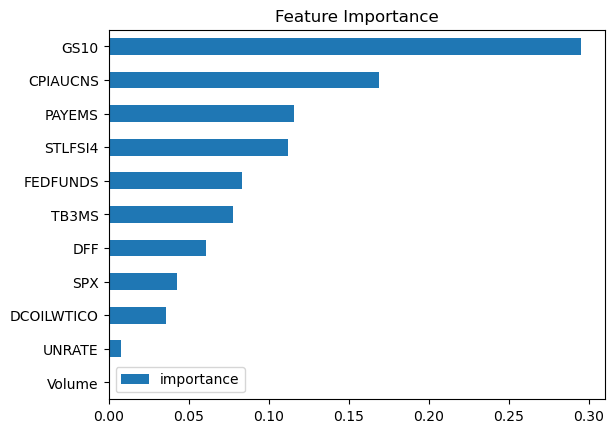

In [121]:
#important features
fi = pd.DataFrame(data=model.feature_importances_,
             index=model.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

### XGBOOST Final Model

In [157]:
train_df = df.loc[df.index <= '01-01-2021']
test_df = df.loc[df.index > '01-01-2023']
from sklearn.model_selection import TimeSeriesSplit
tss = TimeSeriesSplit(n_splits=len(test_df),test_size=1)

In [158]:
#final model - predicting next close

preds = []
scores = []
actuals = []

for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]


    features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']

    # features = ['sma_3', 'sma_5','sma_7','sma_20',
    # 'ema_9','Volume','bb_lower_band','bb_upper_band']




    target = 'Next_Close'

    X_train = train_df[features]
    y_train = train_df[target]

    X_test = test_df[features]
    y_test = test_df[target]

    model = xgb.XGBRegressor(booster='gbtree',
                           n_estimators=1000,
                           early_stopping_rounds=50,
                           objective='reg:squarederror',
                           max_depth=3,
                           learning_rate=0.1,
                           min_child_weight = 1,
                           n_jobs = -1)

    model.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=1000)

    y_pred = model.predict(X_test)
    preds.append(y_pred)
    actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
    actuals.extend(actual_dict)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)



[0]	validation_0-rmse:7.62314	validation_1-rmse:2.32110
[54]	validation_0-rmse:2.34647	validation_1-rmse:2.64121
[0]	validation_0-rmse:7.62130	validation_1-rmse:2.77060
[56]	validation_0-rmse:2.31976	validation_1-rmse:1.17280
[0]	validation_0-rmse:7.61954	validation_1-rmse:1.43972
[53]	validation_0-rmse:2.36368	validation_1-rmse:2.20322
[0]	validation_0-rmse:7.61762	validation_1-rmse:2.27993
[100]	validation_0-rmse:2.04855	validation_1-rmse:0.35488
[0]	validation_0-rmse:7.61578	validation_1-rmse:0.88945
[51]	validation_0-rmse:2.39325	validation_1-rmse:1.23874
[0]	validation_0-rmse:7.61384	validation_1-rmse:1.40010
[55]	validation_0-rmse:2.36119	validation_1-rmse:0.49176
[0]	validation_0-rmse:7.61192	validation_1-rmse:0.85968
[50]	validation_0-rmse:2.38028	validation_1-rmse:2.69609
[0]	validation_0-rmse:7.61005	validation_1-rmse:1.33761
[49]	validation_0-rmse:2.43817	validation_1-rmse:3.22239
[0]	validation_0-rmse:7.60824	validation_1-rmse:0.32517
[50]	validation_0-rmse:2.41675	validati

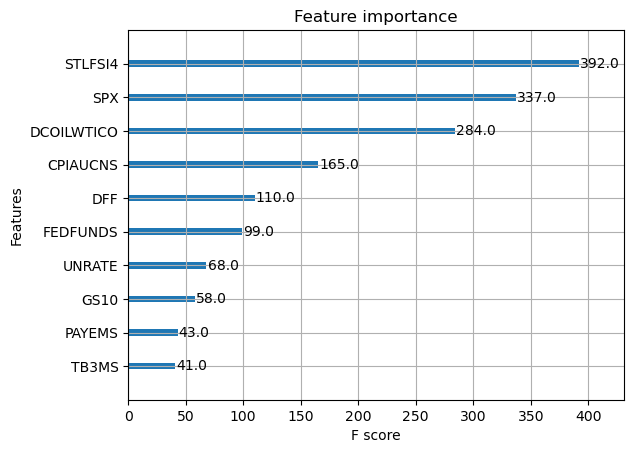

In [163]:
#Feature importances in the XGBOOST model

xgb.plot_importance(model)
plt.show()

In [123]:
y_test_df = pd.DataFrame(actuals)
y_test_df['Error'] = abs((y_test_df['Preds'] - y_test_df['Actual']) / y_test_df['Actual']) * 100

In [124]:
#r2 Score
r2_score(y_test_df['Actual'],y_test_df['Preds'])

0.8786897507684707

In [125]:
#On average my model may be off by ~$30 from the actuals
mean_absolute_error(y_test_df['Actual'],y_test_df['Preds'])

0.675213970812449

In [126]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 0.6752
Fold scores:[0.05552482604980469, 0.03510856628417969, 0.31107139587402344, 0.0019359588623046875, 0.17705726623535156, 0.000843048095703125, 0.8596763610839844, 1.3376121520996094, 0.32517242431640625, 0.09427452087402344, 0.2057323455810547, 0.1727771759033203, 0.13391876220703125, 0.4749126434326172, 0.5932655334472656, 0.9415321350097656, 1.1595287322998047, 0.2550010681152344, 0.2709636688232422, 1.7994880676269531, 0.936798095703125, 1.3348064422607422, 0.23250579833984375, 1.0010967254638672, 0.029083251953125, 3.0517578125e-05, 0.0020427703857421875, 0.1637401580810547, 0.1551494598388672, 0.8350410461425781, 0.09367942810058594, 0.008235931396484375, 1.8514842987060547, 1.2984085083007812, 0.0001163482666015625, 0.6983566284179688, 0.012561798095703125, 0.0313720703125, 0.044189453125, 0.10409164428710938, 1.1988048553466797, 1.0764713287353516, 0.09424972534179688, 0.5728340148925781, 1.2802104949951172, 3.2652206420898438, 3.6974239349365234, 0.5547

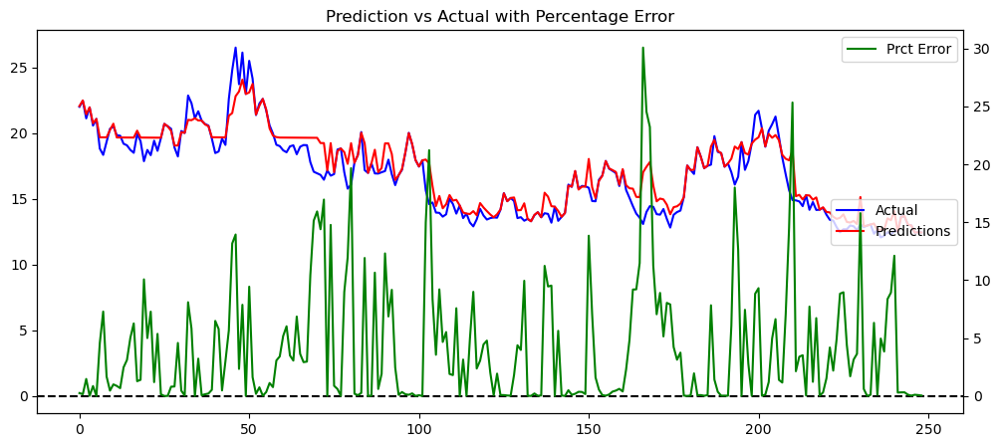

In [127]:
#pred vs actual regressor

fig, ax1 = plt.subplots(figsize=(12, 5))
ax1.plot(y_test_df.index, y_test_df['Actual'], label='Actual', color='blue')
ax1.plot(y_test_df.index, y_test_df['Preds'], label='Predictions', color='red')
ax1.axhline(0, color='black', linestyle='--')
ax1.legend(loc ='right')

ax2 = ax1.twinx()
ax2.plot(y_test_df.index, y_test_df['Error'], label='Prct Error', color='green')
ax2.legend(loc='upper right')


plt.title('Prediction vs Actual with Percentage Error')

plt.show()



### Neural Network Models

LSTM

In [128]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers

LSTM Parameter Tuning

In [129]:
train_df = df.loc[df.index <= '01-01-2022']
test_df = df.loc[df.index > '01-01-2023']
from sklearn.model_selection import TimeSeriesSplit
tss = TimeSeriesSplit(n_splits=3,test_size=1)

In [130]:
#LSTM parameter tuning
from sklearn.model_selection import ParameterGrid

# Define hyperparameter grid
param_grid = {
    'lstm_units': [32, 64, 128],
    'dense_units': [32, 64, 128],
    'learning_rate': [0.001, 0.01, 0.1]
}

best_score = float('inf')
best_params = None

for params in ParameterGrid(param_grid):
    preds = []
    scores = []
    actuals = []

    for train_idx, val_idx in tss.split(df):
        train_df = df.iloc[train_idx]
        test_df = df.iloc[val_idx]

        features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']

        target = 'Next_Close'

        X_train = train_df[features]
        y_train = train_df[target]

        X_test = test_df[features]
        y_test = test_df[target]

        # Reshape X_train and X_test if needed
        # X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        # X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        model = Sequential([
            layers.Input(shape=(len(features), 1)),
            layers.LSTM(params['lstm_units']),
            layers.Dense(params['dense_units'], activation='relu'),
            layers.Dense(params['dense_units'], activation='relu'),
            layers.Dense(1)
        ])
        model.compile(loss='mse', optimizer=Adam(learning_rate=params['learning_rate']), metrics=['mean_squared_error'])

        model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose=1)

        y_pred = model.predict(X_test)
        preds.append(y_pred)
        actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
        actuals.extend(actual_dict)
        score = np.sqrt(mean_squared_error(y_test, y_pred))
        scores.append(score)

    # Average score across cross-validation folds
    avg_score = np.mean(scores)

    # Update best parameters if a better score is found
    if avg_score < best_score:
        best_score = avg_score
        best_params = params

print("Best Parameters:", best_params)
print("Best Score:", best_score)


Epoch 1/10
63/63 [==============================] - 3s 12ms/step - loss: 364.3079 - mean_squared_error: 364.3079 - val_loss: 49.6434 - val_mean_squared_error: 49.6434
Epoch 2/10
63/63 [==============================] - 0s 3ms/step - loss: 87.1823 - mean_squared_error: 87.1823 - val_loss: 34.2569 - val_mean_squared_error: 34.2569
Epoch 3/10
63/63 [==============================] - 0s 3ms/step - loss: 54.6572 - mean_squared_error: 54.6572 - val_loss: 34.8392 - val_mean_squared_error: 34.8392
Epoch 4/10
63/63 [==============================] - 0s 3ms/step - loss: 48.6987 - mean_squared_error: 48.6987 - val_loss: 28.8283 - val_mean_squared_error: 28.8283
Epoch 5/10
63/63 [==============================] - 0s 4ms/step - loss: 44.5036 - mean_squared_error: 44.5036 - val_loss: 29.8721 - val_mean_squared_error: 29.8721
Epoch 6/10
63/63 [==============================] - 0s 3ms/step - loss: 41.7616 - mean_squared_error: 41.7616 - val_loss: 22.5711 - val_mean_squared_error: 22.5711
Epoch 7/10
63

In [131]:
train_df = df.loc[df.index <= '01-01-2022']
test_df = df.loc[df.index > '01-01-2023']
from sklearn.model_selection import TimeSeriesSplit
tss = TimeSeriesSplit(n_splits=len(test_df),test_size=1)

In [132]:
#LSTM model
preds = []
scores = []
actuals = []

for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]

    features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']

    target = 'Next_Close'

    X_train = train_df[features]
    y_train = train_df[target]

    X_test = test_df[features]
    y_test = test_df[target]

    # # X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
    # # X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

    model = Sequential([
        layers.Input(shape=(len(features), 1)),
        layers.LSTM(64),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(loss='mse', 
              optimizer=Adam(learning_rate=0.01),
              metrics=['mean_squared_error'])

    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose=1)

    y_pred = model.predict(X_test)
    preds.append(y_pred)
    actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
    actuals.extend(actual_dict)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)


Epoch 1/10
56/56 [==============================] - 3s 11ms/step - loss: 108.0064 - mean_squared_error: 108.0064 - val_loss: 22.6386 - val_mean_squared_error: 22.6386
Epoch 2/10
56/56 [==============================] - 0s 3ms/step - loss: 46.5746 - mean_squared_error: 46.5746 - val_loss: 57.8673 - val_mean_squared_error: 57.8673
Epoch 3/10
56/56 [==============================] - 0s 3ms/step - loss: 42.7527 - mean_squared_error: 42.7527 - val_loss: 8.9742 - val_mean_squared_error: 8.9742
Epoch 4/10
56/56 [==============================] - 0s 3ms/step - loss: 38.5833 - mean_squared_error: 38.5833 - val_loss: 0.5679 - val_mean_squared_error: 0.5679
Epoch 5/10
56/56 [==============================] - 0s 3ms/step - loss: 39.7235 - mean_squared_error: 39.7235 - val_loss: 36.2611 - val_mean_squared_error: 36.2611
Epoch 6/10
56/56 [==============================] - 0s 3ms/step - loss: 36.9502 - mean_squared_error: 36.9502 - val_loss: 12.0341 - val_mean_squared_error: 12.0341
Epoch 7/10
56/56 

In [133]:
y_test_df = pd.DataFrame(actuals)
y_test_df['Error'] = abs((y_test_df['Preds'] - y_test_df['Actual']) / y_test_df['Actual']) * 100

In [134]:
#r2 Score
r2_score(y_test_df['Actual'],y_test_df['Preds'])

-0.9837182981494486

In [135]:
#On average my model may be off by ~3pts from the actuals
mean_absolute_error(y_test_df['Actual'],y_test_df['Preds'])

3.6105972159818474

In [136]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 3.6106
Fold scores:[5.3275146484375, 6.035099029541016, 3.1367130279541016, 3.4014453887939453, 1.2926521301269531, 1.7713184356689453, 0.5825252532958984, 4.066028594970703, 0.7805309295654297, 2.3946800231933594, 5.218315124511719, 0.1567668914794922, 1.0097312927246094, 3.0377559661865234, 3.8331165313720703, 1.5825691223144531, 0.1252613067626953, 4.922113418579102, 0.1532268524169922, 0.38191986083984375, 0.6508502960205078, 0.062042236328125, 3.1032276153564453, 3.023566246032715, 0.8327255249023438, 1.2571067810058594, 1.760732650756836, 0.7649021148681641, 3.6270675659179688, 1.3632755279541016, 3.0518341064453125, 5.348606109619141, 1.0866012573242188, 2.9694271087646484, 4.517141342163086, 7.4748687744140625, 1.087270736694336, 0.05390167236328125, 1.258859634399414, 1.8480587005615234, 5.121213912963867, 0.9007472991943359, 0.33514404296875, 0.9469680786132812, 5.576725006103516, 3.414796829223633, 4.4034881591796875, 6.496580123901367, 4.352298736572266, 

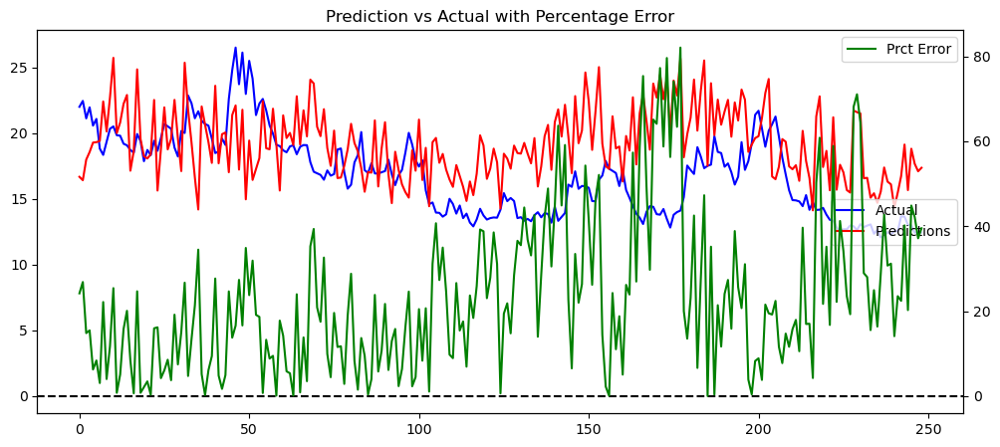

In [137]:
#pred vs actual regressor

fig, ax1 = plt.subplots(figsize=(12, 5))
ax1.plot(y_test_df.index, y_test_df['Actual'], label='Actual', color='blue')
ax1.plot(y_test_df.index, y_test_df['Preds'], label='Predictions', color='red')
ax1.axhline(0, color='black', linestyle='--')
ax1.legend(loc ='right')

ax2 = ax1.twinx()
ax2.plot(y_test_df.index, y_test_df['Error'], label='Prct Error', color='green')
ax2.legend(loc='upper right')


plt.title('Prediction vs Actual with Percentage Error')

plt.show()



Sequential

In [138]:
#sequential model
preds = []
scores = []
actuals = []

for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]

    features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']

    target = 'Next_Close'

    X_train = train_df[features]
    y_train = train_df[target]

    X_test = test_df[features]
    y_test = test_df[target]

    model = Sequential([
        layers.Input(shape=(len(features),)),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])

    model.compile(loss='mse',
                  optimizer=Adam(learning_rate=0.01),
                  metrics=['mean_absolute_error'])

    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose=1)

    y_pred = model.predict(X_test)
    preds.append(y_pred)
    actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
    actuals.extend(actual_dict)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

Epoch 1/10


56/56 [==============================] - 1s 3ms/step - loss: 3145411.0000 - mean_absolute_error: 897.1307 - val_loss: 38.5787 - val_mean_absolute_error: 6.2112
Epoch 2/10
56/56 [==============================] - 0s 1ms/step - loss: 2793.0703 - mean_absolute_error: 39.1949 - val_loss: 1.4751 - val_mean_absolute_error: 1.2145
Epoch 3/10
56/56 [==============================] - 0s 1ms/step - loss: 375.0138 - mean_absolute_error: 15.2284 - val_loss: 38.6091 - val_mean_absolute_error: 6.2136
Epoch 4/10
56/56 [==============================] - 0s 1ms/step - loss: 341.2309 - mean_absolute_error: 14.5320 - val_loss: 202.4554 - val_mean_absolute_error: 14.2287
Epoch 5/10
56/56 [==============================] - 0s 1ms/step - loss: 364.0720 - mean_absolute_error: 14.7340 - val_loss: 0.1743 - val_mean_absolute_error: 0.4175
Epoch 6/10
56/56 [==============================] - 0s 1ms/step - loss: 268.0447 - mean_absolute_error: 12.5701 - val_loss: 5.8416 - val_mean_absolute_error: 2.4169
Epoch 7/10

In [139]:
y_test_df = pd.DataFrame(actuals)
y_test_df['Error'] = abs((y_test_df['Preds'] - y_test_df['Actual']) / y_test_df['Actual']) * 100

In [140]:
#r2 Score
r2_score(y_test_df['Actual'],y_test_df['Preds'])

-102.01715254389671

In [141]:
#On average my model may be off by ~17pts from the actuals, LTSM performs better
mean_absolute_error(y_test_df['Actual'],y_test_df['Preds'])

17.715521804569477

In [142]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 17.7155
Fold scores:[28.698328018188477, 9.480247497558594, 3.082487106323242, 2.84210205078125, 9.919404029846191, 5.576055526733398, 11.335304260253906, 2.2008533477783203, 14.85565185546875, 4.522298812866211, 1.550710678100586, 101.23001670837402, 7.87168025970459, 1.9090900421142578, 80.17151069641113, 5.329919815063477, 10.194839477539062, 4.727836608886719, 3.786452293395996, 6.648687362670898, 37.80207443237305, 12.601850509643555, 15.898994445800781, 15.97701621055603, 1.3017559051513672, 1.911346435546875, 4.74226188659668, 18.615437030792236, 4.561079025268555, 6.670269966125488, 13.793923377990723, 2.0293197631835938, 24.175866842269897, 183.30928802490234, 5.0413818359375, 10.527822494506836, 2.8712902069091797, 29.50458526611328, 6.235464096069336, 3.203094482421875, 10.096969604492188, 11.831703186035156, 4.493921279907227, 4.257000923156738, 0.2724132537841797, 14.846466064453125, 24.155827522277832, 1.8680763244628906, 5.660917282104492, 2.2209510803

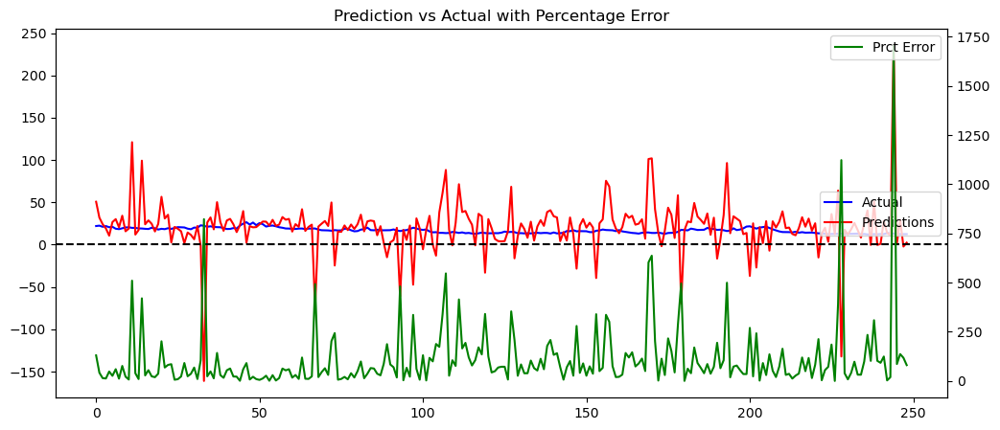

In [143]:
#pred vs actual regressor

fig, ax1 = plt.subplots(figsize=(12, 5))
ax1.plot(y_test_df.index, y_test_df['Actual'], label='Actual', color='blue')
ax1.plot(y_test_df.index, y_test_df['Preds'], label='Predictions', color='red')
ax1.axhline(0, color='black', linestyle='--')
ax1.legend(loc ='right')

ax2 = ax1.twinx()
ax2.plot(y_test_df.index, y_test_df['Error'], label='Prct Error', color='green')
ax2.legend(loc='upper right')


plt.title('Prediction vs Actual with Percentage Error')

plt.show()



ARIMA

In [144]:
from statsmodels.tsa.arima.model import ARIMA
from itertools import product


best_score = float('inf')
best_params = None

for p, d, q in product(range(3), repeat=3):
    preds = []
    scores = []
    actuals = []

    for train_idx, val_idx in tss.split(df):
        train_df = df.iloc[train_idx]
        test_df = df.iloc[val_idx]

        target = 'Next_Close'

        y_train = train_df[target]
        y_test = test_df[target]

        try:
            # Fit ARIMA model
            order = (p, d, q)
            model = ARIMA(y_train, order=order)
            model_fit = model.fit()

            # Forecast
            y_pred = model_fit.forecast(steps=len(y_test))

            preds.append(y_pred)
            actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
            actuals.extend(actual_dict)

            # Calculate RMSE
            score = np.sqrt(mean_squared_error(y_test, y_pred))
            scores.append(score)
        except:
            continue  # Ignore cases where the model fails to converge

    avg_score = np.mean(scores)

    # Update best parameters if current combination performs better
    if avg_score < best_score:
        best_score = avg_score
        best_params = (p, d, q)

print(f"Best Parameters: p={best_params[0]}, d={best_params[1]}, q={best_params[2]}")
#p = 0, d=2, q=2

c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\U

Best Parameters: p=0, d=2, q=2


c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [145]:
#ARIMA


preds = []
scores = []
actuals = []

for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]

    target = 'Next_Close'

    y_train = train_df[target]
    y_test = test_df[target]

    order = (0, 2, 2)
    model = ARIMA(y_train, order=order)
    model_fit = model.fit()

    y_pred = model_fit.forecast(steps=len(y_test))

    preds.append(y_pred)
    actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred)]
    actuals.extend(actual_dict)

    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)


c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\U

In [146]:
y_test_df = pd.DataFrame(actuals)
y_test_df['Error'] = abs((y_test_df['Preds'] - y_test_df['Actual']) / y_test_df['Actual']) * 100

In [147]:
#r2 Score
r2_score(y_test_df['Actual'],y_test_df['Preds'])

0.8967106436119644

In [148]:
#On average my model may be off by ~0.74pts from the actuals
mean_absolute_error(y_test_df['Actual'],y_test_df['Preds'])

0.7387471214521597

In [149]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 0.7387
Fold scores:[0.6491803461007599, 0.3228480793177866, 1.268921546100497, 0.5930813387056162, 1.276168165155248, 0.26189335445035766, 2.2099299922838824, 0.908611844377873, 0.8347120737700848, 1.1425108041332308, 0.40123191570434713, 0.5926436162298145, 0.15467662053862696, 0.6401000574397777, 0.2434000850224578, 0.39689599548724885, 0.2963395149222414, 1.3732450888720287, 0.2737855016647437, 1.582885903434331, 0.5539354015060418, 0.29191376744014264, 1.0441340209072933, 0.5671045257904588, 0.860594947825561, 1.24721591971878, 0.06155628997845852, 0.17847777831843104, 1.4649659269033286, 0.9639486943077458, 1.7539907296550759, 0.19032431708869169, 2.8867993114396313, 0.021403970552139384, 1.1556261252435611, 0.304956956193724, 0.6618868796540305, 0.37902088735256, 0.1941248947273202, 1.0281282416203688, 1.299656741631864, 0.13115466056477132, 0.9552227912186879, 0.2945557055006134, 3.443215236229207, 2.856187310734299, 2.2672326154060087, 2.359373151765734, 1.95

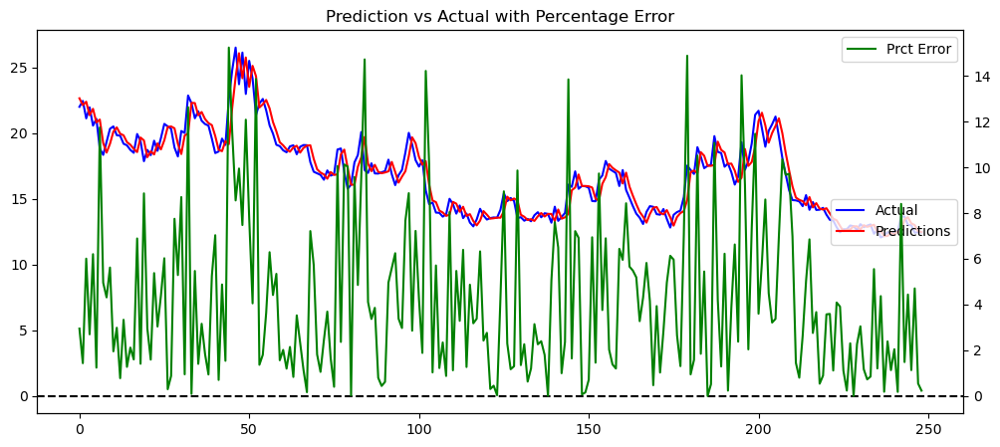

In [150]:
#pred vs actual regressor

fig, ax1 = plt.subplots(figsize=(12, 5))
ax1.plot(y_test_df.index, y_test_df['Actual'], label='Actual', color='blue')
ax1.plot(y_test_df.index, y_test_df['Preds'], label='Predictions', color='red')
ax1.axhline(0, color='black', linestyle='--')
ax1.legend(loc ='right')

ax2 = ax1.twinx()
ax2.plot(y_test_df.index, y_test_df['Error'], label='Prct Error', color='green')
ax2.legend(loc='upper right')


plt.title('Prediction vs Actual with Percentage Error')

plt.show()



SARIMAX

In [151]:
from statsmodels.tsa.statespace.sarimax import SARIMAX


preds = []
scores = []
actuals = []

features = ['Volume', 'SPX',
       'CPIAUCNS', 'FEDFUNDS', 'UNRATE', 'PAYEMS', 'DFF', 'TB3MS', 'GS10',
       'STLFSI4', 'DCOILWTICO']

for train_idx, val_idx in tss.split(df):
    train_df = df.iloc[train_idx]
    test_df = df.iloc[val_idx]

    target = 'Next_Close'

    y_train = train_df[target]
    y_test = test_df[target]


    X_train = train_df[features]
    X_test = test_df[features]

    order = (0, 2, 2)
    model = SARIMAX(y_train, exog=X_train, order=order, enforce_stationarity=False)
    model_fit = model.fit()

    # Forecast
    y_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test)
    y_pred_mean = y_pred.predicted_mean

    preds.append(y_pred_mean)
    actual_dict = [{'Date': date, 'Actual': actual, "Preds": pred} for date, actual, pred in zip(test_df.index, y_test, y_pred_mean)]
    actuals.extend(actual_dict)

    score = np.sqrt(mean_squared_error(y_test, y_pred_mean))
    scores.append(score)


c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\faroq\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\faroq\anaconda3\Lib\sit

In [152]:
y_test_df = pd.DataFrame(actuals)
y_test_df['Error'] = abs((y_test_df['Preds'] - y_test_df['Actual']) / y_test_df['Actual']) * 100

In [153]:
#r2 Score
r2_score(y_test_df['Actual'],y_test_df['Preds'])

0.8812052397178347

In [154]:
#On average my model may be off by ~0.77 from the actuals
mean_absolute_error(y_test_df['Actual'],y_test_df['Preds'])

0.794378909978994

In [155]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 0.7944
Fold scores:[0.21276479991457364, 0.05687796789149502, 1.0786179469667658, 0.03915301895992229, 1.277630788742357, 0.3098537270252706, 2.4181315536718557, 0.6430837862467484, 1.015907043079622, 1.190268918174894, 0.6372125049228927, 0.42925843832607313, 0.35941594056600223, 0.9298682748857487, 0.23344435549864784, 0.3551206413564927, 0.4321596027823418, 1.5706234236264365, 0.1634281187422033, 1.7692309283919059, 0.9311238326286677, 1.0090044891479977, 1.814212008420398, 0.48910163460956113, 0.7776406065171386, 1.4341153564731002, 0.1188745059598375, 0.07928082421870641, 1.8773669730956044, 0.9211341145662999, 1.74201740687554, 0.322117108478011, 2.75003647476818, 0.09042202141524314, 1.156760805054418, 0.3047250337313585, 0.7944162967157027, 0.3894368562950419, 0.11147858113101705, 0.8519329151544142, 1.398058444860112, 0.26754378504083576, 0.9665205533224253, 0.23252535568559551, 3.4492850425242665, 2.882937355022186, 1.8584238924626746, 3.4040573576854953, 1

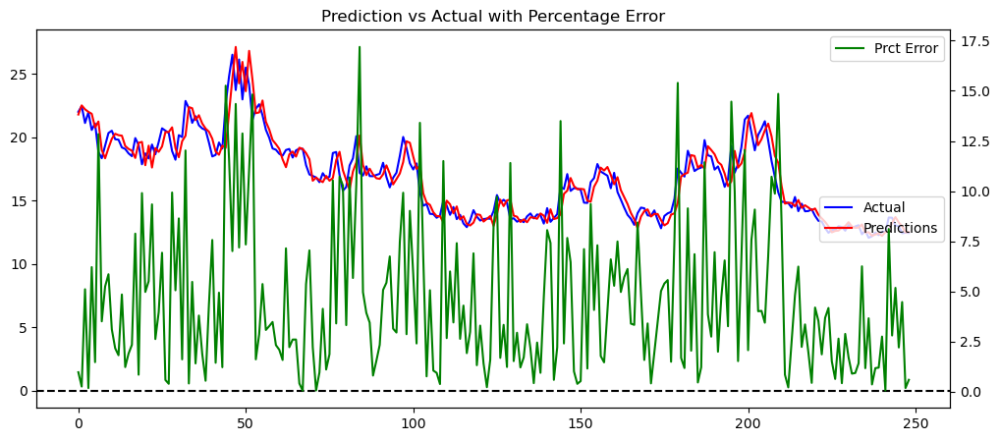

In [156]:
#pred vs actual regressor

fig, ax1 = plt.subplots(figsize=(12, 5))
ax1.plot(y_test_df.index, y_test_df['Actual'], label='Actual', color='blue')
ax1.plot(y_test_df.index, y_test_df['Preds'], label='Predictions', color='red')
ax1.axhline(0, color='black', linestyle='--')
ax1.legend(loc ='right')

ax2 = ax1.twinx()
ax2.plot(y_test_df.index, y_test_df['Error'], label='Prct Error', color='green')
ax2.legend(loc='upper right')


plt.title('Prediction vs Actual with Percentage Error')

plt.show()

